## In this project, BoM and CCRS scientists are collaborating to analyse rainfall extremes in the SING-V downscaled simulations and the CMIP6 ensemble. The aim is to better understand the projected changes in rainfall extremes with global warming in the Singapore region and beyond. 

### Benefit to CCRS:

* National climate change reporting for policy guidance
* Regional information to benefit partners of CCRS
* Scientific publication to underpin new methods and services

### Benefit to BoM:

* New methods benefitting the Australian Climate Service
* Regional information to benefit partners of BoM (in SE Asia)
* Scientific publication to underpin new methods and services


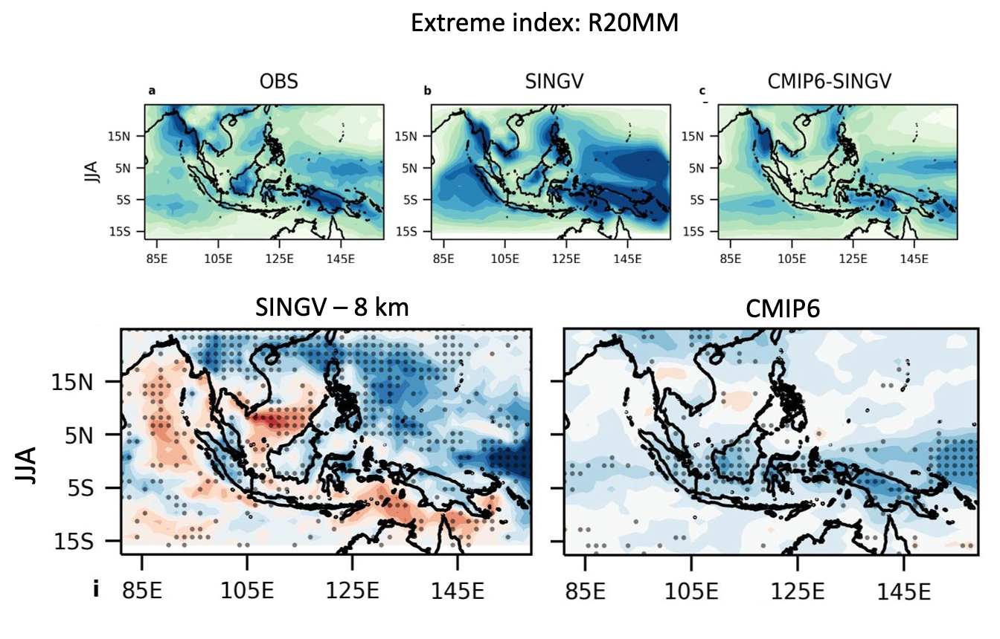


## Table of Contents
* [1 - Notebook Initialisation](#chapter1)
    * [1.1 Import modules](#section_1_1)
    * [1.2 Define main variables](#section_1_2)
    * [1.3 Define main functions](#section_1_3)

* [2 - Main computation](#chapter2)
    * [2.1 Observations](#section_2_1)
    * [2.2 Models](#section_2_2)
        * [2.2.1 CMIP6](#sub_section_2_2_1)
        * [2.2.2 SINGV](#sub_section_2_2_2)
        * [2.2.2 Seasonal Means](#sub_section_2_2_3)

* [3 - Main results](#chapter3)
    * [3.1 Evaluation](#section_3_1)
        * [3.1.1 Regional Maps](#sub_section_3_1_1)
        * [3.1.2 Added value](#sub_section_3_1_2)
        * [3.1.2 Singapore location](#sub_section_3_1_3)

    * [3.2 Climate change](#section_3_2)
        * [3.2.1 Scatter plots](#sub_section_3_2_1)
        * [3.2.2 Regional maps](#sub_section_3_2_2)
        * [3.2.3 Singapore location](#sub_section_3_2_3)
        * [3.2.4 Individual model regional maps](#sub_section_3_2_4)

## Notebook Initialisation <a class="anchor" id="chapter1"></a>

### Import modules <a class="anchor" id="section_1_1"></a>

In [1]:
from cmip_catalog import *
from singapore_project.plot_Taylor import *
import dask.bag as db
from dask.diagnostics import ProgressBar
import xarray as xr
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
#from netCDF4 import Dataset 
import glob
import os
import xarray as xr
import cartopy.crs as ccrs
import seaborn as sns
#import icclim
from cdo import *  
cdo = Cdo()
import xskillscore as xs
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import pickle
from scipy import stats

### Defines main variables <a class="anchor" id="section_1_2"></a>

In [2]:
path_out  ='/g/data/eg3/pfd548/data/singapore_project'
mask_land = xr.open_dataset('/home/548/pfd548/code/singapore_project/mask_land_nan_miss_gr15_SEA.nc')
mask_sea = xr.open_dataset('/home/548/pfd548/code/singapore_project/mask_sea_nan_miss_gr15_SEA.nc')
#--
varname = 'rx1day'
varname_infile= 'RX1day'
# varname = 'r20mm'
# varname_infile= 'R20mm'
# varname = 'pr'
# varname_infile= 'pr'
mlist_common_CMIP6_1 = search_common_models_CMIP6('/g/data/lp01/collections/py3.9_dev/nci-cmip6_gr1.5.json', 'mon', select = {'experiment_id':['historical','ssp126','ssp245','ssp585'],'variable_id':[varname],'member_id':['r1i1p1f1']})
mlist_common_CMIP6_2 = search_common_models_CMIP6('/g/data/lp01/collections/py3.9_dev/nci-cmip6_gr1.5.json', 'mon', select = {'experiment_id':['historical','ssp126','ssp245','ssp585'],'variable_id':[varname],'member_id':['r1i1p1f2']})
mlist_common_CMIP6 = mlist_common_CMIP6_1 + mlist_common_CMIP6_2
len(mlist_common_CMIP6)


25

### Defines main functions <a class="anchor" id="section_1_3"></a>

In [3]:
def read_scenario(arglist) :
    
    df, scenario, model_name, start, end, member, varname, grid_label = arglist
    
    if model_name == 'ACCESS-CM2': member = 'r4i1p1f1'
    file_name = df.path.where((df.source_id == model_name) & (df.variable_id == varname) & (df.experiment_id == scenario) & (df.member_id == member) & (df.grid_label == grid_label)).dropna().values
    if len(file_name) == 0 :
        file_name = df.path.where((df.source_id == model_name) & (df.variable_id == varname) & (df.experiment_id == scenario) & (df.member_id == 'r1i1p1f2') & (df.grid_label == grid_label)).dropna().values
        member = 'r1i1p1f2'
    if len(file_name) == 0 :
        raise Exception('no r1i1p1f1  or r1i1p1f2')

    if len(file_name) > 0 :
        version = df.version.where((df.source_id == model_name) & (df.variable_id == varname) & (df.experiment_id == scenario) & (df.member_id == member) & (df.grid_label == grid_label)).dropna().values
        file_name = file_name[version == version.max()][0]

    print(file_name)
    #-- Read netcf
    vardata = xr.open_dataset(file_name, decode_times=True).sel( time = slice(str(start),str(end)))
    #-
    time_month = pd.date_range(start=str(start),end = str(end+1), freq ='M')
    if time_month.time.size == vardata.time.size :
        vardata['time'] = time_month
    else :
        raise Exception('wrong number of timesteps in file :',file_name)
        
    vardata['time'] = pd.date_range(start=str(start),end = str(end+1), freq ='M')
    
    return [vardata.drop('time_bounds'),model_name]

def buffer_CMIP(arglist):
    try:
        rslt = read_scenario(arglist)
    except Exception:
        return [None,None]
    return rslt

def parallel_function(arglist):
    bag = db.from_sequence(arglist).map(read_scenario)
    with ProgressBar():
        varlist = bag.compute()   
        
    var_season = xr.concat([var[0] for var in varlist if var[1] != None], dim='models')
    var_season['models'] = [var[1] for var in varlist if var[1] != None]

    return var_season


def read_obs(file, variable,start) :
    vardata = xr.open_dataset(file, decode_times=True)
    tmpfilename = '/g/data/eg3/%s/icclim_tmp%s.nc' % (os.environ['USER'],str(start))
    cdo.remapcon('r240x120',options='-P 28 -v', input=vardata , output=tmpfilename)
    vardata2 = xr.open_dataset(tmpfilename, decode_times=True, cache = False)[variable]
    if os.path.isfile(tmpfilename) == True : os.remove(tmpfilename)
    xx1 = icclim.rx5day(in_files=vardata2, var_name=variable, slice_mode='month', logs_verbosity='LOW')
    xx2 = icclim.r10mm(in_files=vardata2, var_name=variable, slice_mode='month', logs_verbosity='LOW')
    xx3 = icclim.r20mm(in_files=vardata2, var_name=variable, slice_mode='month', logs_verbosity='LOW')
    xx4 = icclim.rx1day(in_files=vardata2, var_name=variable, slice_mode='month', logs_verbosity='LOW')
    if os.path.isfile(tmpfilename) == True : os.remove(tmpfilename)

    
    return xr.merge([xx1,xx2,xx3,xx4])
    
def stipple_points(array1,array2, nmod):
    diff = (array1 - array2)
    diff2 = diff.where(diff >= 0).count(dim = 'models')
    mask = np.logical_or(diff2/nmod > 0.7,diff2/nmod < 0.3)
    lon_sub, lat_sub = np.meshgrid(array1['lon'], array1['lat'])
    xPoints = lon_sub[mask.values]
    yPoints = lat_sub[mask.values]
    
    return xPoints,yPoints


def stipple_points2(array1, nmod):
    diff2 = array1.where(array1 > 0).count(dim = 'models')
    mask = diff2/nmod > 0.6
    lon_sub, lat_sub = np.meshgrid(array1['lon'], array1['lat'])
    xPoints = lon_sub[mask.values]
    yPoints = lat_sub[mask.values]
    
    return xPoints,yPoints

## 2 - Main computation <a class="anchor" id="chapter2"></a>

### 2.1 Observation <a class="anchor" id="section_2_1"></a>

In [4]:
compute_obs = 0
if compute_obs :
    l=[]
    for i in range(1995,2015):
    #for i in range(1995,1997):
        print(i)
        file = '/g/data/ia39/aus-ref-clim-data-nci/frogs/data/1DD_V1/PERSIANN_CCS_CDR/PERSIANN_CCS_CDR.1DD.' + str(i) + '.nc' 
        xx = read_obs(file,'rain',i)
        l.append(xx)

    PERSIANN_CCS_CDR = xr.concat(l, dim='time')
    PERSIANN_CCS_CDR.to_netcdf('/home/548/pfd548/code/singapore_project/PERSIANN_CCS_CDR.1DD.ICCLIM.nc')
else :
    PERSIANN_CCS_CDR = xr.open_dataset('/home/548/pfd548/code/singapore_project/PERSIANN_CCS_CDR.1DD.ICCLIM.nc', decode_times=True)

### 2.2 Models <a class="anchor" id="section_2_2"></a>

In [10]:
# Load catalogs
col = intake.open_esm_datastore('/g/data/lp01/collections/py3.9_dev/nci-cmip6_gr1.5.json')
df_cmip6 = col.search(table_id='mon',variable_id='rxday',experiment_id=['historical','ss245'],member_id='r1i1p1f1').df
df_cmip6.grid_label

0     gr1.5
1     gr1.5
2     gr1.5
3     gr1.5
4     gr1.5
5     gr1.5
6     gr1.5
7     gr1.5
8     gr1.5
9     gr1.5
10    gr1.5
11    gr1.5
12    gr1.5
13    gr1.5
14    gr1.5
15    gr1.5
16    gr1.5
17    gr1.5
18    gr1.5
19    gr1.5
20    gr1.5
21    gr1.5
22    gr1.5
23    gr1.5
24    gr1.5
25    gr1.5
26    gr1.5
27    gr1.5
28    gr1.5
29    gr1.5
30    gr1.5
31    gr1.5
32    gr1.5
33    gr1.5
34    gr1.5
35    gr1.5
36    gr1.5
Name: grid_label, dtype: object

#### 2.2.1 CMIP6 <a class="anchor" id="sub_section_2_2_1"></a>

In [6]:
#--
arglist = [(df_cmip6,'historical',mname,1995,2014,'r1i1p1f1',varname,'gr1.5') for mname in mlist_common_CMIP6]
rx1dayETCCDI = parallel_function(arglist)#[nseasc]#.squeeze()
#--
arglist_ssp = [(df_cmip6,'ssp126',mname ,2040,2059,'r1i1p1f1',varname,'gr1.5') for mname in mlist_common_CMIP6]
rx1dayETCCDI_ssp126_early = parallel_function(arglist_ssp)
#--
arglist_ssp = [(df_cmip6,'ssp245',mname ,2040,2059,'r1i1p1f1',varname,'gr1.5') for mname in mlist_common_CMIP6]
rx1dayETCCDI_ssp245_early = parallel_function(arglist_ssp)
#--
arglist_ssp = [(df_cmip6,'ssp585',mname ,2040,2059,'r1i1p1f1',varname,'gr1.5') for mname in mlist_common_CMIP6]
rx1dayETCCDI_ssp585_early = parallel_function(arglist_ssp)
#--
arglist_ssp = [(df_cmip6,'ssp126',mname ,2080,2099,'r1i1p1f1',varname,'gr1.5') for mname in mlist_common_CMIP6]
rx1dayETCCDI_ssp126_late = parallel_function(arglist_ssp)
#--
arglist_ssp = [(df_cmip6,'ssp245',mname ,2080,2099,'r1i1p1f1',varname,'gr1.5') for mname in mlist_common_CMIP6]
rx1dayETCCDI_ssp245_late = parallel_function(arglist_ssp)
#--
arglist_ssp = [(df_cmip6,'ssp585',mname ,2080,2099,'r1i1p1f1',varname,'gr1.5') for mname in mlist_common_CMIP6]
rx1dayETCCDI_ssp585_late = parallel_function(arglist_ssp)

[########################################] | 100% Completed | 3.55 ss
/g/data/lp01/CMIP6/CMIP/CAS/FGOALS-g3/historical/r1i1p1f1/mon/rx1day/gr1.5/v20190826/rx1day_mon_FGOALS-g3_historical_r1i1p1f1_gr1.5_185001-201412.nc
/g/data/lp01/CMIP6/CMIP/CSIRO-ARCCSS/ACCESS-CM2/historical/r4i1p1f1/mon/rx1day/gr1.5/v20210607/rx1day_mon_ACCESS-CM2_historical_r4i1p1f1_gr1.5_185001-201412.nc
/g/data/lp01/CMIP6/CMIP/CCCma/CanESM5/historical/r1i1p1f1/mon/rx1day/gr1.5/v20190429/rx1day_mon_CanESM5_historical_r1i1p1f1_gr1.5_185001-201412.nc
/g/data/lp01/CMIP6/CMIP/NCAR/CESM2-WACCM/historical/r1i1p1f1/mon/rx1day/gr1.5/v20190415/rx1day_mon_CESM2-WACCM_historical_r1i1p1f1_gr1.5_185001-201412.nc
/g/data/lp01/CMIP6/CMIP/NUIST/NESM3/historical/r1i1p1f1/mon/rx1day/gr1.5/v20190812/rx1day_mon_NESM3_historical_r1i1p1f1_gr1.5_185001-201412.nc
/g/data/lp01/CMIP6/CMIP/NOAA-GFDL/GFDL-ESM4/historical/r1i1p1f1/mon/rx1day/gr1.5/v20190726/rx1day_mon_GFDL-ESM4_historical_r1i1p1f1_gr1.5_185001-201412.nc
/g/data/lp01/CMIP6/CMI

In [7]:
#--
arglist_ssp = [(df_cmip6,'ssp126',mname ,2080,2099,'r1i1p1f1',varname,'gr1.5') for mname in mlist_common_CMIP6]
rx1dayETCCDI_ssp126_late = parallel_function(arglist_ssp)

[########################################] | 100% Completed | 2.35 ss
/g/data/lp01/CMIP6/ScenarioMIP/INM/INM-CM5-0/ssp126/r1i1p1f1/mon/rx1day/gr1.5/v20190619/rx1day_mon_INM-CM5-0_ssp126_r1i1p1f1_gr1.5_201501-210012.nc
/g/data/lp01/CMIP6/ScenarioMIP/AS-RCEC/TaiESM1/ssp126/r1i1p1f1/mon/rx1day/gr1.5/v20210323/rx1day_mon_TaiESM1_ssp126_r1i1p1f1_gr1.5_201501-210012.nc
/g/data/lp01/CMIP6/ScenarioMIP/BCC/BCC-CSM2-MR/ssp126/r1i1p1f1/mon/rx1day/gr1.5/v20190315/rx1day_mon_BCC-CSM2-MR_ssp126_r1i1p1f1_gr1.5_201501-210012.nc
/g/data/lp01/CMIP6/ScenarioMIP/CMCC/CMCC-ESM2/ssp126/r1i1p1f1/mon/rx1day/gr1.5/v20210126/rx1day_mon_CMCC-ESM2_ssp126_r1i1p1f1_gr1.5_201501-210012.nc
/g/data/lp01/CMIP6/ScenarioMIP/NCC/NorESM2-MM/ssp126/r1i1p1f1/mon/rx1day/gr1.5/v20191108/rx1day_mon_NorESM2-MM_ssp126_r1i1p1f1_gr1.5_201501-210012.nc
/g/data/lp01/CMIP6/ScenarioMIP/KIOST/KIOST-ESM/ssp126/r1i1p1f1/mon/rx1day/gr1.5/v20210601/rx1day_mon_KIOST-ESM_ssp126_r1i1p1f1_gr1.5_201501-210012.nc
/g/data/lp01/CMIP6/ScenarioMIP/MP

In [8]:
mlist_common_CMIP6

['FGOALS-g3',
 'ACCESS-CM2',
 'CanESM5',
 'CESM2-WACCM',
 'NESM3',
 'GFDL-ESM4',
 'INM-CM5-0',
 'TaiESM1',
 'BCC-CSM2-MR',
 'CMCC-ESM2',
 'NorESM2-MM',
 'KIOST-ESM',
 'MIROC6',
 'MPI-ESM1-2-HR',
 'CMCC-CM2-SR5',
 'INM-CM4-8',
 'MRI-ESM2-0',
 'IPSL-CM6A-LR',
 'MPI-ESM1-2-LR',
 'EC-Earth3',
 'KACE-1-0-G',
 'UKESM1-0-LL',
 'CNRM-CM6-1',
 'MIROC-ES2L',
 'CNRM-ESM2-1']

In [9]:
# df, scenario, model_name, start, end, member, varname, grid_label = arglist[0]
# version = df.version.where((df.source_id == model_name) & (df.variable_id == varname) & (df.experiment_id == scenario) & (df.member_id == 'r1i1p1f2') & (df.grid_label == grid_label)).dropna().values
# version

In [10]:
# arglist = [(df_cmip6,'historical',mname,1995,2014,'r1i1p1f1',varname,'gr1.5') for mname in mlist_common_CMIP6]
# ll=[]
# for arg in arglist :
#     buffer_CMIP(arg)
# #rx1dayETCCDI = parallel_function(arglist)#[nseasc]#.squeeze()

#### 2.2.2 SINGV <a class="anchor" id="sub_section_2_2_2"></a>

In [11]:
file = open('/home/548/pfd548/code/singapore_project/singv_max_icclim2.pickle', 'rb')
singv_hist, singv_hist_std, singv_early_ssp126 ,singv_early_ssp245 ,singv_early_ssp585, singv_late_ssp126 ,singv_late_ssp245 ,singv_late_ssp585 = pickle.load(file)
# singv_hist = singv_hist * mask_land['topo']
# singv_early_ssp126 = singv_early_ssp126 * mask_land['topo']
# singv_early_ssp245 = singv_early_ssp245 * mask_land['topo']
# singv_early_ssp585 = singv_early_ssp585 * mask_land['topo']
# singv_late_ssp126 = singv_late_ssp126 * mask_land['topo']
# singv_late_ssp245 = singv_late_ssp245 * mask_land['topo']
# singv_late_ssp585 = singv_late_ssp585 * mask_land['topo']

In [12]:
col = intake.open_esm_datastore('/home/548/pfd548/intake-esm-datastore/builders/notebooks/singv-catalog.csv.json')

In [13]:
cat = col.search(variable_id='R10mm')
cat.df

,variable_id,grid_label,source_id,experiment_id,member_id,institute_id,table_id,time_period,full_path
0,R10mm,V3-SEA-1.5,ACCESS-CM2,historical,r4i1p1f1,SINGV-RCM,Amon,195501-195512,/g/data/lp01/gl8418/V3_L2/V3-SEA-1.5/CCRS/ACCE...
1,R10mm,V3-SEA-1.5,ACCESS-CM2,historical,r4i1p1f1,SINGV-RCM,Amon,195601-195612,/g/data/lp01/gl8418/V3_L2/V3-SEA-1.5/CCRS/ACCE...
2,R10mm,V3-SEA-1.5,ACCESS-CM2,historical,r4i1p1f1,SINGV-RCM,Amon,195701-195712,/g/data/lp01/gl8418/V3_L2/V3-SEA-1.5/CCRS/ACCE...
3,R10mm,V3-SEA-1.5,ACCESS-CM2,historical,r4i1p1f1,SINGV-RCM,Amon,195801-195812,/g/data/lp01/gl8418/V3_L2/V3-SEA-1.5/CCRS/ACCE...
4,R10mm,V3-SEA-1.5,ACCESS-CM2,historical,r4i1p1f1,SINGV-RCM,Amon,195901-195912,/g/data/lp01/gl8418/V3_L2/V3-SEA-1.5/CCRS/ACCE...
...,...,...,...,...,...,...,...,...,...
1885,R10mm,V3-SEA-1.5,UKESM1-0-LL,ssp585,r1i1p1f2,SINGV-RCM,Amon,209501-209512,/g/data/lp01/gl8418/V3_L2/V3-SEA-1.5/CCRS/UKES...
1886,R10mm,V3-SEA-1.5,UKESM1-0-LL,ssp585,r1i1p1f2,SINGV-RCM,Amon,209601-209612,/g/data/lp01/gl8418/V3_L2/V3-SEA-1.5/CCRS/UKES...
1887,R10mm,V3-SEA-1.5,UKESM1-0-LL,ssp585,r1i1p1f2,SINGV-RCM,Amon,209701-209712,/g/data/lp01/gl8418/V3_L2/V3-SEA-1.5/CCRS/UKES...
1888,R10mm,V3-SEA-1.5,UKESM1-0-LL,ssp585,r1i1p1f2,SINGV-RCM,Amon,209801-209812,/g/data/lp01/gl8418/V3_L2/V3-SEA-1.5/CCRS/UKES...


#### 2.2.3 Seasonal means <a class="anchor" id="sub_section_2_2_3"></a>

In [14]:
rx1dayETCCDI_seas = (rx1dayETCCDI.resample(time="Q-DEC").max(dim='time').sel(lat=slice(-10,10),lon=slice(90,150))[varname_infile]*mask_land['topo']).mean(dim=['lat','lon'])
rx1dayETCCDI_seas_mean = rx1dayETCCDI.resample(time="Q-DEC").max(dim='time').groupby('time.season').mean(dim='time')#*mask_land['topo']
rx1dayETCCDI_seas_std = rx1dayETCCDI.resample(time="Q-DEC").max(dim='time').groupby('time.season').std(dim='time')#*mask_land['topo']
#--
rx1dayETCCDI_seas_mean_ssp126_early = rx1dayETCCDI_ssp126_early.resample(time="Q-DEC").max(dim='time').groupby('time.season').mean(dim='time')#*mask_land['topo']
rx1dayETCCDI_seas_mean_ssp245_early = rx1dayETCCDI_ssp245_early.resample(time="Q-DEC").max(dim='time').groupby('time.season').mean(dim='time')#*mask_land['topo']
rx1dayETCCDI_seas_mean_ssp585_early = rx1dayETCCDI_ssp585_early.resample(time="Q-DEC").max(dim='time').groupby('time.season').mean(dim='time')#*mask_land['topo']
rx1dayETCCDI_seas_mean_ssp126_late = rx1dayETCCDI_ssp126_late.resample(time="Q-DEC").max(dim='time').groupby('time.season').mean(dim='time')#*mask_land['topo']
rx1dayETCCDI_seas_mean_ssp245_late = rx1dayETCCDI_ssp245_late.resample(time="Q-DEC").max(dim='time').groupby('time.season').mean(dim='time')#*mask_land['topo']
rx1dayETCCDI_seas_mean_ssp585_late = rx1dayETCCDI_ssp585_late.resample(time="Q-DEC").max(dim='time').groupby('time.season').mean(dim='time')#*mask_land['topo']
#--
rx1dayETCCDI_seas_ssp126_early = (rx1dayETCCDI_ssp126_early.resample(time="Q-DEC").max(dim='time').sel(lat=slice(-10,10),lon=slice(90,150))[varname_infile]*mask_land['topo']).mean(dim=['lat','lon'])
rx1dayETCCDI_seas_ssp245_early = (rx1dayETCCDI_ssp245_early.resample(time="Q-DEC").max(dim='time').sel(lat=slice(-10,10),lon=slice(90,150))[varname_infile]*mask_land['topo']).mean(dim=['lat','lon'])
rx1dayETCCDI_seas_ssp585_early = (rx1dayETCCDI_ssp585_early.resample(time="Q-DEC").max(dim='time').sel(lat=slice(-10,10),lon=slice(90,150))[varname_infile]*mask_land['topo']).mean(dim=['lat','lon'])
rx1dayETCCDI_seas_ssp126_late = (rx1dayETCCDI_ssp126_late.resample(time="Q-DEC").max(dim='time').sel(lat=slice(-10,10),lon=slice(90,150))[varname_infile]*mask_land['topo']).mean(dim=['lat','lon'])
rx1dayETCCDI_seas_ssp245_late = (rx1dayETCCDI_ssp245_late.resample(time="Q-DEC").max(dim='time').sel(lat=slice(-10,10),lon=slice(90,150))[varname_infile]*mask_land['topo']).mean(dim=['lat','lon'])
rx1dayETCCDI_seas_ssp585_late = (rx1dayETCCDI_ssp585_late.resample(time="Q-DEC").max(dim='time').sel(lat=slice(-10,10),lon=slice(90,150))[varname_infile]*mask_land['topo']).mean(dim=['lat','lon'])
#--
PERSIANN_CCS_CDR_seas = (PERSIANN_CCS_CDR.resample(time="Q-DEC").max(dim='time').sel(lat=slice(-10,10),lon=slice(90,150))[varname_infile]*mask_land['topo']).mean(dim=['lat','lon'])
PERSIANN_CCS_CDR_seas_mean = PERSIANN_CCS_CDR.resample(time="Q-DEC").max(dim='time').groupby('time.season').mean(dim='time')#*mask_land['topo']
PERSIANN_CCS_CDR_seas_std = PERSIANN_CCS_CDR.resample(time="Q-DEC").max(dim='time').groupby('time.season').std(dim='time')#*mask_land['topo']

In [15]:
# rx1dayETCCDI_seas_mean = rx1dayETCCDI.resample(time="Q-DEC").mean(dim='time').groupby('time.season').mean(dim='time')
# rx1dayETCCDI_seas_mean_ssp126_early = rx1dayETCCDI_ssp126_early.resample(time="Q-DEC").mean(dim='time').groupby('time.season').mean(dim='time')
# rx1dayETCCDI_seas_mean_ssp245_early = rx1dayETCCDI_ssp245_early.resample(time="Q-DEC").mean(dim='time').groupby('time.season').mean(dim='time')
# rx1dayETCCDI_seas_mean_ssp585_early = rx1dayETCCDI_ssp585_early.resample(time="Q-DEC").mean(dim='time').groupby('time.season').mean(dim='time')
# rx1dayETCCDI_seas_mean_ssp126_late = rx1dayETCCDI_ssp126_late.resample(time="Q-DEC").mean(dim='time').groupby('time.season').mean(dim='time')
# rx1dayETCCDI_seas_mean_ssp245_late = rx1dayETCCDI_ssp245_late.resample(time="Q-DEC").mean(dim='time').groupby('time.season').mean(dim='time')
# rx1dayETCCDI_seas_mean_ssp585_late = rx1dayETCCDI_ssp585_late.resample(time="Q-DEC").mean(dim='time').groupby('time.season').mean(dim='time')
# #--
# PERSIANN_CCS_CDR_seas_mean = PERSIANN_CCS_CDR.resample(time="Q-DEC").mean(dim='time').groupby('time.season').mean(dim='time')

## 3 - Main Results <a class="anchor" id="chapter3"></a>
### 3.1 Evaluation <a class="anchor" id="section_3_1"></a>
#### 3.1.1 Regional Maps <a class="anchor" id="sub_section_3_1_1"></a>

In [16]:
singv_hist

<xarray.Dataset>
Dimensions:  (lon: 55, lat: 28, bounds: 2, season: 4, models: 6)
Coordinates:
  * lon      (lon) float64 79.5 81.0 82.5 84.0 85.5 ... 156.0 157.5 159.0 160.5
  * lat      (lat) float64 -15.75 -14.25 -12.75 -11.25 ... 21.75 23.25 24.75
  * bounds   (bounds) int64 0 1
  * models   (models) object 'ACCESS-CM2' 'EC-Earth3' ... 'UKESM1-0-LL'
  * season   (season) object 'DJF' 'JJA' 'MAM' 'SON'
Data variables:
    R10mm    (season, models, lat, lon) float64 0.0 0.15 0.0 0.0 ... 0.0 0.0 0.0
    R20mm    (season, models, lat, lon) float64 0.0 0.05 0.0 0.0 ... 0.0 0.0 0.0
    RX1day   (season, models, lat, lon) float32 0.3388 4.146 ... 0.005731
    RX5day   (season, models, lat, lon) float64 0.4894 5.76 ... 0.005818
Attributes: (12/13)
    references:                      ATBD of the ECA&D indices calculation (h...
    institution:                     Climate impact portal (https://climate4i...
    source:                          
    Conventions:                     CF-1.6
    intake_esm_attrs:grid_label:     V3-SEA-1.5
    intake_esm_attrs:source_id:      ACCESS-CM2
    ...                              ...
    intake_esm_attrs:member_id:      r4i1p1f1
    intake_esm_attrs:institute_id:   SINGV-RCM
    intake_esm_attrs:table_id:       Amon
    intake_esm_attrs:time_period:    198701-198712
    intake_esm_attrs:_data_format_:  netcdf
    intake_esm_dataset_key:          SINGV-RCM.ACCESS-CM2.historical.Amon.r4i...

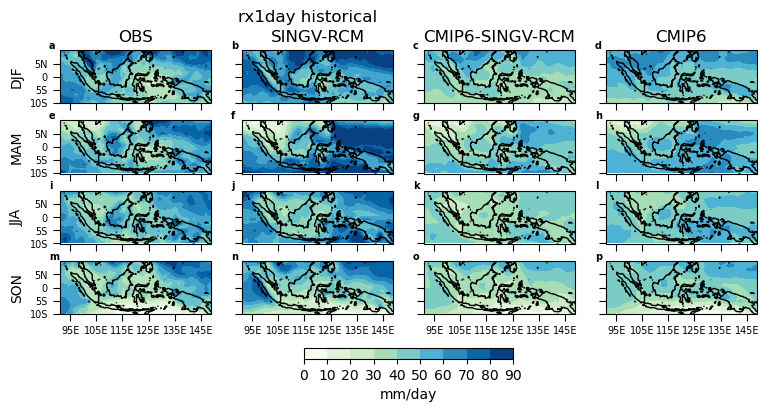

In [17]:
if varname_infile == 'RX5day' or varname_infile == 'RX1day' :
    vmin=0
    #vmax=240
    vmax=100
    incr=10
else :
    vmin=0
    vmax=10
    incr=1

nc=4
nl=4
xtit = ['OBS','SINGV-RCM','CMIP6-SINGV-RCM','CMIP6']
seastit = ['DJF','MAM','JJA','SON']
model = singv_hist.models.values
fig, ax = plt.subplots(4,4,figsize = (9,5), sharex =True, sharey =True,subplot_kw=dict(projection=ccrs.PlateCarree()))
ax=ax.flatten()

for itr, seas in enumerate(seastit) :

    PERSIANN_CCS_CDR_seas_mean.sel(season=seas,lat=slice(-10,10),lon=slice(90,150))[varname_infile].plot.contourf(ax=ax[0+itr*4],vmin=0,vmax=vmax, 
                            levels = np.arange(0,vmax,incr),cmap = 'GnBu', add_colorbar=False)#, cbar_kwargs = {'label':'Correlation','shrink':1,'pad':0.01})
    singv_hist.sel(season=seas,models=model,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile].plot.contourf( ax=ax[1+itr*4],vmin=0,vmax=vmax, 
                                levels = np.arange(0,vmax,incr),cmap = 'GnBu', add_colorbar=False)#, cbar_kwargs = {'label':'Correlation','shrink':1,'pad':0.01})
    rx1dayETCCDI_seas_mean.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile].plot.contourf( ax=ax[2+itr*4],vmin=0,vmax=vmax, 
                            levels = np.arange(0,vmax,incr),cmap = 'GnBu', add_colorbar=False)#, cbar_kwargs = {'label':'Correlation','shrink':1,'pad':0.01})
    mm = rx1dayETCCDI_seas_mean.sel(season=seas,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile].plot.contourf( ax=ax[3+itr*4],vmin=0,vmax=vmax, 
                            levels = np.arange(0,vmax,incr),cmap = 'GnBu', add_colorbar=False)#, cbar_kwargs = {'label':'Correlation','shrink':1,'pad':0.01})
    # rx1dayETCCDI_seas_mean_ssp126_late.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile].plot.contourf( ax=ax[1],vmin=0,vmax=vmax, 
    #                         levels = np.arange(0,vmax,incr),cmap = 'GnBu', add_colorbar=False)#, cbar_kwargs = {'label':'Correlation','shrink':1,'pad':0.01})
    # rx1dayETCCDI_seas_mean_ssp245_late.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile].plot.contourf( ax=ax[2],vmin=0,vmax=vmax, 
    #                         levels = np.arange(0,vmax,incr),cmap = 'GnBu', add_colorbar=False)#, cbar_kwargs = {'label':'Correlation','shrink':1,'pad':0.01})
    # rx1dayETCCDI_seas_mean_ssp585_late.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile].plot.contourf( ax=ax[3],vmin=0,vmax=vmax, 
    #                         levels = np.arange(0,vmax,incr),cmap = 'GnBu', add_colorbar=False)#, cbar_kwargs = {'label':'Correlation','shrink':1,'pad':0.01})



lab = ['a','b','c','d','e','f','g','h','i','j','k','l','m','n','o','p']
for itr,axi in enumerate(ax) :
    limits = (91,149,-9,9)
    xaxis_interval = 10
    yaxis_interval = 5
    axi.set_extent(limits)
    axi.set_xticks(np.arange(limits[0]+4,limits[1]+1,xaxis_interval), crs=ccrs.PlateCarree())
    axi.set_yticks(np.arange(limits[2]-1,limits[3]+1,yaxis_interval), crs=ccrs.PlateCarree())
    lon_formatter = LongitudeFormatter(zero_direction_label=True, degree_symbol='')
    lat_formatter = LatitudeFormatter(degree_symbol='')
    axi.xaxis.set_major_formatter(lon_formatter)
    axi.yaxis.set_major_formatter(lat_formatter)
    axi.tick_params(direction = 'out', length = 5,labelsize=7)
    axi.set_aspect('equal', 'box')
    axi.set_xlabel('')
    axi.set_ylabel('')
    axi.annotate(lab[itr],(-0.07,1.03),xycoords=axi.transAxes, fontsize=7, fontweight='bold')
    axi.coastlines()
    if np.mod(itr,nc) != 0 : axi.tick_params(labelleft=False)
    if itr < nc*nl-nc : axi.tick_params(labelbottom=False)
    
    if np.mod(itr,4) == 0  : axi.set_ylabel(seastit[int(itr/4)])
    axi.set_title('')
    if itr <= 3 : axi.set_title(xtit[itr])
    
if varname_infile == 'RX5day' or varname_infile == 'RX1day' :
    fig.colorbar(mm,ax=ax, shrink=0.3, label='mm/day',anchor=(0.5,1.5),location='bottom')
else :
    fig.colorbar(mm,ax=ax, shrink=0.3, label='Numbers',anchor=(0.5,1.5),location='bottom')
    
fig.suptitle(varname+' historical',y=0.95,x=0.4)
fig.savefig(path_out +'/'+ varname +'/evaluation/' + varname+'-evaluation_map_cmip6_icclim.jpg',dpi=400)

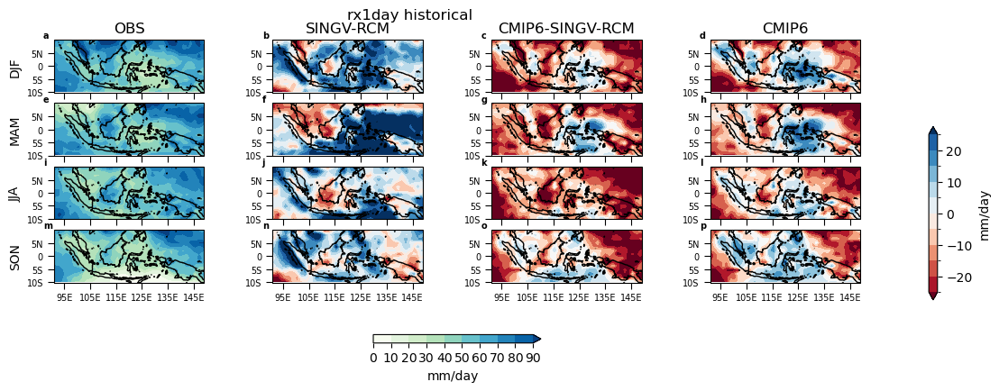

In [18]:
if varname_infile == 'RX5day' or varname_infile == 'RX1day' :
    vmin=0
    #vmax=240
    vmax=100
    incr=10
else :
    vmin=0
    vmax=10
    incr=1

xtit = ['OBS','SINGV-RCM','CMIP6-SINGV-RCM','CMIP6']
model = singv_hist.models.values
fig, ax = plt.subplots(4,4,figsize = (15,5), sharex =True, sharey =True,subplot_kw=dict(projection=ccrs.PlateCarree()))
ax=ax.flatten()

for itr, seas in enumerate(seastit) :

    nn = PERSIANN_CCS_CDR_seas_mean.sel(season=seas,lat=slice(-10,10),lon=slice(90,150))[varname_infile].plot.contourf(ax=ax[0+itr*4],vmin=0,vmax=vmax, 
                            levels = np.arange(0,vmax,incr),cmap = 'GnBu', add_colorbar=False)#, cbar_kwargs = {'label':'','shrink':0.5,'pad':0.1})
    mm = (singv_hist.sel(season=seas,models=model,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile]-PERSIANN_CCS_CDR_seas_mean.sel(season=seas,lat=slice(-10,10),lon=slice(90,150))[varname_infile]).plot.contourf( ax=ax[1+itr*4],vmin=0,vmax=vmax, 
                                levels = np.arange(-25,30,5),cmap = 'RdBu', add_colorbar=False)#, cbar_kwargs = {'label':'Correlation','shrink':1,'pad':0.01})
    (rx1dayETCCDI_seas_mean.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile]-PERSIANN_CCS_CDR_seas_mean.sel(season=seas,lat=slice(-10,10),lon=slice(90,150))[varname_infile]).plot.contourf( ax=ax[2+itr*4],vmin=0,vmax=vmax, 
                            levels = np.arange(-25,30,5),cmap = 'RdBu', add_colorbar=False)#, cbar_kwargs = {'label':'Correlation','shrink':1,'pad':0.01})
    (rx1dayETCCDI_seas_mean.sel(season=seas,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile]-PERSIANN_CCS_CDR_seas_mean.sel(season=seas,lat=slice(-10,10),lon=slice(90,150))[varname_infile]).plot.contourf( ax=ax[3+itr*4],vmin=0,vmax=vmax, 
                            levels = np.arange(-25,30,5),cmap = 'RdBu', add_colorbar=False)#, cbar_kwargs = {'label':'Correlation','shrink':1,'pad':0.01})
    # rx1dayETCCDI_seas_mean_ssp126_late.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile].plot.contourf( ax=ax[1],vmin=0,vmax=vmax, 
    #                         levels = np.arange(-25,25,5),cmap = 'GnBu', add_colorbar=False)#, cbar_kwargs = {'label':'Correlation','shrink':1,'pad':0.01})
    # rx1dayETCCDI_seas_mean_ssp245_late.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile].plot.contourf( ax=ax[2],vmin=0,vmax=vmax, 
    #                         levels = np.arange(-25,25,5),cmap = 'GnBu', add_colorbar=False)#, cbar_kwargs = {'label':'Correlation','shrink':1,'pad':0.01})
    # rx1dayETCCDI_seas_mean_ssp585_late.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile].plot.contourf( ax=ax[3],vmin=0,vmax=vmax, 
    #                         levels = np.arange(-25,25,5),cmap = 'GnBu', add_colorbar=False)#, cbar_kwargs = {'label':'Correlation','shrink':1,'pad':0.01})



lab = ['a','b','c','d','e','f','g','h','i','j','k','l','m','n','o','p']
for itr,axi in enumerate(ax) :
    limits = (91,149,-9,9)
    xaxis_interval = 10
    yaxis_interval = 5
    axi.set_extent(limits)
    axi.set_xticks(np.arange(limits[0]+4,limits[1]+1,xaxis_interval), crs=ccrs.PlateCarree())
    axi.set_yticks(np.arange(limits[2]-1,limits[3]+1,yaxis_interval), crs=ccrs.PlateCarree())
    lon_formatter = LongitudeFormatter(zero_direction_label=True, degree_symbol='')
    lat_formatter = LatitudeFormatter(degree_symbol='')
    axi.xaxis.set_major_formatter(lon_formatter)
    axi.yaxis.set_major_formatter(lat_formatter)
    axi.tick_params(direction = 'out', length = 5,labelsize=7)
    axi.set_aspect('equal', 'box')
    axi.set_xlabel('')
    axi.set_ylabel('')
    axi.annotate(lab[itr],(-0.07,1.03),xycoords=axi.transAxes, fontsize=7, fontweight='bold')
    axi.coastlines()
    
    if np.mod(itr,4) == 0  : axi.set_ylabel(seastit[int(itr/4)])
    axi.set_title('')
    if itr <= 3 : axi.set_title(xtit[itr])
    
if varname_infile == 'RX5day' or varname_infile == 'RX1day' :
    fig.colorbar(mm,ax=ax, shrink=0.5, label='mm/day')
    fig.colorbar(nn,ax=ax, shrink=0.2, label='mm/day',location='bottom')
else :
    fig.colorbar(mm,ax=ax, shrink=0.7, label='Numbers')
    
fig.suptitle(varname+' historical',y=0.95,x=0.4)
fig.savefig(path_out +'/'+ varname +'/evaluation/' + varname+'-evaluation_map_cmip6_icclim.jpg',dpi=400)

## Lan sea mask

88

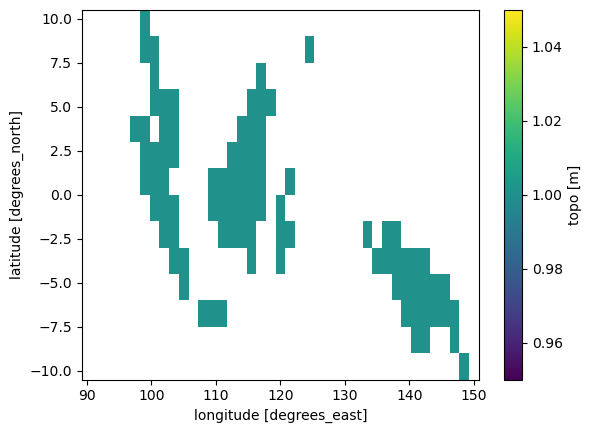

In [19]:
mask_land['topo'].sel(lat=slice(-10,10),lon=slice(90,150)).plot.pcolormesh()
#nlandpoints = mask_land['topo'].dropna(dim='lat').lon.size
nlandpoints = int(mask_land['topo'].sel(lat=slice(-10,10),lon=slice(90,150)).where(mask_land['topo']==1).sum())
int(nlandpoints)

#### 3.1.2 Added value <a class="anchor" id="sub_section_3_1_2"></a>
https://agupubs.onlinelibrary.wiley.com/doi/full/10.1029/2020GL089702#:~:text=Added%20value%20(AV)%20of%20downscaling,2017%3B%20Rummukainen%2C%202015).

DJF 70.0
MAM 66.0
JJA 73.0
SON 50.0


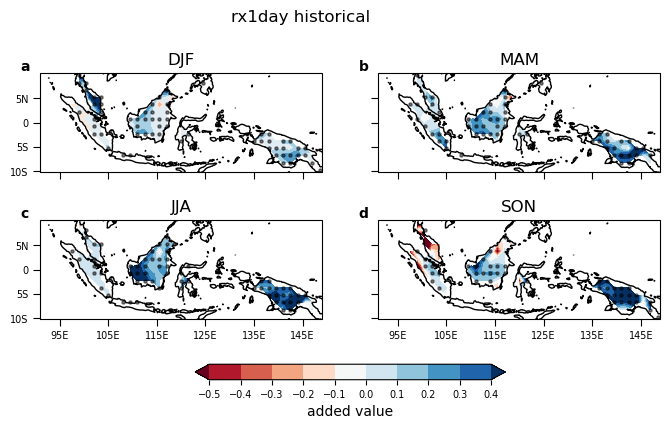

In [20]:

cmap = plt.get_cmap('RdBu')
if varname_infile == 'RX5day' or varname_infile == 'RX1day' :
    # vmin=-100
    # vmax=100
    vmin=-0.5
    vmax=0.5
    incr=0.1
else :
    vmin=-5
    vmax=5
    incr=0.5

nc=2
nl=2
    
fig, ax = plt.subplots(2,2,figsize = (8,5), sharex =True, sharey =True,subplot_kw=dict(projection=ccrs.PlateCarree()))
ax=ax.flatten()

for itr, seas in enumerate(seastit) :
    # a = (PERSIANN_CCS_CDR_seas_mean.sel(season=seas,lat=slice(-10,10),lon=slice(90,150))[varname_infile]*mask_land)['topo']
    # b = (singv_hist.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile]*mask_land)['topo']
    # c = (rx1dayETCCDI_seas_mean.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile]*mask_land)['topo']
    # c0 = (xs.rmse(a,b, dim=['lat','lon'],skipna=True)-xs.rmse(c,b, dim=['lat','lon'],skipna=True)).values
    # print(seas,' land only ',c0)
    
#     a = (PERSIANN_CCS_CDR_seas_mean.sel(season=seas,lat=slice(-10,10),lon=slice(90,150))[varname_infile]*mask_sea)['topo']
#     b = (singv_hist.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile]*mask_sea)['topo']
#     c = (rx1dayETCCDI_seas_mean.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile]*mask_sea)['topo']
#     c1 = (xs.rmse(a,b, dim=['lat','lon'],skipna=True)-xs.rmse(c,b, dim=['lat','lon'],skipna=True)).values
    
#     print(seas,' sea only',c1)
    
    # d = singv_hist.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile] - PERSIANN_CCS_CDR_seas_mean.sel(season=seas,lat=slice(-10,10),lon=slice(90,150))[varname_infile]
    # e = rx1dayETCCDI_seas_mean.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile] - PERSIANN_CCS_CDR_seas_mean.sel(season=seas,lat=slice(-10,10),lon=slice(90,150))[varname_infile]
    # f = np.sqrt(d*d)-np.sqrt(e*e)
    d = singv_hist.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))[varname_infile] - PERSIANN_CCS_CDR_seas_mean.sel(season=seas,lat=slice(-10,10),lon=slice(90,150))[varname_infile]*mask_land['topo']
    e = rx1dayETCCDI_seas_mean.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))[varname_infile] - PERSIANN_CCS_CDR_seas_mean.sel(season=seas,lat=slice(-10,10),lon=slice(90,150))[varname_infile]*mask_land['topo']
    f = (np.sqrt(d*d)-np.sqrt(e*e)).mean(dim='models')
    f_ratio = ((e*e-d*d)/(e*e-d*d).max(dim=(['lat','lon']))).mean(dim='models')
    mm= f_ratio.plot.contourf( ax=ax[itr],vmin=vmin,vmax=vmax, levels = np.arange(vmin,vmax,incr),cmap = cmap, add_colorbar=False)
    #ax[itr].set_title(seastit[itr]+'   land diff:'+str(np.round((f*mask_land)['topo'].mean(dim=['lon','lat']).values,decimals=2))+' land ratio:'+str(np.round((f_ratio*mask_land)['topo'].mean(dim=['lon','lat']).values,decimals=2)))    

    xPoints,yPoints = stipple_points2((e*e-d*d)/(e*e-d*d).max(dim=(['lat','lon'])),6)
    print(seas,str(np.round(100*len(xPoints.data)/nlandpoints)))
    if xPoints.shape[0] != 0 :
        ax[itr].scatter(xPoints,yPoints,s=20, c='k', edgecolors='k', marker='.', 
                   linewidths=1, alpha=0.5, transform=ccrs.PlateCarree()) 
                                     
lab = ['a','b','c','d','e','f','g','h','i','j','k','l','m','n','o','p']
for itr,axi in enumerate(ax) :
    limits = (91,149,-9,9)
    xaxis_interval = 10
    yaxis_interval = 5
    axi.set_extent(limits)
    axi.set_xticks(np.arange(limits[0]+4,limits[1]+1,xaxis_interval), crs=ccrs.PlateCarree())
    axi.set_yticks(np.arange(limits[2]-1,limits[3]+1,yaxis_interval), crs=ccrs.PlateCarree())
    lon_formatter = LongitudeFormatter(zero_direction_label=True, degree_symbol='')
    lat_formatter = LatitudeFormatter(degree_symbol='')
    axi.xaxis.set_major_formatter(lon_formatter)
    axi.yaxis.set_major_formatter(lat_formatter)
    axi.tick_params(direction = 'out', length = 5,labelsize=7)
    axi.set_aspect('equal', 'box')
    axi.set_xlabel('')
    axi.set_ylabel('')
    axi.annotate(lab[itr],(-0.07,1.03),xycoords=axi.transAxes, fontsize=10, fontweight='bold')
    axi.coastlines()
    axi.set_title(seastit[itr])
    if np.mod(itr,nc) != 0 : axi.tick_params(labelleft=False)
    if itr < nc*nl-nc : axi.tick_params(labelbottom=False)
    
cc = fig.colorbar(mm,ax=ax, shrink=0.5, label='added value',anchor=(0.5,1.3),location='bottom')
cc.ax.tick_params(labelsize=7)#cc.set_ticklabels(['-0.5','','-0.3','','-0.1','','0.1','','0.3',''])

fig.suptitle(varname+' historical',y=0.96,x=0.45)
fig.savefig(path_out +'/'+ varname +'/evaluation/'+ varname+'-addedvalue2.jpg',dpi=400)
    

DJF 77.0
MAM 69.0
JJA 73.0
SON 74.0


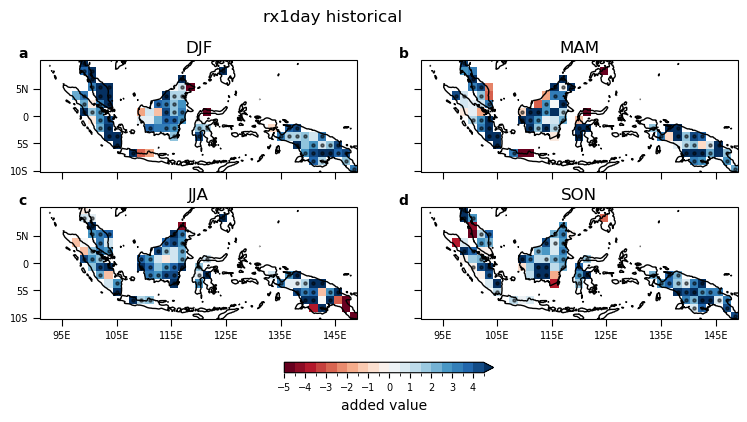

In [21]:

cmap = plt.get_cmap('RdBu')
if varname_infile == 'RX5day' or varname_infile == 'RX1day' :
    # vmin=-100
    # vmax=100
    vmin=-5
    vmax=5
    incr=0.5
else :
    vmin=-5
    vmax=5
    incr=0.5
    
fig, ax = plt.subplots(2,2,figsize = (9,5), sharex =True, sharey =True,subplot_kw=dict(projection=ccrs.PlateCarree()))
ax=ax.flatten()

for itr, seas in enumerate(seastit) :
    # a = (PERSIANN_CCS_CDR_seas_mean.sel(season=seas,lat=slice(-10,10),lon=slice(90,150))[varname_infile]*mask_land)['topo']
    # b = (singv_hist.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile]*mask_land)['topo']
    # c = (rx1dayETCCDI_seas_mean.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile]*mask_land)['topo']
    # c0 = (xs.rmse(a,b, dim=['lat','lon'],skipna=True)-xs.rmse(c,b, dim=['lat','lon'],skipna=True)).values
    # print(seas,' land only ',c0)
    
#     a = (PERSIANN_CCS_CDR_seas_mean.sel(season=seas,lat=slice(-10,10),lon=slice(90,150))[varname_infile]*mask_sea)['topo']
#     b = (singv_hist.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile]*mask_sea)['topo']
#     c = (rx1dayETCCDI_seas_mean.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile]*mask_sea)['topo']
#     c1 = (xs.rmse(a,b, dim=['lat','lon'],skipna=True)-xs.rmse(c,b, dim=['lat','lon'],skipna=True)).values
    
#     print(seas,' sea only',c1)
    
    # d = singv_hist.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile] - PERSIANN_CCS_CDR_seas_mean.sel(season=seas,lat=slice(-10,10),lon=slice(90,150))[varname_infile]
    # e = rx1dayETCCDI_seas_mean.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile] - PERSIANN_CCS_CDR_seas_mean.sel(season=seas,lat=slice(-10,10),lon=slice(90,150))[varname_infile]
    # f = np.sqrt(d*d)-np.sqrt(e*e)
    d = singv_hist_std.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))[varname_infile] - PERSIANN_CCS_CDR_seas_std.sel(season=seas,lat=slice(-10,10),lon=slice(90,150))[varname_infile]*mask_land['topo']
    e = rx1dayETCCDI_seas_std.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))[varname_infile] - PERSIANN_CCS_CDR_seas_std.sel(season=seas,lat=slice(-10,10),lon=slice(90,150))[varname_infile]*mask_land['topo']
    f = (np.sqrt(e*e)-np.sqrt(d*d)).mean(dim='models')
    f_ratio = ((e*e-d*d)/(e*e-d*d).max(dim=(['lat','lon']))).mean(dim='models')
    mm= f.plot.pcolormesh( ax=ax[itr],vmin=vmin,vmax=vmax, levels = np.arange(vmin,vmax,incr),cmap = cmap, add_colorbar=False)
    #ax[itr].set_title(seastit[itr]+'   land diff:'+str(np.round((f*mask_land)['topo'].mean(dim=['lon','lat']).values,decimals=2))+' land ratio:'+str(np.round((f_ratio*mask_land)['topo'].mean(dim=['lon','lat']).values,decimals=2)))    

    xPoints,yPoints = stipple_points2((np.sqrt(e*e)-np.sqrt(d*d)),6)
    print(seas,str(np.round(100*len(xPoints.data)/nlandpoints)))
    if xPoints.shape[0] != 0 :
        ax[itr].scatter(xPoints,yPoints,s=20, c='k', edgecolors='k', marker='.', 
                   linewidths=1, alpha=0.5, transform=ccrs.PlateCarree()) 
                                     
lab = ['a','b','c','d','e','f','g','h','i','j','k','l','m','n','o','p']
for itr,axi in enumerate(ax) :
    limits = (91,149,-9,9)
    xaxis_interval = 10
    yaxis_interval = 5
    axi.set_extent(limits)
    axi.set_xticks(np.arange(limits[0]+4,limits[1]+1,xaxis_interval), crs=ccrs.PlateCarree())
    axi.set_yticks(np.arange(limits[2]-1,limits[3]+1,yaxis_interval), crs=ccrs.PlateCarree())
    lon_formatter = LongitudeFormatter(zero_direction_label=True, degree_symbol='')
    lat_formatter = LatitudeFormatter(degree_symbol='')
    axi.xaxis.set_major_formatter(lon_formatter)
    axi.yaxis.set_major_formatter(lat_formatter)
    axi.tick_params(direction = 'out', length = 5,labelsize=7)
    axi.set_aspect('equal', 'box')
    axi.set_xlabel('')
    axi.set_ylabel('')
    axi.annotate(lab[itr],(-0.07,1.03),xycoords=axi.transAxes, fontsize=10, fontweight='bold')
    axi.coastlines()
    axi.set_title(seastit[itr])
    if np.mod(itr,nc) != 0 : axi.tick_params(labelleft=False)
    if itr < nc*nl-nc : axi.tick_params(labelbottom=False)
    
cc = fig.colorbar(mm,ax=ax, shrink=0.3, label='added value',anchor=(0.5,1.3),location='bottom')
cc.ax.tick_params(labelsize=7)
fig.suptitle(varname+' historical',y=0.96,x=0.45)
fig.savefig(path_out +'/'+ varname +'/evaluation/'+ varname+'-addedvalue2_std.jpg',dpi=400)
    

In [22]:
# fig, ax = plt.subplots(2,2,figsize = (10,5), sharex =True, sharey =True)
# ax=ax.flatten()
# a = (singv_hist[varname_infile]*mask_land).sel(models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))['topo']
# b = (rx1dayETCCDI_seas_mean_mean[varname_infile]*mask_land).sel(models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))['topo']
# c= (rx1dayETCCDI_seas_mean[varname_infile]*mask_land).sel(lat=slice(-10,10),lon=slice(90,150))['topo']
#sns.displot(ax=ax[0],data=pd.DataFrame([a.stack(z=a.dims),b.stack(z=b.dims),c.stack(z=c.dims)]))
#sns.displot(ax=ax[0],data=b.stack(z=b.dims))
#sns.displot(ax=ax[0],data=c.stack(z=c.dims))



## PDF
perkins skill score https://journals.ametsoc.org/view/journals/clim/20/17/jcli4253.1.xml

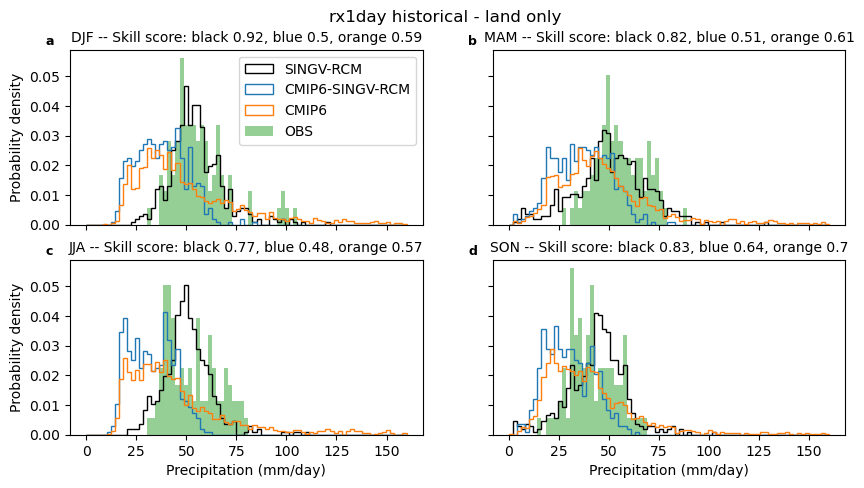

In [23]:
if varname_infile == 'RX5day' or varname_infile == 'RX1day' :
    binmax=160
    bins=80
else :
    binmax=50
    bins=50
    
fig, ax = plt.subplots(2,2,figsize = (10,5), sharex =True, sharey =True)
ax=ax.flatten()

for itr, seas in enumerate(seastit) :

    (singv_hist[varname_infile]*mask_land).sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))['topo'].plot.hist(ax=ax[itr], bins = np.linspace(0,binmax,bins),color='k',label='SINGV-RCM', density=True,fill=0,histtype='step')
    (rx1dayETCCDI_seas_mean[varname_infile]*mask_land).sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))['topo'].plot.hist(ax=ax[itr], bins = np.linspace(0,binmax,bins),label='CMIP6-SINGV-RCM', density=True,histtype='step')
    (rx1dayETCCDI_seas_mean[varname_infile]*mask_land).sel(season=seas,lat=slice(-10,10),lon=slice(90,150))['topo'].plot.hist(ax=ax[itr], bins = np.linspace(0,binmax,bins),label='CMIP6', density=True,histtype='step')
    (PERSIANN_CCS_CDR_seas_mean[varname_infile]*mask_land).sel(season=seas,lat=slice(-10,10),lon=slice(90,150))['topo'].plot.hist(ax=ax[itr], bins = np.linspace(0,binmax,bins),alpha=0.5,label='OBS', density=True)

    #-- Z skill score
    obs_m = (PERSIANN_CCS_CDR_seas_mean[varname_infile]*mask_land).sel(season=seas,lat=slice(-10,10),lon=slice(90,150))['topo'].mean()
    obs_std = (PERSIANN_CCS_CDR_seas_mean[varname_infile]*mask_land).sel(season=seas,lat=slice(-10,10),lon=slice(90,150))['topo'].std()
    #--
    CMIP6_singv_m = (rx1dayETCCDI_seas_mean[varname_infile]*mask_land).sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))['topo'].mean()
    CMIP6_singv_std = (rx1dayETCCDI_seas_mean[varname_infile]*mask_land).sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))['topo'].std()
    #--
    CMIP6_m = (rx1dayETCCDI_seas_mean[varname_infile]*mask_land).sel(season=seas,lat=slice(-10,10),lon=slice(90,150))['topo'].mean()
    CMIP6_std = (rx1dayETCCDI_seas_mean[varname_infile]*mask_land).sel(season=seas,lat=slice(-10,10),lon=slice(90,150))['topo'].std()
    #--
    singv_m = (singv_hist[varname_infile]*mask_land).sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))['topo'].mean()
    singv_std = (singv_hist[varname_infile]*mask_land).sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))['topo'].std()
    #-- 
    z_singv = (singv_m - obs_m) / np.sqrt(singv_std*singv_std+obs_std*obs_std)
    z_CMIP6_singv = (CMIP6_singv_m - obs_m) / np.sqrt(CMIP6_singv_std*CMIP6_singv_std+obs_std*obs_std)
    z_CMIP6 = (CMIP6_m - obs_m) / np.sqrt(CMIP6_std*CMIP6_std+obs_std*obs_std)
    #-- Perkins skill score
    singv = (singv_hist[varname_infile]*mask_land).sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))['topo']
    CMIP6_singv = (rx1dayETCCDI_seas_mean[varname_infile]*mask_land).sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))['topo']
    CMIP6 = (rx1dayETCCDI_seas_mean[varname_infile]*mask_land).sel(season=seas,lat=slice(-10,10),lon=slice(90,150))['topo']
    obs = (PERSIANN_CCS_CDR_seas_mean[varname_infile]*mask_land).sel(season=seas,lat=slice(-10,10),lon=slice(90,150))['topo']
    #-- calculates the area overlap of the two pdfs of std
    kernel_obs = stats.gaussian_kde(obs.stack(z=['lat','lon']).dropna(dim='z').data)(np.linspace(0,binmax,bins))
    kernel_singv = stats.gaussian_kde(singv.stack(z=['lat','lon','models']).dropna(dim='z').data)(np.linspace(0,binmax,bins))
    kernel_CMIP6_singv = stats.gaussian_kde(CMIP6_singv.stack(z=['lat','lon','models']).dropna(dim='z').data)(np.linspace(0,binmax,bins))
    kernel_CMIP6 = stats.gaussian_kde(CMIP6.stack(z=['lat','lon','models']).dropna(dim='z').data)(np.linspace(0,binmax,bins))
    
    #-- Calculate the area of the overlap
    skill_singv = binmax/bins * np.minimum(kernel_obs, kernel_singv).sum()  
    skill_CMIP6_singv = binmax/bins * np.minimum(kernel_obs, kernel_CMIP6_singv).sum()  
    skill_CMIP6 = binmax/bins * np.minimum(kernel_obs, kernel_CMIP6).sum()  
    
    #ax[itr].xscale('log')
    if itr == 0 : ax[itr].legend()
    ax[itr].annotate(lab[itr],(-0.07,1.03),xycoords=ax[itr].transAxes, fontsize=9, fontweight='bold')
    ax[itr].set_xlabel('')
    if itr > 1 : ax[itr].set_xlabel('Precipitation (mm/day)')
    ax[itr].set_ylabel('')
    if np.mod(itr,2) == 0  : ax[itr].set_ylabel('Probability density')
    ax[itr].set_title(seastit[itr]+' -- Skill score: black '+str(np.round(skill_singv,2))+', blue '+str(np.round(skill_CMIP6_singv,2))+', orange '+str(np.round(skill_CMIP6.data,2)),size=10)
    
fig.suptitle(varname+' historical - land only',y=0.96,x=0.5)
fig.savefig(path_out +'/'+ varname +'/evaluation/'+ varname+'-historical-hist-land.jpg',dpi=400)


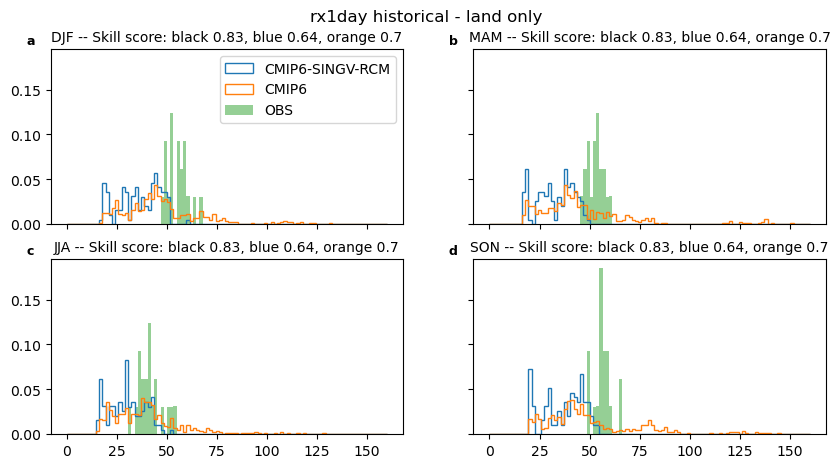

In [24]:
if varname_infile == 'RX5day' or varname_infile == 'RX1day' :
    binmax=160
    bins=100
else :
    binmax=50
    bins=50
    
fig, ax = plt.subplots(2,2,figsize = (10,5), sharex =True, sharey =True)
ax=ax.flatten()

for itr, seas in enumerate(seastit) :

    #(singv_hist.isel(time=np.arange(20)*4+itr).sel(models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))['topo'].plot.hist(ax=ax[itr], bins = np.linspace(0,binmax,bins),color='k',label='SINGV-RCM', density=True,fill=0,histtype='step')
    rx1dayETCCDI_seas.isel(time=np.arange(20)*4+itr).sel(models=singv_hist.models.values).plot.hist(ax=ax[itr], bins = np.linspace(0,binmax,bins),label='CMIP6-SINGV-RCM', density=True,histtype='step')
    rx1dayETCCDI_seas.isel(time=np.arange(20)*4+itr).plot.hist(ax=ax[itr], bins = np.linspace(0,binmax,bins),label='CMIP6', density=True,histtype='step')
    PERSIANN_CCS_CDR_seas.isel(time=np.arange(20)*4+itr).plot.hist(ax=ax[itr], bins = np.linspace(0,binmax,bins),alpha=0.5,label='OBS', density=True)

    # #-- Z skill score
    # obs_m = (PERSIANN_CCS_CDR_seas.isel(time=np.arange(20)*4+itr).mean()
    # obs_std = (PERSIANN_CCS_CDR_seas.isel(time=np.arange(20)*4+itr).std()
    # #--
    # CMIP6_singv_m = (rx1dayETCCDI_seas.isel(time=np.arange(20)*4+itr).sel(models=singv_hist.models.values).mean()
    # CMIP6_singv_std = (rx1dayETCCDI_seas.isel(time=np.arange(20)*4+itr).sel(models=singv_hist.models.values).std()
    # #--
    # CMIP6_m = (rx1dayETCCDI_seas.isel(time=np.arange(20)*4+itr)).mean()
    # CMIP6_std = (rx1dayETCCDI_seas.isel(time=np.arange(20)*4+itr)).std()
    #--
    # singv_m = (singv_hist.sel(models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))['topo'].mean()
    # singv_std = (singv_hist.sel(models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))['topo'].std()
    # #-- 
    # z_singv = (singv_m - obs_m) / np.sqrt(singv_std*singv_std+obs_std*obs_std)
    # z_CMIP6_singv = (CMIP6_singv_m - obs_m) / np.sqrt(CMIP6_singv_std*CMIP6_singv_std+obs_std*obs_std)
    # z_CMIP6 = (CMIP6_m - obs_m) / np.sqrt(CMIP6_std*CMIP6_std+obs_std*obs_std)
    # #-- Perkins skill score
    # singv = (singv_hist.sel(models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))['topo']
    # CMIP6_singv = (rx1dayETCCDI_seas.sel(models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))['topo']
    # CMIP6 = (rx1dayETCCDI_seas.sel(lat=slice(-10,10),lon=slice(90,150))['topo']
    # obs = (PERSIANN_CCS_CDR_seas.sel(lat=slice(-10,10),lon=slice(90,150))['topo']
    # #-- calculates the area overlap of the two pdfs of std
    # kernel_obs = stats.gaussian_kde(obs.stack(z=['lat','lon']).dropna(dim='z').data)(np.linspace(0,binmax,bins))
    # kernel_singv = stats.gaussian_kde(singv.stack(z=['lat','lon','models']).dropna(dim='z').data)(np.linspace(0,binmax,bins))
    # kernel_CMIP6_singv = stats.gaussian_kde(CMIP6_singv.stack(z=['lat','lon','models']).dropna(dim='z').data)(np.linspace(0,binmax,bins))
    # kernel_CMIP6 = stats.gaussian_kde(CMIP6.stack(z=['lat','lon','models']).dropna(dim='z').data)(np.linspace(0,binmax,bins))
    
    # #-- Calculate the area of the overlap
    # skill_singv = binmax/bins * np.minimum(kernel_obs, kernel_singv).sum()  
    # skill_CMIP6_singv = binmax/bins * np.minimum(kernel_obs, kernel_CMIP6_singv).sum()  
    # skill_CMIP6 = binmax/bins * np.minimum(kernel_obs, kernel_CMIP6).sum()  
    
    #ax[itr].xscale('log')
    if itr == 0 : ax[itr].legend()
    ax[itr].annotate(lab[itr],(-0.07,1.03),xycoords=ax[itr].transAxes, fontsize=9, fontweight='bold')
    ax[itr].set_xlabel('')
    ax[itr].set_title(seastit[itr]+' -- Skill score: black '+str(np.round(skill_singv,2))+', blue '+str(np.round(skill_CMIP6_singv,2))+', orange '+str(np.round(skill_CMIP6.data,2)),size=10)
    
fig.suptitle(varname+' historical - land only',y=0.96,x=0.5)
fig.savefig(path_out +'/'+ varname +'/evaluation/'+ varname+'-historical-hist-land-temp.jpg',dpi=400)


In [25]:
singv = (singv_hist[varname_infile]*mask_land).sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))['topo']
CMIP6_singv = (rx1dayETCCDI_seas_mean[varname_infile]*mask_land).sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))['topo']
CMIP6 = (rx1dayETCCDI_seas_mean[varname_infile]*mask_land).sel(season=seas,lat=slice(-10,10),lon=slice(90,150))['topo']
obs = (PERSIANN_CCS_CDR_seas_mean[varname_infile]*mask_land).sel(season=seas,lat=slice(-10,10),lon=slice(90,150))['topo']
# calculates the area overlap of the two pdfs of std
kernel_obs = stats.gaussian_kde(obs.stack(z=['lat','lon']).dropna(dim='z').data)(np.linspace(0,binmax,bins))
kernel_singv = stats.gaussian_kde(singv.stack(z=['lat','lon','models']).dropna(dim='z').data)(np.linspace(0,binmax,bins))
kernel_CMIP6_singv = stats.gaussian_kde(CMIP6_singv.stack(z=['lat','lon','models']).dropna(dim='z').data)(np.linspace(0,binmax,bins))
kernel_CMIP6 = stats.gaussian_kde(CMIP6.stack(z=['lat','lon','models']).dropna(dim='z').data)(np.linspace(0,binmax,bins))

# Calculate the area of the overlap
skill_singv = binmax/bins * np.minimum(kernel_obs, kernel_singv).sum()  
skill_CMIP6_singv = binmax/bins * np.minimum(kernel_obs, kernel_CMIP6_singv).sum()  
skill_CMIP6 = binmax/bins * np.minimum(kernel_obs, kernel_CMIP6).sum()  

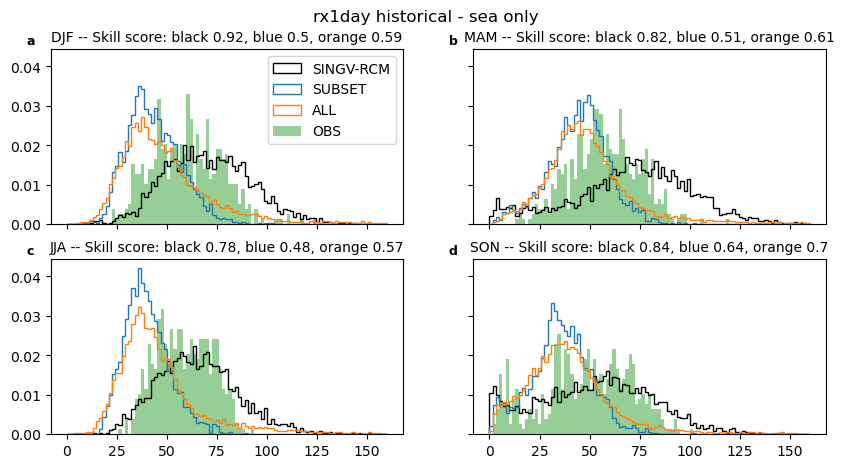

In [26]:
fig, ax = plt.subplots(2,2,figsize = (10,5), sharex =True, sharey =True)
ax=ax.flatten()

for itr, seas in enumerate(seastit) :

    (singv_hist[varname_infile]*mask_sea).sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))['topo'].plot.hist(ax=ax[itr], bins = np.linspace(0,binmax,bins),color='k',label='SINGV-RCM', density=True,fill=0,histtype='step')
    (rx1dayETCCDI_seas_mean[varname_infile]*mask_sea).sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))['topo'].plot.hist(ax=ax[itr], bins = np.linspace(0,binmax,bins),label='SUBSET', density=True,histtype='step')
    (rx1dayETCCDI_seas_mean[varname_infile]*mask_sea).sel(season=seas,lat=slice(-10,10),lon=slice(90,150))['topo'].plot.hist(ax=ax[itr], bins = np.linspace(0,binmax,bins),label='ALL', density=True,histtype='step')
    (PERSIANN_CCS_CDR_seas_mean[varname_infile]*mask_sea).sel(season=seas,lat=slice(-10,10),lon=slice(90,150))['topo'].plot.hist(ax=ax[itr],alpha=0.5, bins = np.linspace(0,binmax,bins),label='OBS', density=True)
    if itr == 0 : ax[itr].legend()

    #-- Perkins skill score
    singv = (singv_hist[varname_infile]*mask_land).sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))['topo']
    CMIP6_singv = (rx1dayETCCDI_seas_mean[varname_infile]*mask_land).sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))['topo']
    CMIP6 = (rx1dayETCCDI_seas_mean[varname_infile]*mask_land).sel(season=seas,lat=slice(-10,10),lon=slice(90,150))['topo']
    obs = (PERSIANN_CCS_CDR_seas_mean[varname_infile]*mask_land).sel(season=seas,lat=slice(-10,10),lon=slice(90,150))['topo']
    #-- calculates the area overlap of the two pdfs of std
    kernel_obs = stats.gaussian_kde(obs.stack(z=['lat','lon']).dropna(dim='z').data)(np.linspace(0,binmax,bins))
    kernel_singv = stats.gaussian_kde(singv.stack(z=['lat','lon','models']).dropna(dim='z').data)(np.linspace(0,binmax,bins))
    kernel_CMIP6_singv = stats.gaussian_kde(CMIP6_singv.stack(z=['lat','lon','models']).dropna(dim='z').data)(np.linspace(0,binmax,bins))
    kernel_CMIP6 = stats.gaussian_kde(CMIP6.stack(z=['lat','lon','models']).dropna(dim='z').data)(np.linspace(0,binmax,bins))
    
    #-- Calculate the area of the overlap
    skill_singv = binmax/bins * np.minimum(kernel_obs, kernel_singv).sum()  
    skill_CMIP6_singv = binmax/bins * np.minimum(kernel_obs, kernel_CMIP6_singv).sum()  
    skill_CMIP6 = binmax/bins * np.minimum(kernel_obs, kernel_CMIP6).sum()  

    ax[itr].set_xlabel('')
    ax[itr].annotate(lab[itr],(-0.07,1.03),xycoords=ax[itr].transAxes, fontsize=9, fontweight='bold')
    ax[itr].set_title(seastit[itr]+' -- Skill score: black '+str(np.round(skill_singv,2))+', blue '+str(np.round(skill_CMIP6_singv,2))+', orange '+str(np.round(skill_CMIP6.data,2)),size=10)


fig.suptitle(varname+' historical - sea only',y=0.96,x=0.5)
fig.savefig(path_out +'/'+ varname +'/evaluation/' + varname+'-historical-hist-sea.jpg',dpi=400)


#### 3.1.3 Singapore location <a class="anchor" id="sub_section_3_1_3"></a>

In [27]:
# fig, ax = plt.subplots(2,2,figsize = (10,10), sharex =True, sharey =True)
# ax=ax.flatten()

# for itr, seas in enumerate(seastit) :
#     df1 = pd.DataFrame(columns=['hist','ssp126','ssp245','ssp585'], index = singv_hist.models.values)
#     df1['hist'] = rx1dayETCCDI_seas_mean.sel(season=seas,models=singv_hist.models.values).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile]
#     df1['ssp126'] = rx1dayETCCDI_seas_mean_ssp126_late.sel(season=seas,models=singv_hist.models.values).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile] 
#     df1['ssp245'] = rx1dayETCCDI_seas_mean_ssp245_late.sel(season=seas,models=singv_hist.models.values).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile] 
#     df1['ssp585'] = rx1dayETCCDI_seas_mean_ssp585_late.sel(season=seas,models=singv_hist.models.values).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile] 
#     #--
#     df1_all = pd.DataFrame(columns=['hist','ssp126','ssp245','ssp585'], index = rx1dayETCCDI_seas_mean.models.values)
#     df1_all['hist'] = rx1dayETCCDI_seas_mean.sel(season=seas).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile]
#     df1_all['ssp126'] = rx1dayETCCDI_seas_mean_ssp126_late.sel(season=seas).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile] 
#     df1_all['ssp245'] = rx1dayETCCDI_seas_mean_ssp245_late.sel(season=seas).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile] 
#     df1_all['ssp585'] = rx1dayETCCDI_seas_mean_ssp585_late.sel(season=seas).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile] 
#     #--
#     df2 = pd.DataFrame(columns=['hist','ssp126','ssp245','ssp585'], index = singv_hist.models.values)
#     df2['hist'] = singv_hist.sel(season=seas).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile]
#     df2['ssp126'] = singv_late_ssp126.sel(season=seas).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile] 
#     df2['ssp245'] = singv_late_ssp245.sel(season=seas).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile] 
#     df2['ssp585'] = singv_late_ssp585.sel(season=seas).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile] 
#     #--
#     cdf = pd.concat([ df2.assign(Models='SINGV-RCM'),df1.assign(Models='CMIP6-SINGV'), df1_all.assign(Models='CMIP6')])    
#     mdf = pd.melt(cdf, id_vars=['Models'], var_name=['Scenarios'])
#     mdf = mdf.rename(columns={'value':varname})
#     mdf
#     sns.boxplot(ax=ax[itr],data=mdf,x='Scenarios',y=varname,hue='Models',linewidth = 0.5,fliersize = 1, width=0.4, boxprops=dict(alpha=.8))   
#     ax[itr].set_title(seas)
#     ax[itr].plot([-1,4], [PERSIANN_CCS_CDR_seas_mean.sel(season=seas).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile].values, PERSIANN_CCS_CDR_seas_mean.sel(season=seas).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile].values], 
#                  transform=ax[itr].transData,color='k',linestyle='--',linewidth=0.5)
#     if itr >= 1 : ax[itr].legend([],[],frameon=False)

# fig.suptitle('Singapore location - '+varname,y=0.95)
# fig.savefig(path_out + '/' + varname + '/evaluation/' + varname+'_boxplot_icclim.jpg',dpi=400)

#### 3.1.4 Taylor plots <a class="anchor" id="sub_section_3_1_4"></a>

In [60]:
a = (PERSIANN_CCS_CDR_seas_mean.sel(lat=slice(-10,10),lon=slice(90,150))[varname_infile])*mask_land['topo']
b = (singv_hist.sel(lat=slice(-10,10),lon=slice(90,150))[varname_infile])*mask_land['topo']
c = (rx1dayETCCDI_seas_mean.sel(lat=slice(-10,10),lon=slice(90,150))[varname_infile])*mask_land['topo']
#--
corr_SINGV = xr.corr(a,b,dim=['lon','lat'])
corr_CMIP6 = xr.corr(a,c,dim=['lon','lat'])
#--
std_SINGV = b.std(dim=['lon','lat'])/a.std(dim=['lon','lat'])
std_CMIP6 = c.std(dim=['lon','lat'])/a.std(dim=['lon','lat'])


# c0 = (xs.rmse(a,b, dim=['lat','lon'],skipna=True)-xs.rmse(c,b, dim=['lat','lon'],skipna=True)).values
# print(seas,' land only ',c0)

# a = (PERSIANN_CCS_CDR_seas_mean.sel(season=seas,lat=slice(-10,10),lon=slice(90,150))[varname_infile]*mask_sea)['topo']
# b = (singv_hist.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile]*mask_sea)['topo']
# c = (rx1dayETCCDI_seas_mean.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile]*mask_sea)['topo']
# c1 = (xs.rmse(a,b, dim=['lat','lon'],skipna=True)-xs.rmse(c,b, dim=['lat','lon'],skipna=True)).values

In [61]:
corr_CMIP6.round(2).transpose().sortby('models').to_pandas()
#corr_CMIP6.round(2).mean(dim='models').to_pandas()
corr_CMIP6.sel(models=corr_SINGV.models).round(2).mean(dim='models').to_pandas()

season
DJF    0.368333
JJA    0.476667
MAM    0.503333
SON    0.300000
dtype: float64

In [62]:
corr_SINGV.round(2).transpose().sortby('models').to_pandas()
corr_SINGV.round(2).mean(dim='models').to_pandas()

season
DJF    0.461667
JJA    0.410000
MAM    0.535000
SON    0.230000
dtype: float64

In [63]:
tab1 = pd.DataFrame((std_CMIP6.transpose().round(decimals=2)),columns=corr_CMIP6.season, index=corr_CMIP6.models)
tab1.loc['MEAN'] = tab1.mean().round(decimals=2)
tab1.loc['MEAND'] = tab1.loc[singv_hist.models.data].mean().round(decimals=2)
tab1

,DJF,JJA,MAM,SON
FGOALS-g3,1.83,1.99,2.48,2.01
ACCESS-CM2,0.74,0.63,0.91,0.94
CanESM5,1.31,1.70,1.97,1.47
CESM2-WACCM,0.78,1.00,0.98,1.11
NESM3,0.24,0.34,0.35,0.66
GFDL-ESM4,0.94,1.01,1.36,1.25
INM-CM5-0,1.58,1.37,1.14,1.71
TaiESM1,1.04,1.42,1.00,0.91
BCC-CSM2-MR,1.91,2.00,3.67,3.90
CMCC-ESM2,1.20,1.89,1.21,1.29


In [64]:
tab1 = pd.DataFrame((corr_CMIP6.transpose().round(decimals=2)),columns=corr_CMIP6.season, index=corr_CMIP6.models).sort_index()
tab1.loc['MEAN'] = tab1.mean().round(decimals=2)
tab1.loc['MEAND'] = tab1.loc[singv_hist.models.data].mean().round(decimals=2)
tab1

,DJF,JJA,MAM,SON
ACCESS-CM2,0.44,0.41,0.36,0.10
BCC-CSM2-MR,-0.07,0.37,0.57,0.03
CESM2-WACCM,0.37,0.57,0.64,0.52
CMCC-CM2-SR5,0.25,0.64,0.52,0.68
CMCC-ESM2,0.28,0.71,0.60,0.63
CNRM-CM6-1,0.34,0.33,0.29,0.10
CNRM-ESM2-1,0.36,0.33,0.34,0.17
CanESM5,0.02,0.33,0.40,0.13
EC-Earth3,0.55,0.67,0.53,0.54
FGOALS-g3,-0.04,0.10,0.15,-0.19


In [65]:
tab1 = pd.DataFrame((corr_SINGV.transpose().round(decimals=2)),columns=corr_CMIP6.season, index=corr_SINGV.models).sort_index()
tab1.loc['MEAN'] = tab1.mean().round(decimals=2)
tab1

,DJF,JJA,MAM,SON
ACCESS-CM2,0.64,0.42,0.57,0.08
EC-Earth3,0.45,0.42,0.55,0.39
MIROC6,0.49,0.29,0.44,0.06
MPI-ESM1-2-HR,0.15,0.49,0.46,0.26
NorESM2-MM,0.37,0.49,0.63,0.39
UKESM1-0-LL,0.67,0.35,0.56,0.20
MEAN,0.46,0.41,0.54,0.23


In [66]:
tab1 = pd.DataFrame((std_SINGV.transpose().round(decimals=2)),columns=std_CMIP6.season, index=std_SINGV.models).sort_index()
tab1.loc['MEAN'] = tab1.mean().round(decimals=2)
tab1

,DJF,JJA,MAM,SON
ACCESS-CM2,0.98,1.03,1.54,1.36
EC-Earth3,0.63,0.96,1.39,1.31
MIROC6,1.07,0.74,1.27,0.99
MPI-ESM1-2-HR,0.77,0.81,1.66,1.33
NorESM2-MM,0.77,0.88,1.29,0.89
UKESM1-0-LL,0.86,0.92,1.28,1.26
MEAN,0.85,0.89,1.40,1.19


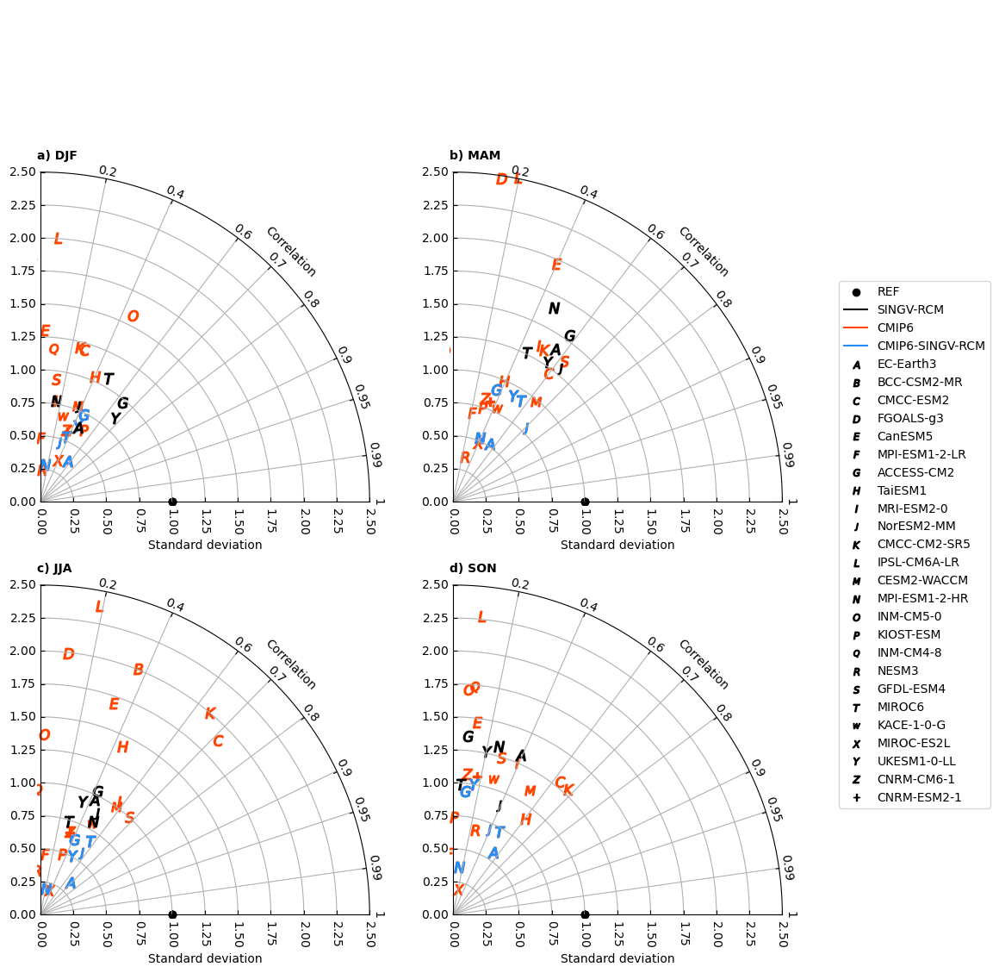

In [34]:
rm = 2.5
fig = plt.figure(figsize=(10,10))
fig.subplots_adjust(wspace=0.2, hspace=0.5, left=0.1, right=0.9, top =1.1, bottom=0.15)
221, 222, 223, 224
seas='DJF'
ax = setup_axes(fig, quadrants=1, rect=221, rmax=rm)
ax = pTaylor(std_CMIP6.sel(season=seas),corr_CMIP6.sel(season=seas),'CMIP6',ax,lab=False)
ax = pTaylor(std_CMIP6.sel(season=seas,models=singv_hist.models.values),corr_CMIP6.sel(season=seas,models=singv_hist.models.values),'CMIP6-SINGV-RCM',ax,lab=False)
ax = pTaylor(std_SINGV.sel(season=seas),corr_SINGV.sel(season=seas),'SINGV-RCM',ax,lab=False)
ax.annotate('a) '+seas,(0,1.03),xycoords=ax.transAxes, fontweight='bold')

seas='MAM'
ax = setup_axes(fig, quadrants=1, rect=222, rmax=rm)
ax = pTaylor(std_CMIP6.sel(season=seas),corr_CMIP6.sel(season=seas),'CMIP6',ax,lab=False)
ax = pTaylor(std_CMIP6.sel(season=seas,models=singv_hist.models.values),corr_CMIP6.sel(season=seas,models=singv_hist.models.values),'CMIP6-SINGV-RCM',ax,lab=False)
ax = pTaylor(std_SINGV.sel(season=seas),corr_SINGV.sel(season=seas),'SINGV-RCM',ax,lab=False)
ax.annotate('b) '+seas,(0,1.03),xycoords=ax.transAxes, fontweight='bold')

seas='JJA'
ax = setup_axes(fig, quadrants=1, rect=223, rmax=rm)
ax = pTaylor(std_CMIP6.sel(season=seas),corr_CMIP6.sel(season=seas),'CMIP6',ax,lab=False)
ax = pTaylor(std_CMIP6.sel(season=seas,models=singv_hist.models.values),corr_CMIP6.sel(season=seas,models=singv_hist.models.values),'CMIP6-SINGV-RCM',ax,lab=False)
ax = pTaylor(std_SINGV.sel(season=seas),corr_SINGV.sel(season=seas),'SINGV-RCM',ax,lab=False)
ax.annotate('c) '+seas,(0,1.03),xycoords=ax.transAxes, fontweight='bold')

seas='SON'
ax = setup_axes(fig, quadrants=1, rect=224, rmax=rm)
ax = pTaylor(std_CMIP6.sel(season=seas),corr_CMIP6.sel(season=seas),'CMIP6',ax,lab=True)
ax = pTaylor(std_CMIP6.sel(season=seas,models=singv_hist.models.values),corr_CMIP6.sel(season=seas,models=singv_hist.models.values),'CMIP6-SINGV-RCM',ax,lab=False)
ax = pTaylor(std_SINGV.sel(season=seas),corr_SINGV.sel(season=seas),'SINGV-RCM',ax,lab=False)
ax.annotate('d) '+seas,(0,1.03),xycoords=ax.transAxes, fontweight='bold')

# ax.annotate('a) DJF Climatology',(0,1.03),xycoords=ax.transAxes, fontweight='bold')
# ax = setup_axes(fig, quadrants=2, rect=322, rmax=rm)
# ax = pTaylor(my_hist_jja_std,my_hist_jja_corr,'My',ax,lab=False)
# ax = pTaylor(mx_hist_jja_std,mx_hist_jja_corr,'Mx',ax,lab=False)
# ax.annotate('b) JJA Climatology',(0,1.03),xycoords=ax.transAxes, fontweight='bold')
# # add a legend somewhere
# #plt.subplots_adjust(right=0.75)
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, bbox_to_anchor=[1, 0.5], loc='center left')
fig.tight_layout(pad=3.0)
plt.show()
fig.savefig(path_out + '/' + varname +'/evaluation/' + varname+'_land_historical_taylor.jpg',dpi=400)

In [35]:
a = (PERSIANN_CCS_CDR_seas_mean.sel(lat=slice(-10,10),lon=slice(90,150))[varname_infile])*mask_sea['topo']
b = (singv_hist.sel(lat=slice(-10,10),lon=slice(90,150))[varname_infile])*mask_sea['topo']
c = (rx1dayETCCDI_seas_mean.sel(lat=slice(-10,10),lon=slice(90,150))[varname_infile])*mask_sea['topo']
#--
corr_SINGV = xr.corr(a,b,dim=['lon','lat'])
corr_CMIP6 = xr.corr(a,c,dim=['lon','lat'])
#--
std_SINGV = b.std(dim=['lon','lat'])/a.std(dim=['lon','lat'])
std_CMIP6 = c.std(dim=['lon','lat'])/a.std(dim=['lon','lat'])

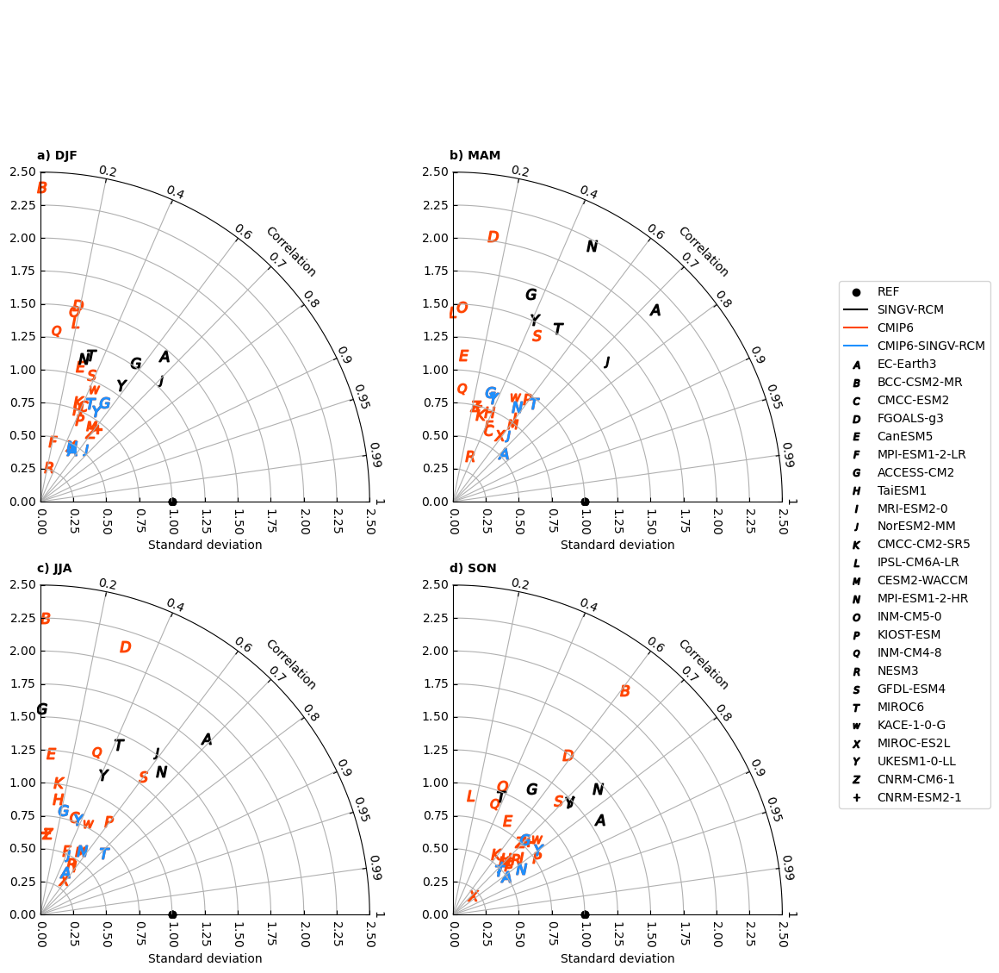

In [36]:
rm = 2.5
fig = plt.figure(figsize=(10,10))
fig.subplots_adjust(wspace=0.2, hspace=0.5, left=0.1, right=0.9, top =1.1, bottom=0.15)
221, 222, 223, 224
seas='DJF'
ax = setup_axes(fig, quadrants=1, rect=221, rmax=rm)
ax = pTaylor(std_CMIP6.sel(season=seas),corr_CMIP6.sel(season=seas),'CMIP6',ax,lab=False)
ax = pTaylor(std_CMIP6.sel(season=seas,models=singv_hist.models.values),corr_CMIP6.sel(season=seas,models=singv_hist.models.values),'CMIP6-SINGV-RCM',ax,lab=False)
ax = pTaylor(std_SINGV.sel(season=seas),corr_SINGV.sel(season=seas),'SINGV-RCM',ax,lab=False)
ax.annotate('a) '+seas,(0,1.03),xycoords=ax.transAxes, fontweight='bold')

seas='MAM'
ax = setup_axes(fig, quadrants=1, rect=222, rmax=rm)
ax = pTaylor(std_CMIP6.sel(season=seas),corr_CMIP6.sel(season=seas),'CMIP6',ax,lab=False)
ax = pTaylor(std_CMIP6.sel(season=seas,models=singv_hist.models.values),corr_CMIP6.sel(season=seas,models=singv_hist.models.values),'CMIP6-SINGV-RCM',ax,lab=False)
ax = pTaylor(std_SINGV.sel(season=seas),corr_SINGV.sel(season=seas),'SINGV-RCM',ax,lab=False)
ax.annotate('b) '+seas,(0,1.03),xycoords=ax.transAxes, fontweight='bold')

seas='JJA'
ax = setup_axes(fig, quadrants=1, rect=223, rmax=rm)
ax = pTaylor(std_CMIP6.sel(season=seas),corr_CMIP6.sel(season=seas),'CMIP6',ax,lab=False)
ax = pTaylor(std_CMIP6.sel(season=seas,models=singv_hist.models.values),corr_CMIP6.sel(season=seas,models=singv_hist.models.values),'CMIP6-SINGV-RCM',ax,lab=False)
ax = pTaylor(std_SINGV.sel(season=seas),corr_SINGV.sel(season=seas),'SINGV-RCM',ax,lab=False)
ax.annotate('c) '+seas,(0,1.03),xycoords=ax.transAxes, fontweight='bold')

seas='SON'
ax = setup_axes(fig, quadrants=1, rect=224, rmax=rm)
ax = pTaylor(std_CMIP6.sel(season=seas),corr_CMIP6.sel(season=seas),'CMIP6',ax,lab=True)
ax = pTaylor(std_CMIP6.sel(season=seas,models=singv_hist.models.values),corr_CMIP6.sel(season=seas,models=singv_hist.models.values),'CMIP6-SINGV-RCM',ax,lab=False)
ax = pTaylor(std_SINGV.sel(season=seas),corr_SINGV.sel(season=seas),'SINGV-RCM',ax,lab=False)
ax.annotate('d) '+seas,(0,1.03),xycoords=ax.transAxes, fontweight='bold')

# ax.annotate('a) DJF Climatology',(0,1.03),xycoords=ax.transAxes, fontweight='bold')
# ax = setup_axes(fig, quadrants=2, rect=322, rmax=rm)
# ax = pTaylor(my_hist_jja_std,my_hist_jja_corr,'My',ax,lab=False)
# ax = pTaylor(mx_hist_jja_std,mx_hist_jja_corr,'Mx',ax,lab=False)
# ax.annotate('b) JJA Climatology',(0,1.03),xycoords=ax.transAxes, fontweight='bold')
# # add a legend somewhere
# #plt.subplots_adjust(right=0.75)
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, bbox_to_anchor=[1, 0.5], loc='center left')
fig.tight_layout(pad=3.0)
plt.show()
fig.savefig(path_out + '/' + varname +'/evaluation/' + varname+'_sea_historical_taylor.jpg',dpi=400)

In [37]:
tab1 = pd.DataFrame(corr_CMIP6.transpose().round(decimals=2),columns=corr_CMIP6.season, index=corr_CMIP6.models)
tab1.loc['MEAN'] = tab1.mean().round(decimals=2)
tab1.loc['MEAND'] = tab1.loc[singv_hist.models.data].mean().round(decimals=2)
tab1

,DJF,JJA,MAM,SON
FGOALS-g3,0.19,0.30,0.15,0.58
ACCESS-CM2,0.54,0.21,0.32,0.69
CanESM5,0.28,0.07,0.07,0.50
CESM2-WACCM,0.56,0.53,0.61,0.69
NESM3,0.23,0.51,0.34,0.75
GFDL-ESM4,0.37,0.60,0.45,0.68
INM-CM5-0,0.18,-0.05,0.04,0.35
TaiESM1,0.37,0.15,0.38,0.68
BCC-CSM2-MR,0.00,0.02,0.12,0.61
CMCC-ESM2,0.41,0.33,0.44,0.73


In [38]:
tab1.loc[singv_hist.models.data]

,DJF,JJA,MAM,SON
ACCESS-CM2,0.54,0.21,0.32,0.69
EC-Earth3,0.52,0.50,0.71,0.81
MIROC6,0.46,0.72,0.64,0.72
MPI-ESM1-2-HR,0.49,0.55,0.56,0.83
NorESM2-MM,0.65,0.42,0.64,0.69
UKESM1-0-LL,0.53,0.37,0.37,0.80


### 3.2 Climate change <a class="anchor" id="section_3_2"></a>
#### 3.2.1 Scatter plots <a class="anchor" id="sub_section_3_2_1"></a>

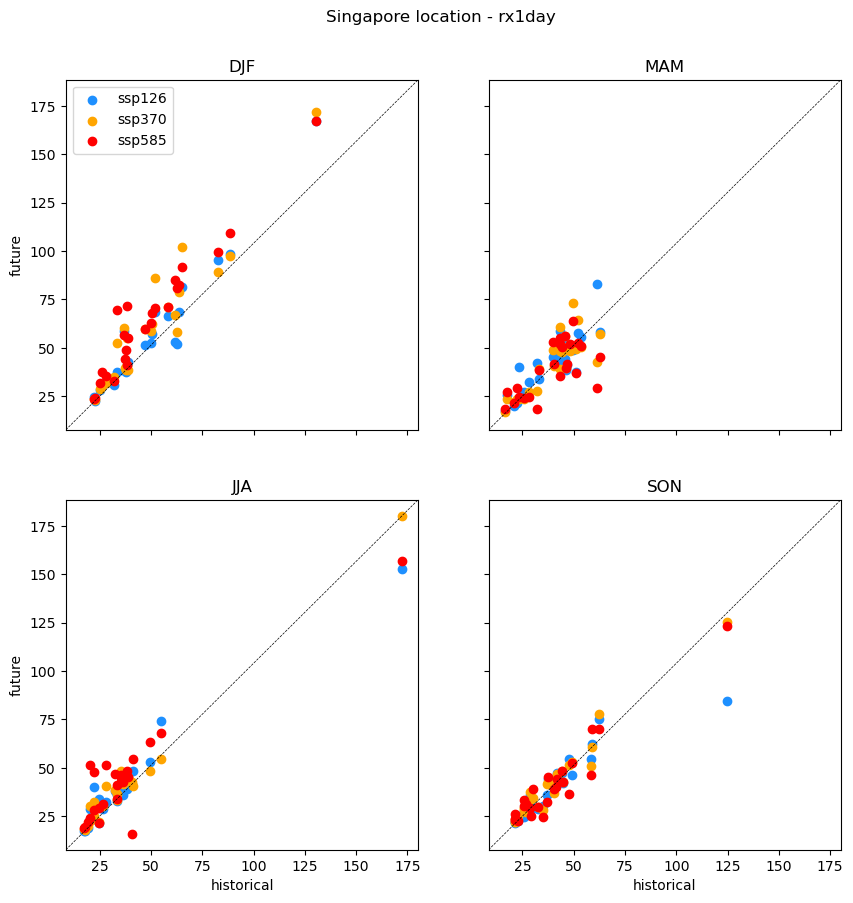

In [39]:
fig, ax = plt.subplots(2,2,figsize = (10,10), sharex =True, sharey =True)
ax=ax.flatten()

for itr, seas in enumerate(seastit) :
    
    ax[itr].scatter(rx1dayETCCDI_seas_mean.sel(season=seas).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile],
                  rx1dayETCCDI_seas_mean_ssp126_late.sel(season=seas).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile],color='dodgerblue',label='ssp126')
    ax[itr].scatter(rx1dayETCCDI_seas_mean.sel(season=seas).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile],
                  rx1dayETCCDI_seas_mean_ssp245_late.sel(season=seas).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile],color='orange',label='ssp370')
    ax[itr].scatter(rx1dayETCCDI_seas_mean.sel(season=seas).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile],
                  rx1dayETCCDI_seas_mean_ssp585_late.sel(season=seas).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile], color='red',label='ssp585')
    if itr > 1 : ax[itr].set_xlabel('historical')
    if np.mod(itr,2) == 0 : ax[itr].set_ylabel('future')
    ax[itr].plot([0, 1], [0, 1], transform=ax[itr].transAxes,color='k',linestyle='--',linewidth=0.5)

    ax[itr].set_title(seas)
ax[0].legend()
    
fig.suptitle('Singapore location - '+varname,y=0.95)
fig.savefig(path_out +'/'+ varname +'/change/' + varname+'_icclim.jpg',dpi=400)

#### 3.2.2 Regional maps <a class="anchor" id="sub_section_3_2_1"></a>

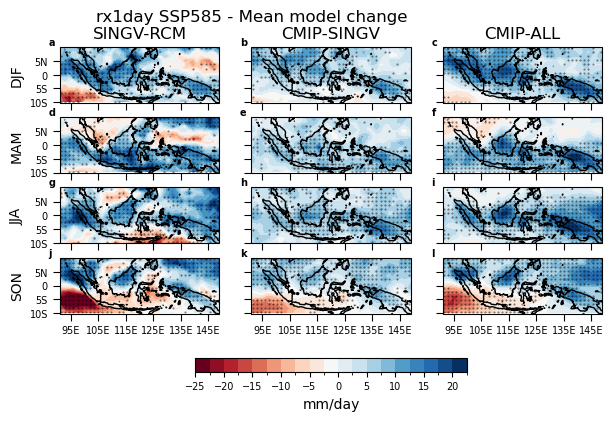

In [40]:
models=rx1dayETCCDI_seas_mean.models.values
if varname_infile == 'RX5day' or varname_infile == 'RX1day' :
    vmin=-25
    vmax=25
    incr=2.5
else :
    vmin=-2.
    vmax=2.
    incr=0.25
fig, ax = plt.subplots(4,3,figsize = (7,5), sharex =True, sharey =True,subplot_kw=dict(projection=ccrs.PlateCarree()))
ax=ax.flatten()
xtit = ['SINGV-RCM','CMIP-SINGV','CMIP-ALL']
cmap = plt.get_cmap('RdBu')
nc=3
nl=4

for itr, seas in enumerate(seastit) :

    # rx1dayETCCDI_seas_mean.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile].plot.contourf( ax=ax[0],vmin=0,vmax=vmax, 
    #                         levels = np.arange(0,vmax,10),cmap = 'GnBu', add_colorbar=False)#, cbar_kwargs = {'label':'Correlation','shrink':1,'pad':0.01})
    (singv_late_ssp585-singv_hist).sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile].plot.contourf( ax=ax[itr*3],vmin=vmin,vmax=vmax, 
                            levels = np.arange(vmin,vmax,incr),cmap = cmap, add_colorbar=False)#, cbar_kwargs = {'label':'Correlation','shrink':1,'pad':0.01})
    (rx1dayETCCDI_seas_mean_ssp585_late-rx1dayETCCDI_seas_mean).sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile].plot.contourf( ax=ax[itr*3+1],vmin=vmin,vmax=vmax, 
                            levels = np.arange(vmin,vmax,incr),cmap = cmap, add_colorbar=False)#, cbar_kwargs = {'label':'Correlation','shrink':1,'pad':0.01})
    mm=(rx1dayETCCDI_seas_mean_ssp585_late-rx1dayETCCDI_seas_mean).sel(season=seas,models=models,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile].plot.contourf( ax=ax[itr*3+2],vmin=vmin,vmax=vmax, 
                            levels = np.arange(vmin,vmax,incr),cmap = cmap, add_colorbar=False)#, cbar_kwargs = {'label':'Correlation','shrink':1,'pad':0.01})
    #--
    xPoints,yPoints = stipple_points(singv_hist.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))[varname_infile],
                                     singv_late_ssp585.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))[varname_infile],len(singv_hist.models.values))
    if xPoints.shape[0] != 0 :
        ax[itr*3].scatter(xPoints,yPoints,s=1, c='k', edgecolors=None, marker='.', 
                   linewidths=1, alpha=0.5, transform=ccrs.PlateCarree()) 


    xPoints,yPoints = stipple_points(rx1dayETCCDI_seas_mean.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))[varname_infile],
                                     rx1dayETCCDI_seas_mean_ssp585_late.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))[varname_infile],len(singv_hist.models.values))
    if xPoints.shape[0] != 0 :
        ax[itr*3+1].scatter(xPoints,yPoints,s=1, c='k', edgecolors=None, marker='.', 
                   linewidths=1, alpha=0.5, transform=ccrs.PlateCarree()) 

    xPoints,yPoints = stipple_points(rx1dayETCCDI_seas_mean.sel(season=seas,models=models,lat=slice(-10,10),lon=slice(90,150))[varname_infile],
                                     rx1dayETCCDI_seas_mean_ssp585_late.sel(season=seas,models=models,lat=slice(-10,10),lon=slice(90,150))[varname_infile],len(models))
    if xPoints.shape[0] != 0 :
        ax[itr*3+2].scatter(xPoints,yPoints,s=1, c='k', edgecolors=None, marker='.', 
                   linewidths=1, alpha=0.5, transform=ccrs.PlateCarree()) 

lab = ['a','b','c','d','e','f','g','h','i','j','k','l','m','n','o','p']
for itr,axi in enumerate(ax) :
    limits = (91,149,-9,9)
    xaxis_interval = 10
    yaxis_interval = 5
    axi.set_extent(limits)
    axi.set_xticks(np.arange(limits[0]+4,limits[1]+1,xaxis_interval), crs=ccrs.PlateCarree())
    axi.set_yticks(np.arange(limits[2]-1,limits[3]+1,yaxis_interval), crs=ccrs.PlateCarree())
    lon_formatter = LongitudeFormatter(zero_direction_label=True, degree_symbol='')
    lat_formatter = LatitudeFormatter(degree_symbol='')
    axi.xaxis.set_major_formatter(lon_formatter)
    axi.yaxis.set_major_formatter(lat_formatter)
    axi.tick_params(direction = 'out', length = 5,labelsize=7)
    axi.set_aspect('equal', 'box')
    axi.set_xlabel('')
    axi.set_ylabel('')
    axi.annotate(lab[itr],(-0.07,1.03),xycoords=axi.transAxes, fontsize=7, fontweight='bold')
    axi.coastlines()

    if np.mod(itr,3) == 0  : axi.set_ylabel(seastit[int(itr/3)])
    axi.set_title('')
    if itr <= 2 : axi.set_title(xtit[itr])
    if np.mod(itr,nc) != 0 : axi.tick_params(labelleft=False)
    if itr < nc*nl-nc : axi.tick_params(labelbottom=False)
    
    


fig.suptitle(varname+' SSP585 - Mean model change',y=0.95,x=0.4)
if varname_infile == 'RX5day' or varname_infile == 'RX1day' :
    cc = fig.colorbar(mm,ax=ax, shrink=0.5, label='mm/day',location='bottom',anchor=(0.5,1.3))
else :
    cc = fig.colorbar(mm,ax=ax, shrink=0.5, label='Numbers',location='bottom',anchor=(0.5,1.3))
cc.ax.tick_params(labelsize=7)
fig.savefig(path_out + '/' + varname +'/change/' + varname+'meanmodel_map_CMIP6allset_icclim.jpg',dpi=400)

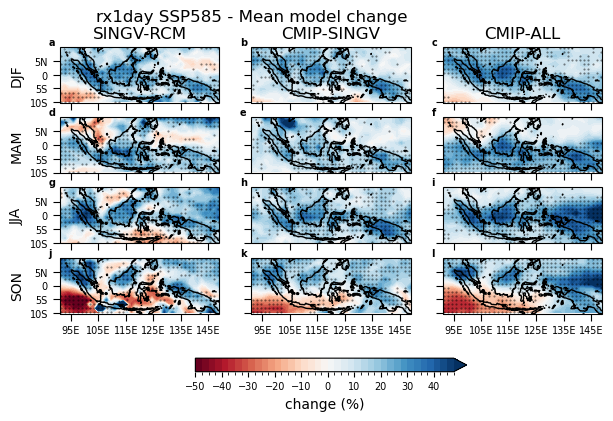

In [41]:
models=rx1dayETCCDI_seas_mean.models.values
if varname_infile == 'RX5day' or varname_infile == 'RX1day' :
    vmin=-50
    vmax=50
    incr=2.5
else :
    vmin=-2.
    vmax=2.
    incr=0.25
fig, ax = plt.subplots(4,3,figsize = (7,5), sharex =True, sharey =True,subplot_kw=dict(projection=ccrs.PlateCarree()))
ax=ax.flatten()
xtit = ['SINGV-RCM','CMIP-SINGV','CMIP-ALL']
cmap = plt.get_cmap('RdBu')
nc=3
nl=4

for itr, seas in enumerate(seastit) :

    # rx1dayETCCDI_seas_mean.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile].plot.contourf( ax=ax[0],vmin=0,vmax=vmax, 
    #                         levels = np.arange(0,vmax,10),cmap = 'GnBu', add_colorbar=False)#, cbar_kwargs = {'label':'Correlation','shrink':1,'pad':0.01})
    (100*(singv_late_ssp585-singv_hist)/singv_hist).sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile].plot.contourf( ax=ax[itr*3],vmin=vmin,vmax=vmax, 
                            levels = np.arange(vmin,vmax,incr),cmap = cmap, add_colorbar=False)#, cbar_kwargs = {'label':'Correlation','shrink':1,'pad':0.01})
    (100*(rx1dayETCCDI_seas_mean_ssp585_late-rx1dayETCCDI_seas_mean)/rx1dayETCCDI_seas_mean).sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile].plot.contourf( ax=ax[itr*3+1],vmin=vmin,vmax=vmax, 
                            levels = np.arange(vmin,vmax,incr),cmap = cmap, add_colorbar=False)#, cbar_kwargs = {'label':'Correlation','shrink':1,'pad':0.01})
    mm=(100*(rx1dayETCCDI_seas_mean_ssp585_late-rx1dayETCCDI_seas_mean)/rx1dayETCCDI_seas_mean).sel(season=seas,models=models,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile].plot.contourf( ax=ax[itr*3+2],vmin=vmin,vmax=vmax, 
                            levels = np.arange(vmin,vmax,incr),cmap = cmap, add_colorbar=False)#, cbar_kwargs = {'label':'Correlation','shrink':1,'pad':0.01})
    #--
    xPoints,yPoints = stipple_points(singv_hist.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))[varname_infile],
                                     singv_late_ssp585.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))[varname_infile],len(singv_hist.models.values))
    if xPoints.shape[0] != 0 :
        ax[itr*3].scatter(xPoints,yPoints,s=1, c='k', edgecolors=None, marker='.', 
                   linewidths=1, alpha=0.5, transform=ccrs.PlateCarree()) 


    xPoints,yPoints = stipple_points(rx1dayETCCDI_seas_mean.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))[varname_infile],
                                     rx1dayETCCDI_seas_mean_ssp585_late.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))[varname_infile],len(singv_hist.models.values))
    if xPoints.shape[0] != 0 :
        ax[itr*3+1].scatter(xPoints,yPoints,s=1, c='k', edgecolors=None, marker='.', 
                   linewidths=1, alpha=0.5, transform=ccrs.PlateCarree()) 

    xPoints,yPoints = stipple_points(rx1dayETCCDI_seas_mean.sel(season=seas,models=models,lat=slice(-10,10),lon=slice(90,150))[varname_infile],
                                     rx1dayETCCDI_seas_mean_ssp585_late.sel(season=seas,models=models,lat=slice(-10,10),lon=slice(90,150))[varname_infile],len(models))
    if xPoints.shape[0] != 0 :
        ax[itr*3+2].scatter(xPoints,yPoints,s=1, c='k', edgecolors=None, marker='.', 
                   linewidths=1, alpha=0.5, transform=ccrs.PlateCarree()) 

lab = ['a','b','c','d','e','f','g','h','i','j','k','l','m','n','o','p']
for itr,axi in enumerate(ax) :
    limits = (91,149,-9,9)
    xaxis_interval = 10
    yaxis_interval = 5
    axi.set_extent(limits)
    axi.set_xticks(np.arange(limits[0]+4,limits[1]+1,xaxis_interval), crs=ccrs.PlateCarree())
    axi.set_yticks(np.arange(limits[2]-1,limits[3]+1,yaxis_interval), crs=ccrs.PlateCarree())
    lon_formatter = LongitudeFormatter(zero_direction_label=True, degree_symbol='')
    lat_formatter = LatitudeFormatter(degree_symbol='')
    axi.xaxis.set_major_formatter(lon_formatter)
    axi.yaxis.set_major_formatter(lat_formatter)
    axi.tick_params(direction = 'out', length = 5,labelsize=7)
    axi.set_aspect('equal', 'box')
    axi.set_xlabel('')
    axi.set_ylabel('')
    axi.annotate(lab[itr],(-0.07,1.03),xycoords=axi.transAxes, fontsize=7, fontweight='bold')
    axi.coastlines()

    if np.mod(itr,3) == 0  : axi.set_ylabel(seastit[int(itr/3)])
    axi.set_title('')
    if itr <= 2 : axi.set_title(xtit[itr])
    if np.mod(itr,nc) != 0 : axi.tick_params(labelleft=False)
    if itr < nc*nl-nc : axi.tick_params(labelbottom=False)
    
    


fig.suptitle(varname+' SSP585 - Mean model change',y=0.95,x=0.4)
if varname_infile == 'RX5day' or varname_infile == 'RX1day' :
    cc = fig.colorbar(mm,ax=ax, shrink=0.5, label='change (%)',location='bottom',anchor=(0.5,1.3))
else :
    cc = fig.colorbar(mm,ax=ax, shrink=0.5, label='Numbers',location='bottom',anchor=(0.5,1.3))
cc.ax.tick_params(labelsize=7)
fig.savefig(path_out + '/' + varname +'/change/' + varname+'meanmodel_map_CMIP6allset_icclim_percent.jpg',dpi=400)

### Realised added value

DJF 70.0
MAM 66.0
JJA 73.0
SON 50.0


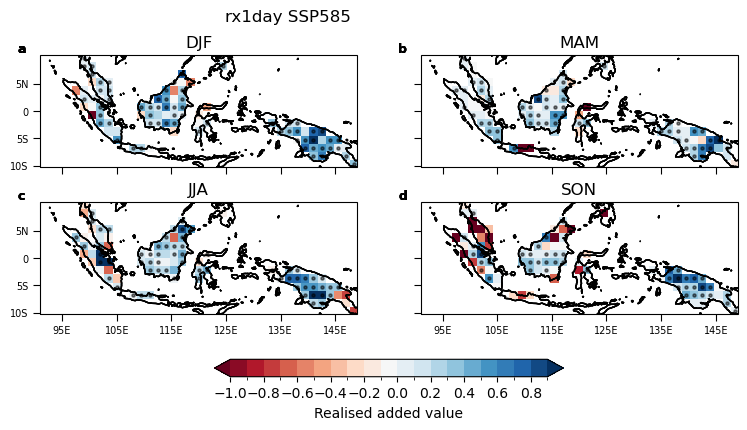

In [42]:
cmap = plt.get_cmap('RdBu')
if varname_infile == 'RX5day' or varname_infile == 'RX1day' :
    # vmin=-100
    # vmax=100
    vmin=-1
    vmax=1
    incr=0.1
else :
    vmin=-5
    vmax=5
    incr=0.5

nc=2
nl=2

    
fig, ax = plt.subplots(2,2,figsize = (9,5), sharex =True, sharey =True,subplot_kw=dict(projection=ccrs.PlateCarree()))
ax=ax.flatten()

for itr, seas in enumerate(seastit) :
    d = singv_hist.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))[varname_infile] - PERSIANN_CCS_CDR_seas_mean.sel(season=seas,lat=slice(-10,10),lon=slice(90,150))[varname_infile]*mask_land['topo']
    e = rx1dayETCCDI_seas_mean.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))[varname_infile] - PERSIANN_CCS_CDR_seas_mean.sel(season=seas,lat=slice(-10,10),lon=slice(90,150))[varname_infile]*mask_land['topo']
    ep1 = singv_late_ssp585.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))[varname_infile]-singv_hist.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))[varname_infile]
    ep2 = rx1dayETCCDI_seas_mean_ssp585_late.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))[varname_infile] - rx1dayETCCDI_seas_mean.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))[varname_infile]
    pav = ep1-ep2
    s2= PERSIANN_CCS_CDR_seas_std.sel(season=seas,lat=slice(-10,10),lon=slice(90,150))[varname_infile]*PERSIANN_CCS_CDR_seas_std.sel(season=seas,lat=slice(-10,10),lon=slice(90,150))[varname_infile]
    rav = (np.abs(pav)*(np.sqrt(e*e)-np.sqrt(d*d)))/s2
    f = (np.sqrt(d*d)-np.sqrt(e*e)).mean(dim='models')
    f_ratio = ((e*e-d*d)/(e*e-d*d).max(dim=(['lat','lon']))).mean(dim='models')

    mm = rav.mean(dim='models').plot.pcolormesh( ax=ax[itr],vmin=vmin,vmax=vmax, 
                            levels = np.arange(vmin,vmax,incr),cmap = cmap, add_colorbar=False)#, cbar_kwargs = {'label':'Correlation','shrink':1,'pad':0.01})


    xPoints,yPoints = stipple_points2(rav,6)
    print(seas,str(np.round(100*len(xPoints.data)/nlandpoints)))
    if xPoints.shape[0] != 0 :
        ax[itr].scatter(xPoints,yPoints,s=20, c='k', edgecolors='k', marker='.', 
                   linewidths=1, alpha=0.5, transform=ccrs.PlateCarree()) 

    
    lab = ['a','b','c','d','e','f','g','h','i','j','k','l','m','n','o','p']
    for itr,axi in enumerate(ax) :
        limits = (91,149,-9,9)
        xaxis_interval = 10
        yaxis_interval = 5
        axi.set_extent(limits)
        axi.set_xticks(np.arange(limits[0]+4,limits[1]+1,xaxis_interval), crs=ccrs.PlateCarree())
        axi.set_yticks(np.arange(limits[2]-1,limits[3]+1,yaxis_interval), crs=ccrs.PlateCarree())
        lon_formatter = LongitudeFormatter(zero_direction_label=True, degree_symbol='')
        lat_formatter = LatitudeFormatter(degree_symbol='')
        axi.xaxis.set_major_formatter(lon_formatter)
        axi.yaxis.set_major_formatter(lat_formatter)
        axi.tick_params(direction = 'out', length = 5,labelsize=7)
        axi.set_aspect('equal', 'box')
        axi.set_xlabel('')
        axi.set_ylabel('')
        axi.annotate(lab[itr],(-0.07,1.03),xycoords=axi.transAxes, fontsize=9, fontweight='bold')
        axi.coastlines()
    
        axi.set_title('')
        axi.set_title(seastit[itr])
        if np.mod(itr,nc) != 0 : axi.tick_params(labelleft=False)
        if itr < nc*nl-nc : axi.tick_params(labelbottom=False)
        
    
    
fig.suptitle(varname+' SSP585',y=0.95,x=0.4)
if varname_infile == 'RX5day' or varname_infile == 'RX1day' :
    fig.colorbar(mm,ax=ax, shrink=0.5, label='Realised added value',anchor=(0.5,1.3),location='bottom')
else :
    fig.colorbar(mm,ax=ax, shrink=0.5, label='Numbers',anchor=(0.5,1.3),location='bottom')

fig.savefig(path_out +'/'+ varname +'/change/'+ varname+'-realisedaddedvalue2_std.jpg',dpi=400)

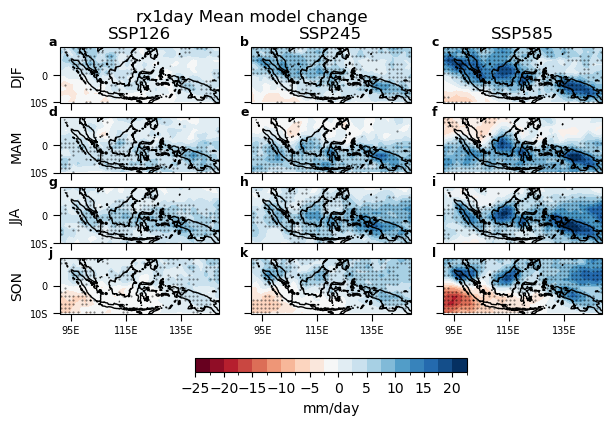

In [43]:
models=rx1dayETCCDI_seas_mean.models.values
if varname_infile == 'RX5day' or varname_infile == 'RX1day' :
    vmin=-25
    vmax=25
    incr=2.5
else :
    vmin=-2.
    vmax=2.
    incr=0.25
fig, ax = plt.subplots(4,3,figsize = (7,5), sharex =True, sharey =True,subplot_kw=dict(projection=ccrs.PlateCarree()))
ax=ax.flatten()
xtit = ['SSP126','SSP245','SSP585']
cmap = plt.get_cmap('RdBu')
nc=3
nl=4

for itr, seas in enumerate(seastit) :

    # rx1dayETCCDI_seas_mean.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile].plot.contourf( ax=ax[0],vmin=0,vmax=vmax, 
    #                         levels = np.arange(0,vmax,10),cmap = 'GnBu', add_colorbar=False)#, cbar_kwargs = {'label':'Correlation','shrink':1,'pad':0.01})
    (rx1dayETCCDI_seas_mean_ssp126_late-rx1dayETCCDI_seas_mean).sel(season=seas,models=models,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile].plot.contourf( ax=ax[itr*3],vmin=vmin,vmax=vmax, 
                            levels = np.arange(vmin,vmax,incr),cmap = cmap, add_colorbar=False)#, cbar_kwargs = {'label':'Correlation','shrink':1,'pad':0.01})
    (rx1dayETCCDI_seas_mean_ssp245_late-rx1dayETCCDI_seas_mean).sel(season=seas,models=models,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile].plot.contourf( ax=ax[itr*3+1],vmin=vmin,vmax=vmax, 
                            levels = np.arange(vmin,vmax,incr),cmap = cmap, add_colorbar=False)#, cbar_kwargs = {'label':'Correlation','shrink':1,'pad':0.01})
    mm=(rx1dayETCCDI_seas_mean_ssp585_late-rx1dayETCCDI_seas_mean).sel(season=seas,models=models,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile].plot.contourf( ax=ax[itr*3+2],vmin=vmin,vmax=vmax, 
                            levels = np.arange(vmin,vmax,incr),cmap = cmap, add_colorbar=False)#, cbar_kwargs = {'label':'Correlation','shrink':1,'pad':0.01})
    #--
    xPoints,yPoints = stipple_points(rx1dayETCCDI_seas_mean.sel(season=seas,models=models,lat=slice(-10,10),lon=slice(90,150))[varname_infile],
                                     rx1dayETCCDI_seas_mean_ssp126_late.sel(season=seas,models=models,lat=slice(-10,10),lon=slice(90,150))[varname_infile],len(models))
    if xPoints.shape[0] != 0 :
        ax[itr*3].scatter(xPoints,yPoints,s=1, c='k', edgecolors=None, marker='.', 
                   linewidths=1, alpha=0.5, transform=ccrs.PlateCarree()) 
    xPoints,yPoints = stipple_points(rx1dayETCCDI_seas_mean.sel(season=seas,models=models,lat=slice(-10,10),lon=slice(90,150))[varname_infile],
                                     rx1dayETCCDI_seas_mean_ssp245_late.sel(season=seas,models=models,lat=slice(-10,10),lon=slice(90,150))[varname_infile],len(models))
    if xPoints.shape[0] != 0 :
        ax[itr*3+1].scatter(xPoints,yPoints,s=1, c='k', edgecolors=None, marker='.', 
                   linewidths=1, alpha=0.5, transform=ccrs.PlateCarree()) 
    xPoints,yPoints = stipple_points(rx1dayETCCDI_seas_mean.sel(season=seas,models=models,lat=slice(-10,10),lon=slice(90,150))[varname_infile],
                                     rx1dayETCCDI_seas_mean_ssp585_late.sel(season=seas,models=models,lat=slice(-10,10),lon=slice(90,150))[varname_infile],len(models))
    if xPoints.shape[0] != 0 :
        ax[itr*3+2].scatter(xPoints,yPoints,s=1, c='k', edgecolors=None, marker='.', 
                   linewidths=1, alpha=0.5, transform=ccrs.PlateCarree()) 


lab = ['a','b','c','d','e','f','g','h','i','j','k','l','m','n','o','p']
for itr,axi in enumerate(ax) :
    limits = (91,149,-9,9)
    xaxis_interval = 20
    yaxis_interval = 10
    axi.set_extent(limits)
    axi.set_xticks(np.arange(limits[0]+4,limits[1]+1,xaxis_interval), crs=ccrs.PlateCarree())
    axi.set_yticks(np.arange(limits[2]-1,limits[3]+1,yaxis_interval), crs=ccrs.PlateCarree())
    lon_formatter = LongitudeFormatter(zero_direction_label=True, degree_symbol='')
    lat_formatter = LatitudeFormatter(degree_symbol='')
    axi.xaxis.set_major_formatter(lon_formatter)
    axi.yaxis.set_major_formatter(lat_formatter)
    axi.tick_params(direction = 'out', length = 5,labelsize=7)
    axi.set_aspect('equal', 'box')
    axi.set_xlabel('')
    axi.set_ylabel('')
    axi.annotate(lab[itr],(-0.07,1.03),xycoords=axi.transAxes, fontsize=9, fontweight='bold')
    axi.coastlines()
    if np.mod(itr,nc) != 0 : axi.tick_params(labelleft=False)
    if itr < nc*nl-nc : axi.tick_params(labelbottom=False)

    if np.mod(itr,3) == 0  : axi.set_ylabel(seastit[int(itr/3)])
    axi.set_title('')
    if itr <= 2 : axi.set_title(xtit[itr])
    


fig.suptitle(varname+' Mean model change',y=0.95,x=0.4)
if varname_infile == 'RX5day' or varname_infile == 'RX1day' :
    fig.colorbar(mm,ax=ax, shrink=0.5, label='mm/day',location='bottom',anchor=(0.5,1.3))
else :
    fig.colorbar(mm,ax=ax, shrink=0.5, label='Numbers',location='bottom',anchor=(0.5,1.3))
fig.savefig(path_out + '/' + varname +'/change/' + varname+'meanmodel_map_CMIP6all_icclim.jpg',dpi=400)

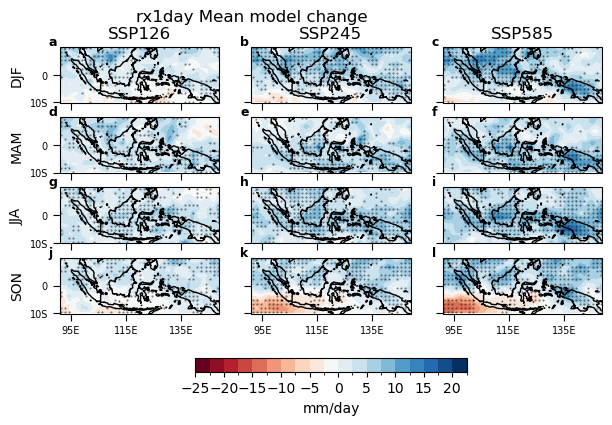

In [44]:
models=singv_hist.models.values
if varname_infile == 'RX5day' or varname_infile == 'RX1day' :
    vmin=-25
    vmax=25
    incr=2.5
else :
    vmin=-2.
    vmax=2.
    incr=0.25
fig, ax = plt.subplots(4,3,figsize = (7,5), sharex =True, sharey =True,subplot_kw=dict(projection=ccrs.PlateCarree()))
ax=ax.flatten()
xtit = ['SSP126','SSP245','SSP585']
cmap = plt.get_cmap('RdBu')


for itr, seas in enumerate(seastit) :

    # rx1dayETCCDI_seas_mean.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile].plot.contourf( ax=ax[0],vmin=0,vmax=vmax, 
    #                         levels = np.arange(0,vmax,10),cmap = 'GnBu', add_colorbar=False)#, cbar_kwargs = {'label':'Correlation','shrink':1,'pad':0.01})
    (rx1dayETCCDI_seas_mean_ssp126_late-rx1dayETCCDI_seas_mean).sel(season=seas,models=models,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile].plot.contourf( ax=ax[itr*3],vmin=vmin,vmax=vmax, 
                            levels = np.arange(vmin,vmax,incr),cmap = cmap, add_colorbar=False)#, cbar_kwargs = {'label':'Correlation','shrink':1,'pad':0.01})
    (rx1dayETCCDI_seas_mean_ssp245_late-rx1dayETCCDI_seas_mean).sel(season=seas,models=models,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile].plot.contourf( ax=ax[itr*3+1],vmin=vmin,vmax=vmax, 
                            levels = np.arange(vmin,vmax,incr),cmap = cmap, add_colorbar=False)#, cbar_kwargs = {'label':'Correlation','shrink':1,'pad':0.01})
    mm=(rx1dayETCCDI_seas_mean_ssp585_late-rx1dayETCCDI_seas_mean).sel(season=seas,models=models,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile].plot.contourf( ax=ax[itr*3+2],vmin=vmin,vmax=vmax, 
                            levels = np.arange(vmin,vmax,incr),cmap = cmap, add_colorbar=False)#, cbar_kwargs = {'label':'Correlation','shrink':1,'pad':0.01})
    #--
    xPoints,yPoints = stipple_points(rx1dayETCCDI_seas_mean.sel(season=seas,models=models,lat=slice(-10,10),lon=slice(90,150))[varname_infile],
                                     rx1dayETCCDI_seas_mean_ssp126_late.sel(season=seas,models=models,lat=slice(-10,10),lon=slice(90,150))[varname_infile],len(models))
    if xPoints.shape[0] != 0 :
        ax[itr*3].scatter(xPoints,yPoints,s=1, c='k', edgecolors=None, marker='.', 
                   linewidths=1, alpha=0.5, transform=ccrs.PlateCarree()) 
    xPoints,yPoints = stipple_points(rx1dayETCCDI_seas_mean.sel(season=seas,models=models,lat=slice(-10,10),lon=slice(90,150))[varname_infile],
                                     rx1dayETCCDI_seas_mean_ssp245_late.sel(season=seas,models=models,lat=slice(-10,10),lon=slice(90,150))[varname_infile],len(models))
    if xPoints.shape[0] != 0 :
        ax[itr*3+1].scatter(xPoints,yPoints,s=1, c='k', edgecolors=None, marker='.', 
                   linewidths=1, alpha=0.5, transform=ccrs.PlateCarree()) 
    xPoints,yPoints = stipple_points(rx1dayETCCDI_seas_mean.sel(season=seas,models=models,lat=slice(-10,10),lon=slice(90,150))[varname_infile],
                                     rx1dayETCCDI_seas_mean_ssp585_late.sel(season=seas,models=models,lat=slice(-10,10),lon=slice(90,150))[varname_infile],len(models))
    if xPoints.shape[0] != 0 :
        ax[itr*3+2].scatter(xPoints,yPoints,s=1, c='k', edgecolors=None, marker='.', 
                   linewidths=1, alpha=0.5, transform=ccrs.PlateCarree()) 


lab = ['a','b','c','d','e','f','g','h','i','j','k','l','m','n','o','p']
for itr,axi in enumerate(ax) :
    limits = (91,149,-9,9)
    xaxis_interval = 20
    yaxis_interval = 10
    axi.set_extent(limits)
    axi.set_xticks(np.arange(limits[0]+4,limits[1]+1,xaxis_interval), crs=ccrs.PlateCarree())
    axi.set_yticks(np.arange(limits[2]-1,limits[3]+1,yaxis_interval), crs=ccrs.PlateCarree())
    lon_formatter = LongitudeFormatter(zero_direction_label=True, degree_symbol='')
    lat_formatter = LatitudeFormatter(degree_symbol='')
    axi.xaxis.set_major_formatter(lon_formatter)
    axi.yaxis.set_major_formatter(lat_formatter)
    axi.tick_params(direction = 'out', length = 5,labelsize=7)
    axi.set_aspect('equal', 'box')
    axi.set_xlabel('')
    axi.set_ylabel('')
    axi.annotate(lab[itr],(-0.07,1.03),xycoords=axi.transAxes, fontsize=9, fontweight='bold')
    axi.coastlines()
    if np.mod(itr,nc) != 0 : axi.tick_params(labelleft=False)
    if itr < nc*nl-nc : axi.tick_params(labelbottom=False)

    if np.mod(itr,3) == 0  : axi.set_ylabel(seastit[int(itr/3)])
    axi.set_title('')
    if itr <= 2 : axi.set_title(xtit[itr])
    


fig.suptitle(varname+' Mean model change',y=0.95,x=0.4)
if varname_infile == 'RX5day' or varname_infile == 'RX1day' :
    fig.colorbar(mm,ax=ax, shrink=0.5, label='mm/day',location='bottom',anchor=(0.5,1.3))
else :
    fig.colorbar(mm,ax=ax, shrink=0.5, label='Numbers',location='bottom',anchor=(0.5,1.3))
fig.savefig(path_out + '/' + varname +'/change/' + varname+'meanmodel_map_CMIP6_SINGV_icclim.jpg',dpi=400)

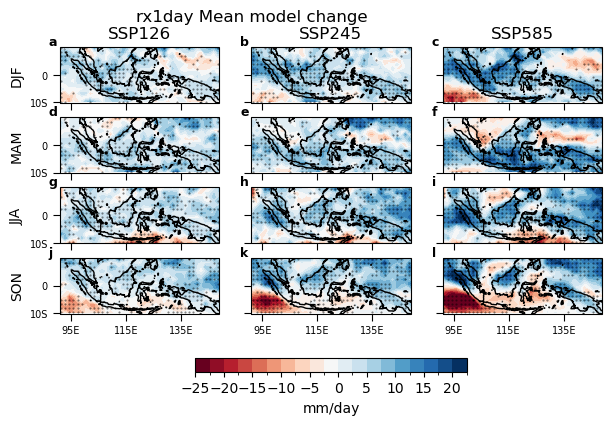

In [45]:
models=singv_hist.models.values

fig, ax = plt.subplots(4,3,figsize = (7,5), sharex =True, sharey =True,subplot_kw=dict(projection=ccrs.PlateCarree()))
ax=ax.flatten()

for itr, seas in enumerate(seastit) :

    # rx1dayETCCDI_seas_mean.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile].plot.contourf( ax=ax[0],vmin=0,vmax=vmax, 
    #                         levels = np.arange(0,vmax,10),cmap = 'GnBu', add_colorbar=False)#, cbar_kwargs = {'label':'Correlation','shrink':1,'pad':0.01})
    (singv_late_ssp126-singv_hist).sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile].plot.contourf( ax=ax[itr*3],vmin=vmin,vmax=vmax, 
                            levels = np.arange(vmin,vmax,incr),cmap = cmap, add_colorbar=False)#, cbar_kwargs = {'label':'Correlation','shrink':1,'pad':0.01})
    (singv_late_ssp245-singv_hist).sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile].plot.contourf( ax=ax[itr*3+1],vmin=vmin,vmax=vmax, 
                            levels = np.arange(vmin,vmax,incr),cmap = cmap, add_colorbar=False)#, cbar_kwargs = {'label':'Correlation','shrink':1,'pad':0.01})
    (singv_late_ssp585-singv_hist).sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile].plot.contourf( ax=ax[itr*3+2],vmin=vmin,vmax=vmax, 
                            levels = np.arange(vmin,vmax,incr),cmap = cmap, add_colorbar=False)#, cbar_kwargs = {'label':'Correlation','shrink':1,'pad':0.01})

    #--
    xPoints,yPoints = stipple_points(singv_hist.sel(season=seas,models=models,lat=slice(-10,10),lon=slice(90,150))[varname_infile],
                                     singv_late_ssp126.sel(season=seas,models=models,lat=slice(-10,10),lon=slice(90,150))[varname_infile],len(models))
    if xPoints.shape[0] != 0 :
        ax[itr*3].scatter(xPoints,yPoints,s=1, c='k', edgecolors=None, marker='.', 
                   linewidths=1, alpha=0.5, transform=ccrs.PlateCarree()) 
    xPoints,yPoints = stipple_points(singv_hist.sel(season=seas,models=models,lat=slice(-10,10),lon=slice(90,150))[varname_infile],
                                     singv_late_ssp245.sel(season=seas,models=models,lat=slice(-10,10),lon=slice(90,150))[varname_infile],len(models))
    if xPoints.shape[0] != 0 :
        ax[itr*3+1].scatter(xPoints,yPoints,s=1, c='k', edgecolors=None, marker='.', 
                   linewidths=1, alpha=0.5, transform=ccrs.PlateCarree()) 
    xPoints,yPoints = stipple_points(singv_hist.sel(season=seas,models=models,lat=slice(-10,10),lon=slice(90,150))[varname_infile],
                                     singv_late_ssp585.sel(season=seas,models=models,lat=slice(-10,10),lon=slice(90,150))[varname_infile],len(models))
    if xPoints.shape[0] != 0 :
        ax[itr*3+2].scatter(xPoints,yPoints,s=1, c='k', edgecolors=None, marker='.', 
                   linewidths=1, alpha=0.5, transform=ccrs.PlateCarree()) 

lab = ['a','b','c','d','e','f','g','h','i','j','k','l','m','n','o','p']
for itr,axi in enumerate(ax) :
    limits = (91,149,-9,9)
    xaxis_interval = 20
    yaxis_interval = 10
    axi.set_extent(limits)
    axi.set_xticks(np.arange(limits[0]+4,limits[1]+1,xaxis_interval), crs=ccrs.PlateCarree())
    axi.set_yticks(np.arange(limits[2]-1,limits[3]+1,yaxis_interval), crs=ccrs.PlateCarree())
    lon_formatter = LongitudeFormatter(zero_direction_label=True, degree_symbol='')
    lat_formatter = LatitudeFormatter(degree_symbol='')
    axi.xaxis.set_major_formatter(lon_formatter)
    axi.yaxis.set_major_formatter(lat_formatter)
    axi.tick_params(direction = 'out', length = 5,labelsize=7)
    axi.set_aspect('equal', 'box')
    axi.set_xlabel('')
    axi.set_ylabel('')
    axi.annotate(lab[itr],(-0.07,1.03),xycoords=axi.transAxes, fontsize=9, fontweight='bold')
    axi.coastlines()
    if np.mod(itr,nc) != 0 : axi.tick_params(labelleft=False)
    if itr < nc*nl-nc : axi.tick_params(labelbottom=False)

    if np.mod(itr,3) == 0  : axi.set_ylabel(seastit[int(itr/3)])
    axi.set_title('')
    if itr <= 2 : axi.set_title(xtit[itr])

fig.suptitle(varname+' Mean model change',y=0.95,x=0.4)
if varname_infile == 'RX5day' or varname_infile == 'RX1day' :
    fig.colorbar(mm,ax=ax, shrink=0.5, label='mm/day',location='bottom',anchor=(0.5,1.3))
else :
    fig.colorbar(mm,ax=ax, shrink=0.5, label='Numbers',location='bottom',anchor=(0.5,1.3))
fig.savefig(path_out +'/'+ varname + '/change/' + varname+'meanmodel_map_singv_icclim.jpg',dpi=400)

#### 3.2.3 Singapore location <a class="anchor" id="sub_section_3_2_3"></a>

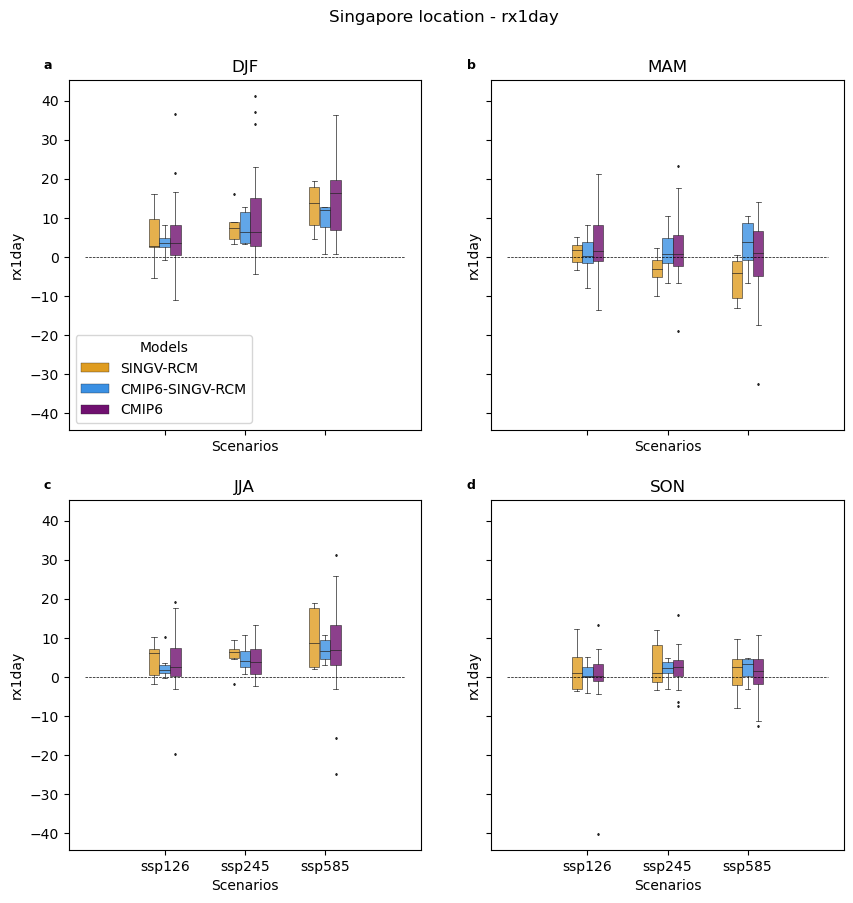

In [46]:
fig, ax = plt.subplots(2,2,figsize = (10,10), sharex =True, sharey =True)
ax=ax.flatten()
my_pal = {"SINGV-RCM": "orange", "CMIP6-SINGV-RCM":"dodgerblue","CMIP6":"purple"}


for itr, seas in enumerate(seastit) :
    df1 = pd.DataFrame(columns=['ssp126','ssp245','ssp585'], index = singv_hist.models.values)
    #df1['hist'] = rx1dayETCCDI_seas_mean.sel(season=seas,models=singv_hist.models.values).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile]
    df1['ssp126'] = rx1dayETCCDI_seas_mean_ssp126_late.sel(season=seas,models=singv_hist.models.values).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile] - rx1dayETCCDI_seas_mean.sel(season=seas,models=singv_hist.models.values).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile]
    df1['ssp245'] = rx1dayETCCDI_seas_mean_ssp245_late.sel(season=seas,models=singv_hist.models.values).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile] - rx1dayETCCDI_seas_mean.sel(season=seas,models=singv_hist.models.values).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile]
    df1['ssp585'] = rx1dayETCCDI_seas_mean_ssp585_late.sel(season=seas,models=singv_hist.models.values).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile] - rx1dayETCCDI_seas_mean.sel(season=seas,models=singv_hist.models.values).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile]
    #--
    df1_all = pd.DataFrame(columns=['ssp126','ssp245','ssp585'], index = rx1dayETCCDI_seas_mean.models.values)
    #df1_all['hist'] = rx1dayETCCDI_seas_mean.sel(season=seas).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile]
    df1_all['ssp126'] = rx1dayETCCDI_seas_mean_ssp126_late.sel(season=seas).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile] - rx1dayETCCDI_seas_mean.sel(season=seas).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile]
    df1_all['ssp245'] = rx1dayETCCDI_seas_mean_ssp245_late.sel(season=seas).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile] - rx1dayETCCDI_seas_mean.sel(season=seas).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile]
    df1_all['ssp585'] = rx1dayETCCDI_seas_mean_ssp585_late.sel(season=seas).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile] - rx1dayETCCDI_seas_mean.sel(season=seas).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile]
    #--
    df2 = pd.DataFrame(columns=['ssp126','ssp245','ssp585'], index = singv_hist.models.values)
    #df2['hist'] = singv_hist.sel(season=seas)[varname_infile]
    df2['ssp126'] = singv_late_ssp126.sel(season=seas).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile] - singv_hist.sel(season=seas).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile]
    df2['ssp245'] = singv_late_ssp245.sel(season=seas).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile] - singv_hist.sel(season=seas).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile]
    df2['ssp585'] = singv_late_ssp585.sel(season=seas).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile] - singv_hist.sel(season=seas).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile]
    #--
    cdf = pd.concat([ df2.assign(Models='SINGV-RCM'),df1.assign(Models='CMIP6-SINGV-RCM'), df1_all.assign(Models='CMIP6')])    
    mdf = pd.melt(cdf, id_vars=['Models'], var_name=['Scenarios'])
    mdf = mdf.rename(columns={'value':varname})
    mdf
    sns.boxplot(ax=ax[itr],data=mdf,x='Scenarios',y=varname,hue='Models',linewidth = 0.5,fliersize = 1, width=0.4, boxprops=dict(alpha=.8),palette=my_pal)   
    ax[itr].set_title(seas)
    ax[itr].plot([-1, 3], [0., 0.], transform=ax[itr].transData,color='k',linestyle='--',linewidth=0.5)
    if itr >= 1 : ax[itr].legend([],[],frameon=False)
    ax[itr].annotate(lab[itr],(-0.07,1.03),xycoords=ax[itr].transAxes, fontsize=9, fontweight='bold')


fig.suptitle('Singapore location - '+varname,y=0.95)
fig.savefig(path_out +'/'+ varname +'/change/' + varname+'_boxplot_change_icclim.jpg',dpi=400)
    

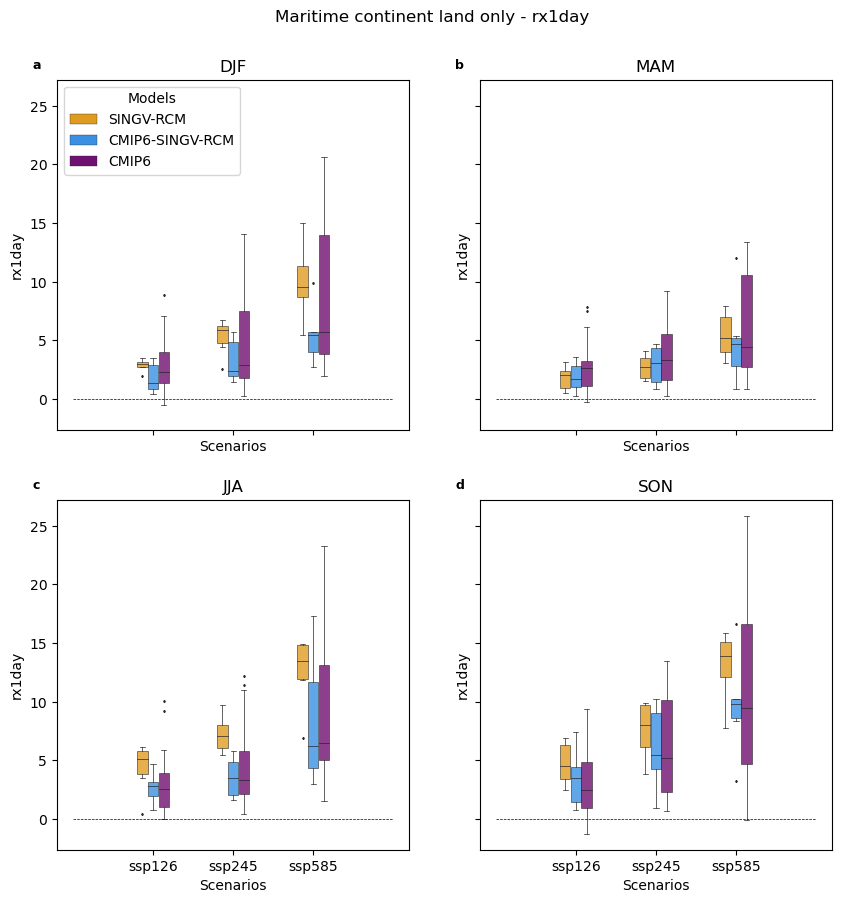

In [47]:
fig, ax = plt.subplots(2,2,figsize = (10,10), sharex =True, sharey =True)
ax=ax.flatten()
my_pal = {"SINGV-RCM": "orange", "CMIP6-SINGV-RCM":"dodgerblue","CMIP6":"purple"}


for itr, seas in enumerate(seastit) :
    df1 = pd.DataFrame(columns=['ssp126','ssp245','ssp585'], index = singv_hist.models.values)
    #df1['hist'] = rx1dayETCCDI_seas_mean.sel(season=seas,models=singv_hist.models.values).mean(dim=['lat','lon'])[varname_infile]
    df1['ssp126'] = (mask_land['topo']*rx1dayETCCDI_seas_mean_ssp126_late[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon']) - (mask_land['topo']*rx1dayETCCDI_seas_mean[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon'])
    df1['ssp245'] = (mask_land['topo']*rx1dayETCCDI_seas_mean_ssp245_late[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon']) - (mask_land['topo']*rx1dayETCCDI_seas_mean[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon'])
    df1['ssp585'] = (mask_land['topo']*rx1dayETCCDI_seas_mean_ssp585_late[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon']) - (mask_land['topo']*rx1dayETCCDI_seas_mean[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon'])
    #--
    df1_all = pd.DataFrame(columns=['ssp126','ssp245','ssp585'], index = rx1dayETCCDI_seas_mean.models.values)
    #df1_all['hist'] = rx1dayETCCDI_seas_mean.sel(season=seas).mean(dim=['lat','lon'])[varname_infile]
    df1_all['ssp126'] = (mask_land['topo']*rx1dayETCCDI_seas_mean_ssp126_late[varname_infile].sel(season=seas)).mean(dim=['lat','lon']) - (mask_land['topo']*rx1dayETCCDI_seas_mean[varname_infile].sel(season=seas)).mean(dim=['lat','lon'])
    df1_all['ssp245'] = (mask_land['topo']*rx1dayETCCDI_seas_mean_ssp245_late[varname_infile].sel(season=seas)).mean(dim=['lat','lon']) - (mask_land['topo']*rx1dayETCCDI_seas_mean[varname_infile].sel(season=seas)).mean(dim=['lat','lon'])
    df1_all['ssp585'] = (mask_land['topo']*rx1dayETCCDI_seas_mean_ssp585_late[varname_infile].sel(season=seas)).mean(dim=['lat','lon']) - (mask_land['topo']*rx1dayETCCDI_seas_mean[varname_infile].sel(season=seas)).mean(dim=['lat','lon'])
    #--
    df2 = pd.DataFrame(columns=['ssp126','ssp245','ssp585'], index = singv_hist.models.values)
    #df2['hist'] = singv_hist.sel(season=seas)[varname_infile]
    df2['ssp126'] = (mask_land['topo']*singv_late_ssp126[varname_infile].sel(season=seas)).mean(dim=['lat','lon']) - (mask_land['topo']*singv_hist[varname_infile].sel(season=seas)).mean(dim=['lat','lon'])
    df2['ssp245'] = (mask_land['topo']*singv_late_ssp245[varname_infile].sel(season=seas)).mean(dim=['lat','lon']) - (mask_land['topo']*singv_hist[varname_infile].sel(season=seas)).mean(dim=['lat','lon'])
    df2['ssp585'] = (mask_land['topo']*singv_late_ssp585[varname_infile].sel(season=seas)).mean(dim=['lat','lon']) - (mask_land['topo']*singv_hist[varname_infile].sel(season=seas)).mean(dim=['lat','lon'])
    #--
    cdf = pd.concat([ df2.assign(Models='SINGV-RCM'),df1.assign(Models='CMIP6-SINGV-RCM'), df1_all.assign(Models='CMIP6')])    
    mdf = pd.melt(cdf, id_vars=['Models'], var_name=['Scenarios'])
    mdf = mdf.rename(columns={'value':varname})
    mdf
    sns.boxplot(ax=ax[itr],data=mdf,x='Scenarios',y=varname,hue='Models',linewidth = 0.5,fliersize = 1, width=0.4, boxprops=dict(alpha=.8),palette=my_pal)   
    ax[itr].set_title(seas)
    ax[itr].plot([-1, 3], [0., 0.], transform=ax[itr].transData,color='k',linestyle='--',linewidth=0.5)
    if itr >= 1 : ax[itr].legend([],[],frameon=False)
    ax[itr].annotate(lab[itr],(-0.07,1.03),xycoords=ax[itr].transAxes, fontsize=9, fontweight='bold')


fig.suptitle('Maritime continent land only - '+varname,y=0.95)
fig.savefig(path_out + '/' + varname +'/change/' + varname+'_boxplot_change_icclim_land.jpg',dpi=400)
    

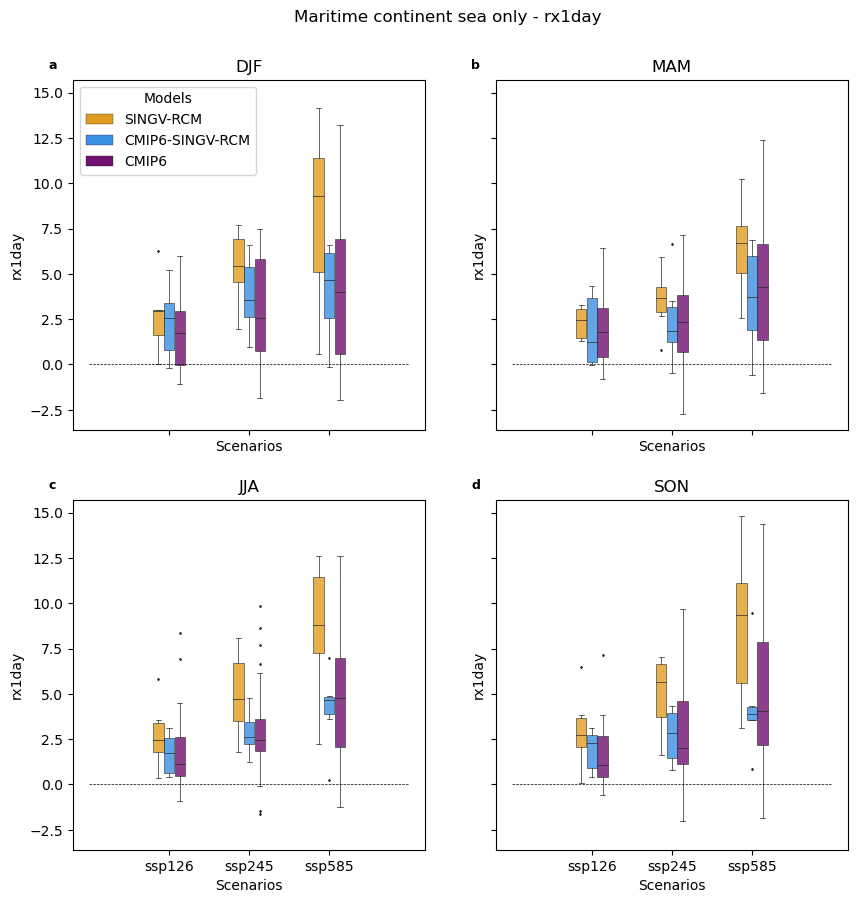

In [48]:
fig, ax = plt.subplots(2,2,figsize = (10,10), sharex =True, sharey =True)
ax=ax.flatten()
my_pal = {"SINGV-RCM": "orange", "CMIP6-SINGV-RCM":"dodgerblue","CMIP6":"purple"}


for itr, seas in enumerate(seastit) :
    df1 = pd.DataFrame(columns=['ssp126','ssp245','ssp585'], index = singv_hist.models.values)
    #df1['hist'] = rx1dayETCCDI_seas_mean.sel(season=seas,models=singv_hist.models.values).mean(dim=['lat','lon'])[varname_infile]
    df1['ssp126'] = (mask_sea['topo']*rx1dayETCCDI_seas_mean_ssp126_late[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon']) - (mask_sea['topo']*rx1dayETCCDI_seas_mean[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon'])
    df1['ssp245'] = (mask_sea['topo']*rx1dayETCCDI_seas_mean_ssp245_late[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon']) - (mask_sea['topo']*rx1dayETCCDI_seas_mean[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon'])
    df1['ssp585'] = (mask_sea['topo']*rx1dayETCCDI_seas_mean_ssp585_late[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon']) - (mask_sea['topo']*rx1dayETCCDI_seas_mean[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon'])
    #--
    df1_all = pd.DataFrame(columns=['ssp126','ssp245','ssp585'], index = rx1dayETCCDI_seas_mean.models.values)
    #df1_all['hist'] = rx1dayETCCDI_seas_mean.sel(season=seas).mean(dim=['lat','lon'])[varname_infile]
    df1_all['ssp126'] = (mask_sea['topo']*rx1dayETCCDI_seas_mean_ssp126_late[varname_infile].sel(season=seas)).mean(dim=['lat','lon']) - (mask_sea['topo']*rx1dayETCCDI_seas_mean[varname_infile].sel(season=seas)).mean(dim=['lat','lon'])
    df1_all['ssp245'] = (mask_sea['topo']*rx1dayETCCDI_seas_mean_ssp245_late[varname_infile].sel(season=seas)).mean(dim=['lat','lon']) - (mask_sea['topo']*rx1dayETCCDI_seas_mean[varname_infile].sel(season=seas)).mean(dim=['lat','lon'])
    df1_all['ssp585'] = (mask_sea['topo']*rx1dayETCCDI_seas_mean_ssp585_late[varname_infile].sel(season=seas)).mean(dim=['lat','lon']) - (mask_sea['topo']*rx1dayETCCDI_seas_mean[varname_infile].sel(season=seas)).mean(dim=['lat','lon'])
    #--
    df2 = pd.DataFrame(columns=['ssp126','ssp245','ssp585'], index = singv_hist.models.values)
    #df2['hist'] = singv_hist.sel(season=seas)[varname_infile]
    df2['ssp126'] = (mask_sea['topo']*singv_late_ssp126[varname_infile].sel(season=seas)).mean(dim=['lat','lon']) - (mask_sea['topo']*singv_hist[varname_infile].sel(season=seas)).mean(dim=['lat','lon'])
    df2['ssp245'] = (mask_sea['topo']*singv_late_ssp245[varname_infile].sel(season=seas)).mean(dim=['lat','lon']) - (mask_sea['topo']*singv_hist[varname_infile].sel(season=seas)).mean(dim=['lat','lon'])
    df2['ssp585'] = (mask_sea['topo']*singv_late_ssp585[varname_infile].sel(season=seas)).mean(dim=['lat','lon']) - (mask_sea['topo']*singv_hist[varname_infile].sel(season=seas)).mean(dim=['lat','lon'])
    #--
    cdf = pd.concat([ df2.assign(Models='SINGV-RCM'),df1.assign(Models='CMIP6-SINGV-RCM'), df1_all.assign(Models='CMIP6')])    
    mdf = pd.melt(cdf, id_vars=['Models'], var_name=['Scenarios'])
    mdf = mdf.rename(columns={'value':varname})
    mdf
    sns.boxplot(ax=ax[itr],data=mdf,x='Scenarios',y=varname,hue='Models',linewidth = 0.5,fliersize = 1, width=0.4, boxprops=dict(alpha=.8),palette=my_pal)   
    ax[itr].set_title(seas)
    ax[itr].plot([-1, 3], [0., 0.], transform=ax[itr].transData,color='k',linestyle='--',linewidth=0.5)
    if itr >= 1 : ax[itr].legend([],[],frameon=False)
    ax[itr].annotate(lab[itr],(-0.07,1.03),xycoords=ax[itr].transAxes, fontsize=9, fontweight='bold')


fig.suptitle('Maritime continent sea only - '+varname,y=0.95)
fig.savefig(path_out + '/' + varname +'/change/' + varname+'_boxplot_change_icclim_sea.jpg',dpi=400)
    

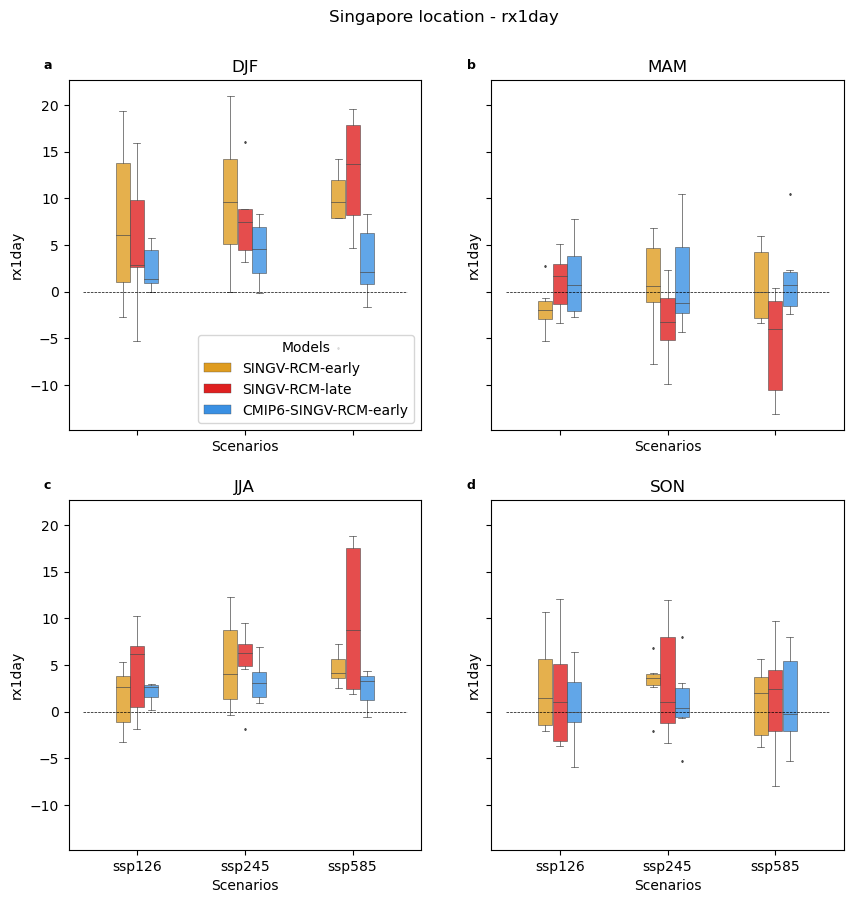

In [49]:
fig, ax = plt.subplots(2,2,figsize = (10,10), sharex =True, sharey =True)
ax=ax.flatten()
my_pal = {"SINGV-RCM-early": "orange", "SINGV-RCM-late": "red", "CMIP6-SINGV-RCM-early":"dodgerblue","CMIP6-SINGV-RCM-late":"purple"}

for itr, seas in enumerate(seastit) :
    df1 = pd.DataFrame(columns=['ssp126','ssp245','ssp585'], index = singv_hist.models.values)
    #df1['hist'] = rx1dayETCCDI_seas_mean.sel(season=seas,models=singv_hist.models.values).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile]
    df1['ssp126'] = rx1dayETCCDI_seas_mean_ssp126_early.sel(season=seas,models=singv_hist.models.values).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile] - rx1dayETCCDI_seas_mean.sel(season=seas,models=singv_hist.models.values).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile]
    df1['ssp245'] = rx1dayETCCDI_seas_mean_ssp245_early.sel(season=seas,models=singv_hist.models.values).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile] - rx1dayETCCDI_seas_mean.sel(season=seas,models=singv_hist.models.values).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile]
    df1['ssp585'] = rx1dayETCCDI_seas_mean_ssp585_early.sel(season=seas,models=singv_hist.models.values).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile] - rx1dayETCCDI_seas_mean.sel(season=seas,models=singv_hist.models.values).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile]
    #--
    df1_late = pd.DataFrame(columns=['ssp126','ssp245','ssp585'], index = singv_hist.models.values)
    #df1['hist'] = rx1dayETCCDI_seas_mean.sel(season=seas,models=singv_hist.models.values).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile]
    df1_late['ssp126'] = rx1dayETCCDI_seas_mean_ssp126_late.sel(season=seas,models=singv_hist.models.values).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile] - rx1dayETCCDI_seas_mean.sel(season=seas,models=singv_hist.models.values).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile]
    df1_late['ssp245'] = rx1dayETCCDI_seas_mean_ssp245_late.sel(season=seas,models=singv_hist.models.values).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile] - rx1dayETCCDI_seas_mean.sel(season=seas,models=singv_hist.models.values).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile]
    df1_late['ssp585'] = rx1dayETCCDI_seas_mean_ssp585_late.sel(season=seas,models=singv_hist.models.values).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile] - rx1dayETCCDI_seas_mean.sel(season=seas,models=singv_hist.models.values).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile]
    #--
    df2 = pd.DataFrame(columns=['ssp126','ssp245','ssp585'], index = singv_hist.models.values)
    #df2['hist'] = singv_hist.sel(season=seas)[varname_infile]
    df2['ssp126'] = singv_early_ssp126.sel(season=seas).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile] - singv_hist.sel(season=seas).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile]
    df2['ssp245'] = singv_early_ssp245.sel(season=seas).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile] - singv_hist.sel(season=seas).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile]
    df2['ssp585'] = singv_early_ssp585.sel(season=seas).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile] - singv_hist.sel(season=seas).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile]
    #--
    df2_late = pd.DataFrame(columns=['ssp126','ssp245','ssp585'], index = singv_hist.models.values)
    #df2['hist'] = singv_hist.sel(season=seas)[varname_infile]
    df2_late['ssp126'] = singv_late_ssp126.sel(season=seas).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile] - singv_hist.sel(season=seas).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile]
    df2_late['ssp245'] = singv_late_ssp245.sel(season=seas).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile] - singv_hist.sel(season=seas).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile]
    df2_late['ssp585'] = singv_late_ssp585.sel(season=seas).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile] - singv_hist.sel(season=seas).sel(lat=1.3,lon=103.8,method='nearest')[varname_infile]
    #--
    cdf = pd.concat([ df2.assign(Models='SINGV-RCM-early'),df2_late.assign(Models='SINGV-RCM-late'),df1.assign(Models='CMIP6-SINGV-RCM-early')])    
    #,df1_late.assign(Models='CMIP6-SINGV-late')
    mdf = pd.melt(cdf, id_vars=['Models'], var_name=['Scenarios'])
    mdf = mdf.rename(columns={'value':varname})
    mdf
    sns.boxplot(ax=ax[itr],data=mdf,x='Scenarios',y=varname,hue='Models',linewidth = 0.5,fliersize = 1, width=0.4, boxprops=dict(alpha=.8),palette=my_pal)   
    ax[itr].set_title(seas)
    ax[itr].plot([-0.5, 2.5], [0., 0.], transform=ax[itr].transData,color='k',linestyle='--',linewidth=0.5)
    if itr >= 1 : ax[itr].legend([],[],frameon=False)
    ax[itr].annotate(lab[itr],(-0.07,1.03),xycoords=ax[itr].transAxes, fontsize=9, fontweight='bold')



fig.suptitle('Singapore location - '+varname,y=0.95)
fig.savefig(path_out + '/' + varname + '/change/' + varname+'_boxplot_change_early_late_icclim.jpg',dpi=400)

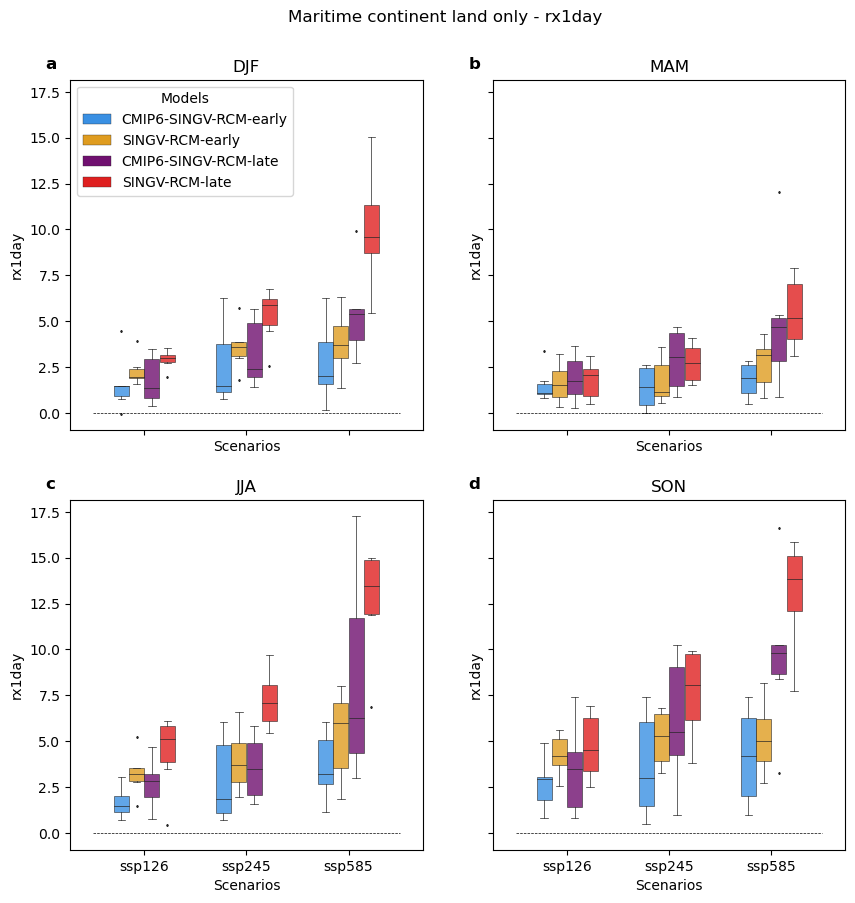

In [50]:
fig, ax = plt.subplots(2,2,figsize = (10,10), sharex =True, sharey =True)
ax=ax.flatten()
my_pal = {"SINGV-RCM-early": "orange", "SINGV-RCM-late": "red", "CMIP6-SINGV-RCM-early":"dodgerblue","CMIP6-SINGV-RCM-late":"purple"}

for itr, seas in enumerate(seastit) :
    df1 = pd.DataFrame(columns=['ssp126','ssp245','ssp585'], index = singv_hist.models.values)
    #df1['hist'] = rx1dayETCCDI_seas_mean.sel(season=seas,models=singv_hist.models.values).mean(dim=['lat','lon'])[varname_infile]
    df1['ssp126'] = (mask_land['topo']*rx1dayETCCDI_seas_mean_ssp126_early[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon']) - (mask_land['topo']*rx1dayETCCDI_seas_mean[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon'])
    df1['ssp245'] = (mask_land['topo']*rx1dayETCCDI_seas_mean_ssp245_early[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon']) - (mask_land['topo']*rx1dayETCCDI_seas_mean[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon'])
    df1['ssp585'] = (mask_land['topo']*rx1dayETCCDI_seas_mean_ssp585_early[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon']) - (mask_land['topo']*rx1dayETCCDI_seas_mean[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon'])
    #--
    df1_late = pd.DataFrame(columns=['ssp126','ssp245','ssp585'], index = singv_hist.models.values)
    #df1['hist'] = rx1dayETCCDI_seas_mean.sel(season=seas,models=singv_hist.models.values).mean(dim=['lat','lon'])[varname_infile]
    df1_late['ssp126'] = (mask_land['topo']*rx1dayETCCDI_seas_mean_ssp126_late[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon']) - (mask_land['topo']*rx1dayETCCDI_seas_mean[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon'])
    df1_late['ssp245'] = (mask_land['topo']*rx1dayETCCDI_seas_mean_ssp245_late[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon']) - (mask_land['topo']*rx1dayETCCDI_seas_mean[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon'])
    df1_late['ssp585'] = (mask_land['topo']*rx1dayETCCDI_seas_mean_ssp585_late[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon']) - (mask_land['topo']*rx1dayETCCDI_seas_mean[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon'])
    #--
    df2 = pd.DataFrame(columns=['ssp126','ssp245','ssp585'], index = singv_hist.models.values)
    #df2['hist'] = singv_hist.sel(season=seas)[varname_infile]
    df2['ssp126'] = (mask_land['topo']*singv_early_ssp126[varname_infile].sel(season=seas)).mean(dim=['lat','lon']) - (mask_land['topo']*singv_hist[varname_infile].sel(season=seas)).mean(dim=['lat','lon'])
    df2['ssp245'] = (mask_land['topo']*singv_early_ssp245[varname_infile].sel(season=seas)).mean(dim=['lat','lon']) - (mask_land['topo']*singv_hist[varname_infile].sel(season=seas)).mean(dim=['lat','lon'])
    df2['ssp585'] = (mask_land['topo']*singv_early_ssp585[varname_infile].sel(season=seas)).mean(dim=['lat','lon']) - (mask_land['topo']*singv_hist[varname_infile].sel(season=seas)).mean(dim=['lat','lon'])
    #--
    df2_late = pd.DataFrame(columns=['ssp126','ssp245','ssp585'], index = singv_hist.models.values)
    #df2['hist'] = singv_hist.sel(season=seas)[varname_infile]
    df2_late['ssp126'] = (mask_land['topo']*singv_late_ssp126[varname_infile].sel(season=seas)).mean(dim=['lat','lon']) - (mask_land['topo']*singv_hist[varname_infile].sel(season=seas)).mean(dim=['lat','lon'])
    df2_late['ssp245'] = (mask_land['topo']*singv_late_ssp245[varname_infile].sel(season=seas)).mean(dim=['lat','lon']) - (mask_land['topo']*singv_hist[varname_infile].sel(season=seas)).mean(dim=['lat','lon'])
    df2_late['ssp585'] = (mask_land['topo']*singv_late_ssp585[varname_infile].sel(season=seas)).mean(dim=['lat','lon']) - (mask_land['topo']*singv_hist[varname_infile].sel(season=seas)).mean(dim=['lat','lon'])
    #--
    cdf = pd.concat([ df1.assign(Models='CMIP6-SINGV-RCM-early'),df2.assign(Models='SINGV-RCM-early'),df1_late.assign(Models='CMIP6-SINGV-RCM-late'),df2_late.assign(Models='SINGV-RCM-late')])    
    mdf = pd.melt(cdf, id_vars=['Models'], var_name=['Scenarios'])
    mdf = mdf.rename(columns={'value':varname})
    mdf
    sns.boxplot(ax=ax[itr],data=mdf,x='Scenarios',y=varname,hue='Models',linewidth = 0.5,fliersize = 1, width=0.6, boxprops=dict(alpha=.8),palette=my_pal)   
    ax[itr].set_title(seas)
    ax[itr].plot([-0.5, 2.5], [0., 0.], transform=ax[itr].transData,color='k',linestyle='--',linewidth=0.5)
    if itr >= 1 : ax[itr].legend([],[],frameon=False)
    ax[itr].annotate(lab[itr],(-0.07,1.03),xycoords=ax[itr].transAxes, fontsize=12, fontweight='bold')



fig.suptitle('Maritime continent land only - '+varname,y=0.95)
fig.savefig(path_out + '/' + varname + '/change/' + varname+'_boxplot_change_early_late_icclim_land.jpg',dpi=400)

In [51]:
seas = 'MAM'
a = (mask_land['topo']*rx1dayETCCDI_seas_mean_ssp126_late[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon']) - (mask_land['topo']*rx1dayETCCDI_seas_mean[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon'])
b = (mask_land['topo']*rx1dayETCCDI_seas_mean_ssp245_late[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon']) - (mask_land['topo']*rx1dayETCCDI_seas_mean[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon'])
c = (mask_land['topo']*rx1dayETCCDI_seas_mean_ssp585_late[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon']) - (mask_land['topo']*rx1dayETCCDI_seas_mean[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon'])

In [52]:
singv_hist.models.values

array(['ACCESS-CM2', 'EC-Earth3', 'MIROC6', 'MPI-ESM1-2-HR', 'NorESM2-MM',
       'UKESM1-0-LL'], dtype=object)

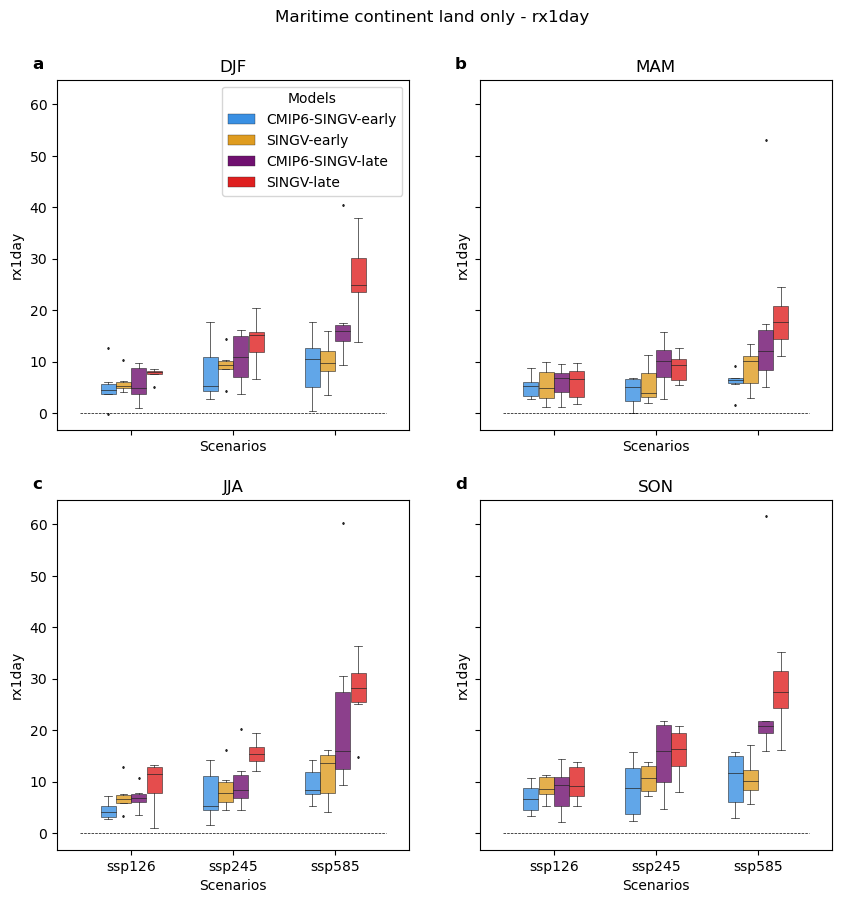

In [53]:
fig, ax = plt.subplots(2,2,figsize = (10,10), sharex =True, sharey =True)
ax=ax.flatten()
my_pal = {"SINGV-early": "orange", "SINGV-late": "red", "CMIP6-SINGV-early":"dodgerblue","CMIP6-SINGV-late":"purple"}

for itr, seas in enumerate(seastit) :
    df1 = pd.DataFrame(columns=['ssp126','ssp245','ssp585'], index = singv_hist.models.values)
    #df1['hist'] = rx1dayETCCDI_seas_mean.sel(season=seas,models=singv_hist.models.values).mean(dim=['lat','lon'])[varname_infile]
    df1['ssp126'] = 100 * ((mask_land['topo']*rx1dayETCCDI_seas_mean_ssp126_early[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon']) - (mask_land['topo']*rx1dayETCCDI_seas_mean[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon']))/(mask_land['topo']*rx1dayETCCDI_seas_mean[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon'])
    df1['ssp245'] = 100 * ((mask_land['topo']*rx1dayETCCDI_seas_mean_ssp245_early[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon']) - (mask_land['topo']*rx1dayETCCDI_seas_mean[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon']))/(mask_land['topo']*rx1dayETCCDI_seas_mean[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon'])
    df1['ssp585'] = 100 * ((mask_land['topo']*rx1dayETCCDI_seas_mean_ssp585_early[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon']) - (mask_land['topo']*rx1dayETCCDI_seas_mean[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon']))/(mask_land['topo']*rx1dayETCCDI_seas_mean[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon'])
    #--
    df1_late = pd.DataFrame(columns=['ssp126','ssp245','ssp585'], index = singv_hist.models.values)
    #df1['hist'] = rx1dayETCCDI_seas_mean.sel(season=seas,models=singv_hist.models.values).mean(dim=['lat','lon'])[varname_infile]
    df1_late['ssp126'] = 100 * ((mask_land['topo']*rx1dayETCCDI_seas_mean_ssp126_late[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon']) - (mask_land['topo']*rx1dayETCCDI_seas_mean[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon']))/(mask_land['topo']*rx1dayETCCDI_seas_mean[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon'])
    df1_late['ssp245'] = 100 * ((mask_land['topo']*rx1dayETCCDI_seas_mean_ssp245_late[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon']) - (mask_land['topo']*rx1dayETCCDI_seas_mean[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon']))/(mask_land['topo']*rx1dayETCCDI_seas_mean[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon'])
    df1_late['ssp585'] = 100 * ((mask_land['topo']*rx1dayETCCDI_seas_mean_ssp585_late[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon']) - (mask_land['topo']*rx1dayETCCDI_seas_mean[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon']))/(mask_land['topo']*rx1dayETCCDI_seas_mean[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon'])
    #--
    df2 = pd.DataFrame(columns=['ssp126','ssp245','ssp585'], index = singv_hist.models.values)
    #df2['hist'] = singv_hist.sel(season=seas)[varname_infile]
    df2['ssp126'] = 100 * ((mask_land['topo']*singv_early_ssp126[varname_infile].sel(season=seas)).mean(dim=['lat','lon']) - (mask_land['topo']*singv_hist[varname_infile].sel(season=seas)).mean(dim=['lat','lon']))/(mask_land['topo']*singv_hist[varname_infile].sel(season=seas)).mean(dim=['lat','lon'])
    df2['ssp245'] = 100 * ((mask_land['topo']*singv_early_ssp245[varname_infile].sel(season=seas)).mean(dim=['lat','lon']) - (mask_land['topo']*singv_hist[varname_infile].sel(season=seas)).mean(dim=['lat','lon']))/(mask_land['topo']*singv_hist[varname_infile].sel(season=seas)).mean(dim=['lat','lon'])
    df2['ssp585'] = 100 * ((mask_land['topo']*singv_early_ssp585[varname_infile].sel(season=seas)).mean(dim=['lat','lon']) - (mask_land['topo']*singv_hist[varname_infile].sel(season=seas)).mean(dim=['lat','lon']))/(mask_land['topo']*singv_hist[varname_infile].sel(season=seas)).mean(dim=['lat','lon'])
    #--
    df2_late = pd.DataFrame(columns=['ssp126','ssp245','ssp585'], index = singv_hist.models.values)
    #df2['hist'] = singv_hist.sel(season=seas)[varname_infile]
    df2_late['ssp126'] = 100 * ((mask_land['topo']*singv_late_ssp126[varname_infile].sel(season=seas)).mean(dim=['lat','lon']) - (mask_land['topo']*singv_hist[varname_infile].sel(season=seas)).mean(dim=['lat','lon']))/(mask_land['topo']*singv_hist[varname_infile].sel(season=seas)).mean(dim=['lat','lon'])
    df2_late['ssp245'] = 100 * ((mask_land['topo']*singv_late_ssp245[varname_infile].sel(season=seas)).mean(dim=['lat','lon']) - (mask_land['topo']*singv_hist[varname_infile].sel(season=seas)).mean(dim=['lat','lon']))/(mask_land['topo']*singv_hist[varname_infile].sel(season=seas)).mean(dim=['lat','lon'])
    df2_late['ssp585'] = 100 * ((mask_land['topo']*singv_late_ssp585[varname_infile].sel(season=seas)).mean(dim=['lat','lon']) - (mask_land['topo']*singv_hist[varname_infile].sel(season=seas)).mean(dim=['lat','lon']))/(mask_land['topo']*singv_hist[varname_infile].sel(season=seas)).mean(dim=['lat','lon'])
    #--
    cdf = pd.concat([df1.assign(Models='CMIP6-SINGV-early'), df2.assign(Models='SINGV-early'),df1_late.assign(Models='CMIP6-SINGV-late'),df2_late.assign(Models='SINGV-late')])    
    mdf = pd.melt(cdf, id_vars=['Models'], var_name=['Scenarios'])
    mdf = mdf.rename(columns={'value':varname})
    mdf
    sns.boxplot(ax=ax[itr],data=mdf,x='Scenarios',y=varname,hue='Models',linewidth = 0.5,fliersize = 1, width=0.6, boxprops=dict(alpha=.8),palette=my_pal)   
    ax[itr].set_title(seas)
    ax[itr].plot([-0.5, 2.5], [0., 0.], transform=ax[itr].transData,color='k',linestyle='--',linewidth=0.5)
    if itr >= 1 : ax[itr].legend([],[],frameon=False)
    ax[itr].annotate(lab[itr],(-0.07,1.03),xycoords=ax[itr].transAxes, fontsize=12, fontweight='bold')



fig.suptitle('Maritime continent land only - '+varname,y=0.95)
fig.savefig(path_out + '/' + varname + '/change/' + varname+'_boxplot_percchange_early_late_icclim_land.jpg',dpi=400)

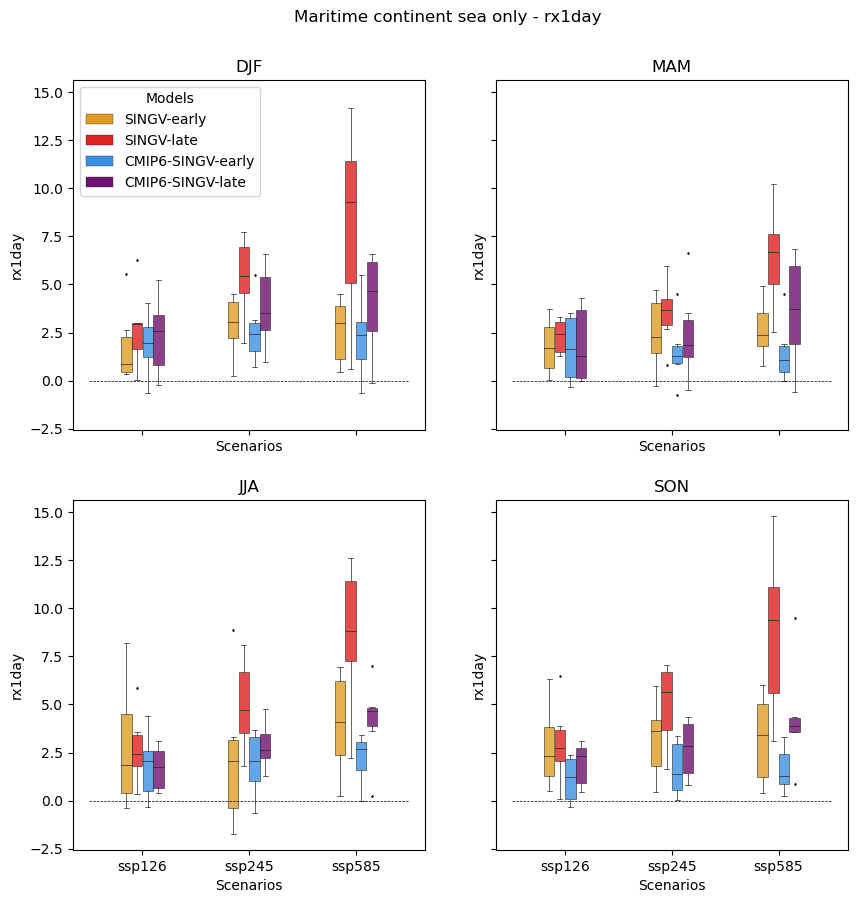

In [54]:
fig, ax = plt.subplots(2,2,figsize = (10,10), sharex =True, sharey =True)
ax=ax.flatten()
my_pal = {"SINGV-early": "orange", "SINGV-late": "red", "CMIP6-SINGV-early":"dodgerblue","CMIP6-SINGV-late":"purple"}

for itr, seas in enumerate(seastit) :
    df1 = pd.DataFrame(columns=['ssp126','ssp245','ssp585'], index = singv_hist.models.values)
    #df1['hist'] = rx1dayETCCDI_seas_mean.sel(season=seas,models=singv_hist.models.values).mean(dim=['lat','lon'])[varname_infile]
    df1['ssp126'] = (mask_sea['topo']*rx1dayETCCDI_seas_mean_ssp126_early[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon']) - (mask_sea['topo']*rx1dayETCCDI_seas_mean[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon'])
    df1['ssp245'] = (mask_sea['topo']*rx1dayETCCDI_seas_mean_ssp245_early[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon']) - (mask_sea['topo']*rx1dayETCCDI_seas_mean[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon'])
    df1['ssp585'] = (mask_sea['topo']*rx1dayETCCDI_seas_mean_ssp585_early[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon']) - (mask_sea['topo']*rx1dayETCCDI_seas_mean[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon'])
    #--
    df1_late = pd.DataFrame(columns=['ssp126','ssp245','ssp585'], index = singv_hist.models.values)
    #df1['hist'] = rx1dayETCCDI_seas_mean.sel(season=seas,models=singv_hist.models.values).mean(dim=['lat','lon'])[varname_infile]
    df1_late['ssp126'] = (mask_sea['topo']*rx1dayETCCDI_seas_mean_ssp126_late[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon']) - (mask_sea['topo']*rx1dayETCCDI_seas_mean[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon'])
    df1_late['ssp245'] = (mask_sea['topo']*rx1dayETCCDI_seas_mean_ssp245_late[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon']) - (mask_sea['topo']*rx1dayETCCDI_seas_mean[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon'])
    df1_late['ssp585'] = (mask_sea['topo']*rx1dayETCCDI_seas_mean_ssp585_late[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon']) - (mask_sea['topo']*rx1dayETCCDI_seas_mean[varname_infile].sel(season=seas,models=singv_hist.models.values)).mean(dim=['lat','lon'])
    #--
    df2 = pd.DataFrame(columns=['ssp126','ssp245','ssp585'], index = singv_hist.models.values)
    #df2['hist'] = singv_hist.sel(season=seas)[varname_infile]
    df2['ssp126'] = (mask_sea['topo']*singv_early_ssp126[varname_infile].sel(season=seas)).mean(dim=['lat','lon']) - (mask_sea['topo']*singv_hist[varname_infile].sel(season=seas)).mean(dim=['lat','lon'])
    df2['ssp245'] = (mask_sea['topo']*singv_early_ssp245[varname_infile].sel(season=seas)).mean(dim=['lat','lon']) - (mask_sea['topo']*singv_hist[varname_infile].sel(season=seas)).mean(dim=['lat','lon'])
    df2['ssp585'] = (mask_sea['topo']*singv_early_ssp585[varname_infile].sel(season=seas)).mean(dim=['lat','lon']) - (mask_sea['topo']*singv_hist[varname_infile].sel(season=seas)).mean(dim=['lat','lon'])
    #--
    df2_late = pd.DataFrame(columns=['ssp126','ssp245','ssp585'], index = singv_hist.models.values)
    #df2['hist'] = singv_hist.sel(season=seas)[varname_infile]
    df2_late['ssp126'] = (mask_sea['topo']*singv_late_ssp126[varname_infile].sel(season=seas)).mean(dim=['lat','lon']) - (mask_sea['topo']*singv_hist[varname_infile].sel(season=seas)).mean(dim=['lat','lon'])
    df2_late['ssp245'] = (mask_sea['topo']*singv_late_ssp245[varname_infile].sel(season=seas)).mean(dim=['lat','lon']) - (mask_sea['topo']*singv_hist[varname_infile].sel(season=seas)).mean(dim=['lat','lon'])
    df2_late['ssp585'] = (mask_sea['topo']*singv_late_ssp585[varname_infile].sel(season=seas)).mean(dim=['lat','lon']) - (mask_sea['topo']*singv_hist[varname_infile].sel(season=seas)).mean(dim=['lat','lon'])
    #--
    cdf = pd.concat([ df2.assign(Models='SINGV-early'),df2_late.assign(Models='SINGV-late'),df1.assign(Models='CMIP6-SINGV-early'),df1_late.assign(Models='CMIP6-SINGV-late')])    
    mdf = pd.melt(cdf, id_vars=['Models'], var_name=['Scenarios'])
    mdf = mdf.rename(columns={'value':varname})
    mdf
    sns.boxplot(ax=ax[itr],data=mdf,x='Scenarios',y=varname,hue='Models',linewidth = 0.5,fliersize = 1, width=0.4, boxprops=dict(alpha=.8),palette=my_pal)   
    ax[itr].set_title(seas)
    ax[itr].plot([-0.5, 2.5], [0., 0.], transform=ax[itr].transData,color='k',linestyle='--',linewidth=0.5)
    if itr >= 1 : ax[itr].legend([],[],frameon=False)


fig.suptitle('Maritime continent sea only - '+varname,y=0.95)
fig.savefig(path_out + '/' + varname + '/change/' + varname+'_boxplot_change_early_late_icclim_sea.jpg',dpi=400)

#### 3.2.4 Individual models region maps <a class="anchor" id="sub_section_3_2_4"></a>

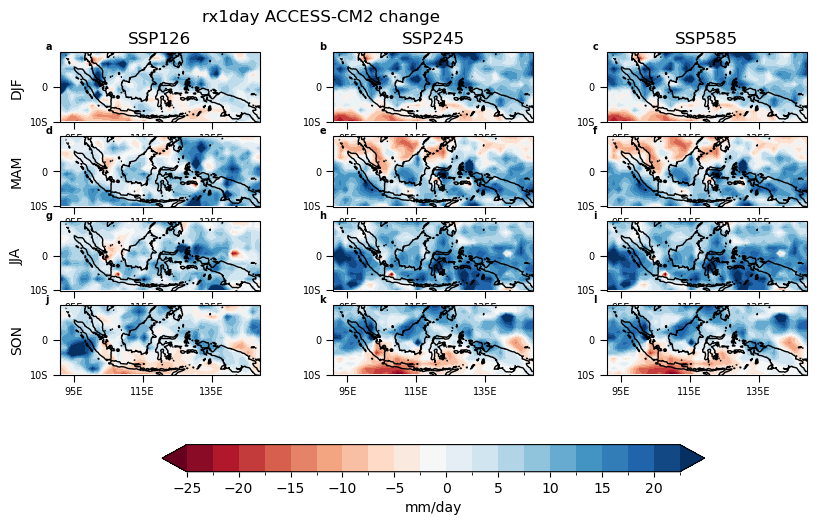

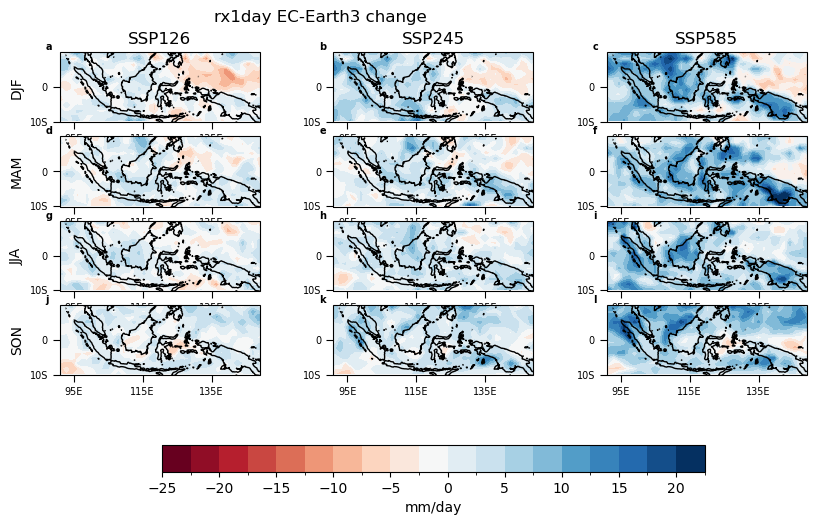

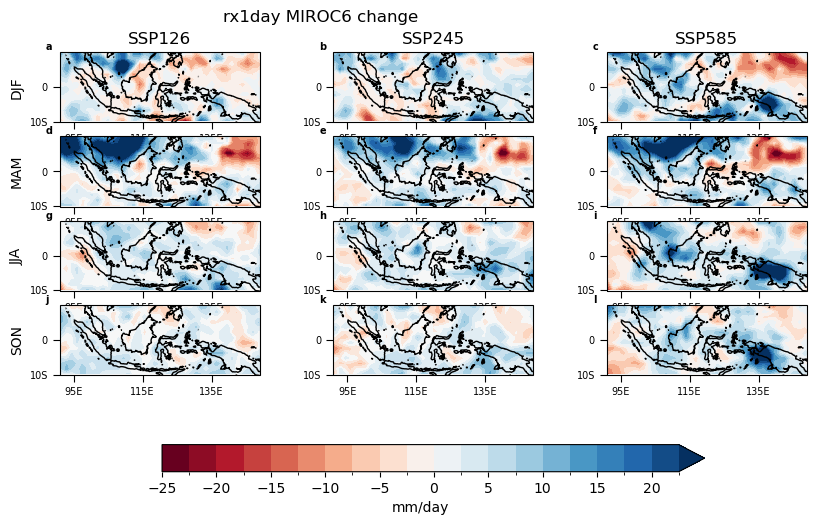

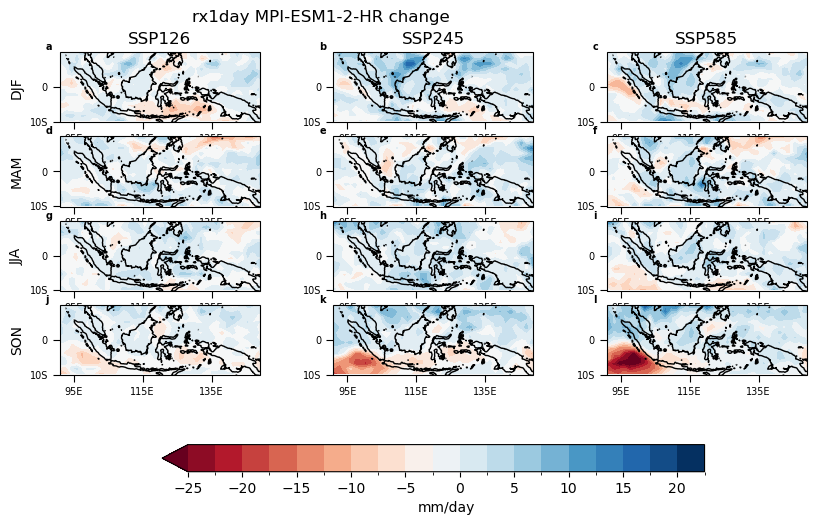

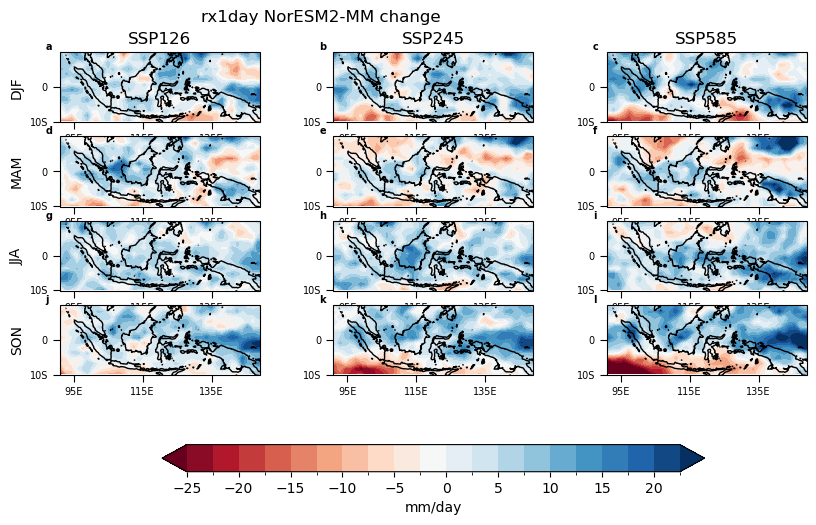

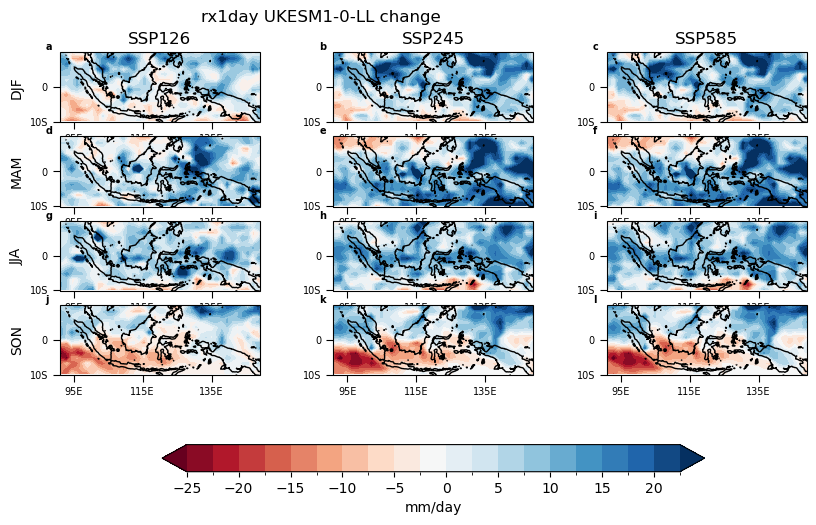

In [55]:
cmap = plt.get_cmap('RdBu')
if varname_infile == 'RX5day' or varname_infile == 'RX1day' :
    vmin=-25
    vmax=25
    incr=2.5
else :
    vmin=-5
    vmax=5
    incr=0.5

models = singv_hist.models.values
#models=['ACCESS-CM2']

for model in models:
#    ['ACCESS-CM2', 'EC-Earth3', 'MIROC6', 'MPI-ESM1-2-HR', 'NorESM2-MM',
#       'UKESM1-0-LL']
    fig, ax = plt.subplots(4,3,figsize = (10,6), sharex =True, sharey =True,subplot_kw=dict(projection=ccrs.PlateCarree()))
    ax=ax.flatten()

    for itr, seas in enumerate(seastit) :

        # rx1dayETCCDI_seas_mean.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile].plot.contourf( ax=ax[0],vmin=0,vmax=vmax, 
        #                         levels = np.arange(0,vmax,10),cmap = 'GnBu', add_colorbar=False)#, cbar_kwargs = {'label':'Correlation','shrink':1,'pad':0.01})
        (rx1dayETCCDI_seas_mean_ssp126_late-rx1dayETCCDI_seas_mean).sel(season=seas,models=[model],lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile].plot.contourf( ax=ax[itr*3],vmin=vmin,vmax=vmax, 
                                levels = np.arange(vmin,vmax,incr),cmap = cmap, add_colorbar=False)#, cbar_kwargs = {'label':'Correlation','shrink':1,'pad':0.01})
        (rx1dayETCCDI_seas_mean_ssp245_late-rx1dayETCCDI_seas_mean).sel(season=seas,models=[model],lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile].plot.contourf( ax=ax[itr*3+1],vmin=vmin,vmax=vmax, 
                                levels = np.arange(vmin,vmax,incr),cmap = cmap, add_colorbar=False)#, cbar_kwargs = {'label':'Correlation','shrink':1,'pad':0.01})
        mm = (rx1dayETCCDI_seas_mean_ssp585_late-rx1dayETCCDI_seas_mean).sel(season=seas,models=[model],lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile].plot.contourf( ax=ax[itr*3+2],vmin=vmin,vmax=vmax, 
                                levels = np.arange(vmin,vmax,incr),cmap = cmap, add_colorbar=False)#, cbar_kwargs = {'label':'Correlation','shrink':1,'pad':0.01})


    lab = ['a','b','c','d','e','f','g','h','i','j','k','l','m','n','o','p']
    for itr,axi in enumerate(ax) :
        limits = (91,149,-9,9)
        xaxis_interval = 20
        yaxis_interval = 10
        axi.set_extent(limits)
        axi.set_xticks(np.arange(limits[0]+4,limits[1]+1,xaxis_interval), crs=ccrs.PlateCarree())
        axi.set_yticks(np.arange(limits[2]-1,limits[3]+1,yaxis_interval), crs=ccrs.PlateCarree())
        lon_formatter = LongitudeFormatter(zero_direction_label=True, degree_symbol='')
        lat_formatter = LatitudeFormatter(degree_symbol='')
        axi.xaxis.set_major_formatter(lon_formatter)
        axi.yaxis.set_major_formatter(lat_formatter)
        axi.tick_params(direction = 'out', length = 5,labelsize=7)
        axi.set_aspect('equal', 'box')
        axi.set_xlabel('')
        axi.set_ylabel('')
        axi.annotate(lab[itr],(-0.07,1.03),xycoords=axi.transAxes, fontsize=7, fontweight='bold')
        axi.coastlines()

        if np.mod(itr,3) == 0  : axi.set_ylabel(seastit[int(itr/3)])
        axi.set_title('')
        if itr <= 2 : axi.set_title(xtit[itr])

    fig.suptitle(varname+' '+model+' change',y=0.95,x=0.4)
    if varname_infile == 'RX5day' or varname_infile == 'RX1day' :
        fig.colorbar(mm,ax=ax, shrink=0.7, label='mm/day',location='bottom')
    else :
        fig.colorbar(mm,ax=ax, shrink=0.7, label='Numbers',location='bottom')
    fig.savefig(path_out + '/' + varname + '/individual_model/' + varname+'-'+model+'_map_cmip6_icclim.jpg',dpi=400)


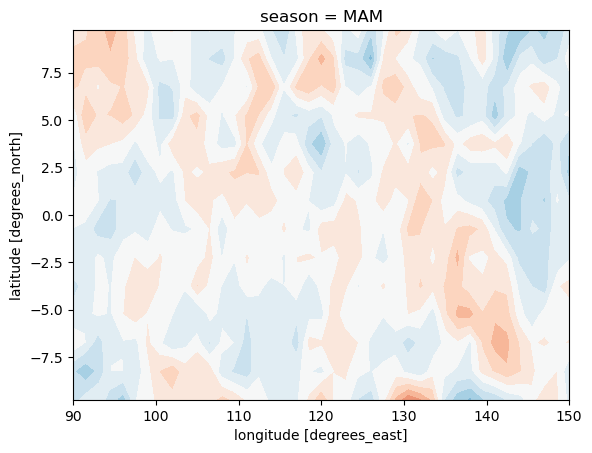

In [56]:

model='EC-Earth3'
seas='MAM'
(rx1dayETCCDI_seas_mean_ssp126_late-rx1dayETCCDI_seas_mean_ssp245_late).sel(season=seas,models=[model],lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile].plot.contourf( vmin=vmin,vmax=vmax, 
                levels = np.arange(vmin,vmax,incr),cmap = cmap, add_colorbar=False)#, cbar_kwargs = {'label':'Correlat

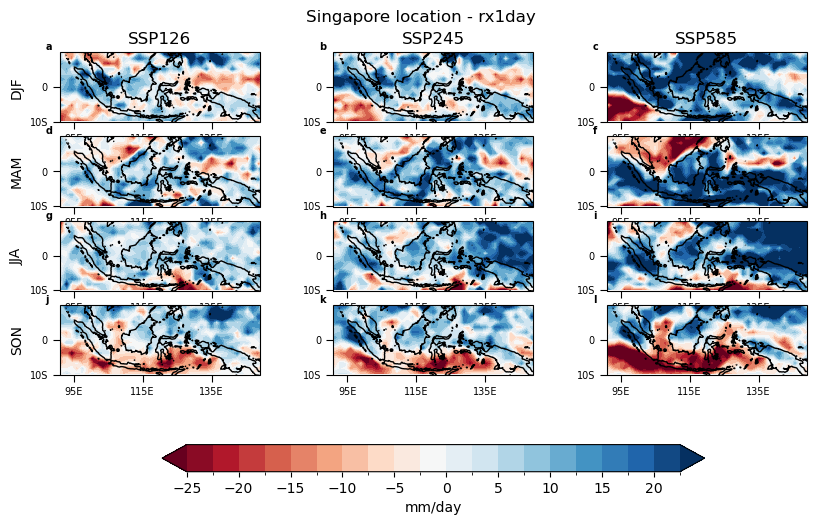

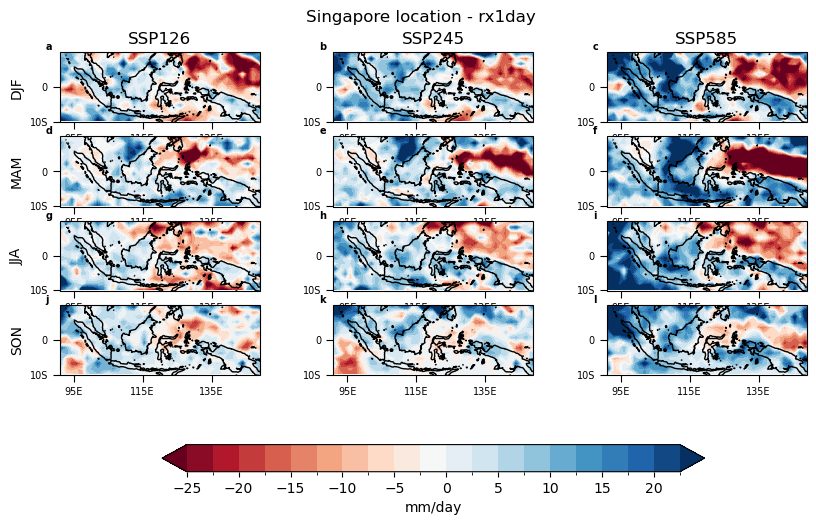

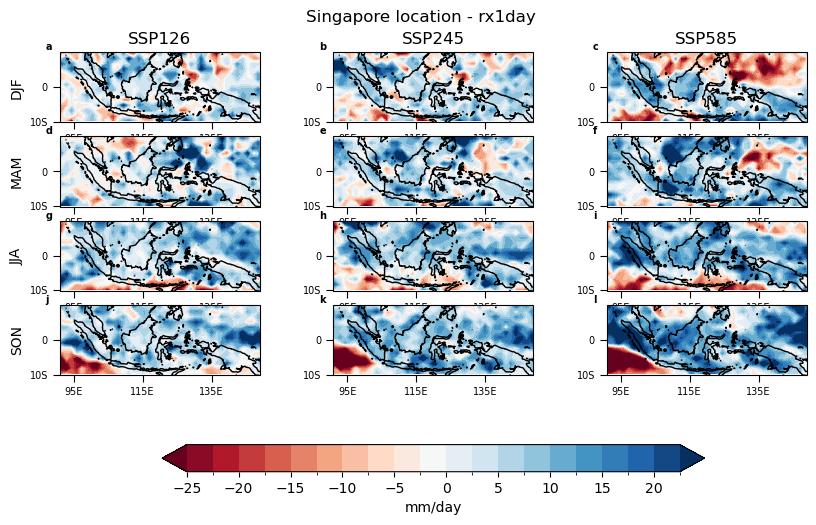

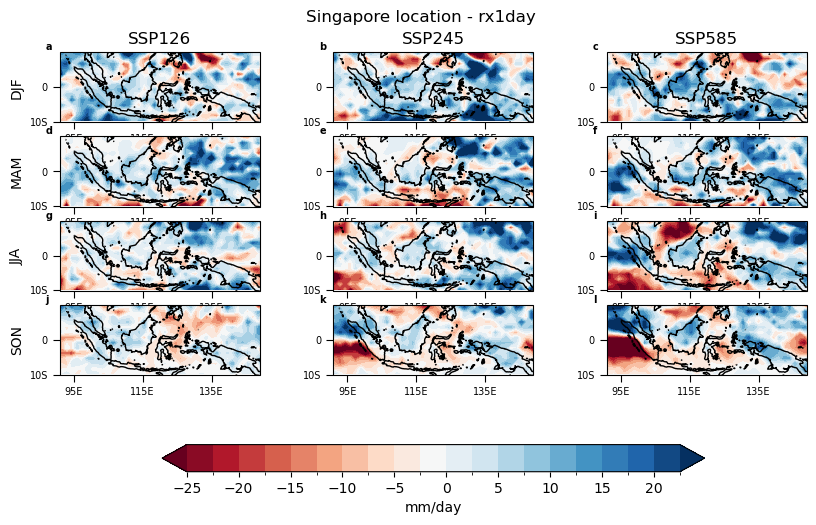

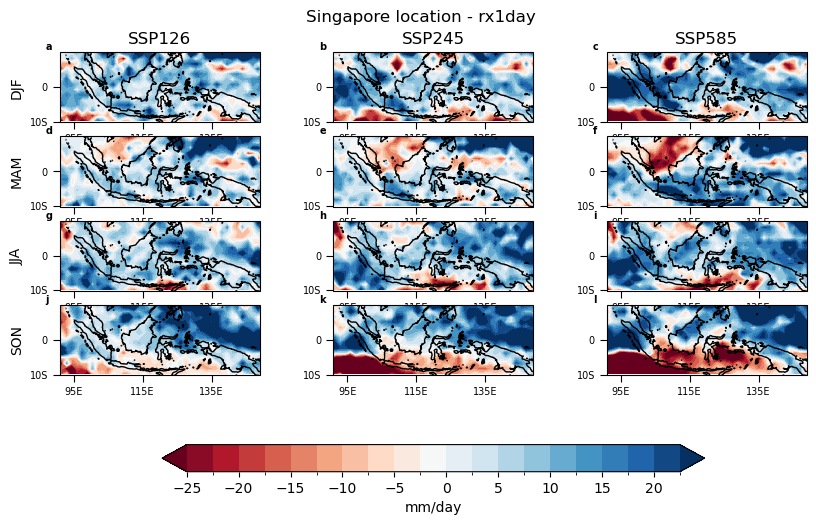

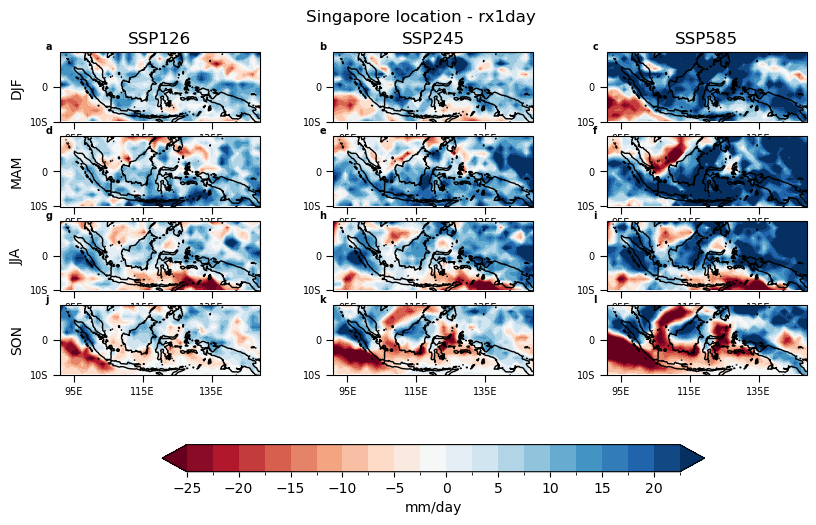

In [57]:
models = singv_hist.models.values
#models=['ACCESS-CM2']

for model in models:
#    ['ACCESS-CM2', 'EC-Earth3', 'MIROC6', 'MPI-ESM1-2-HR', 'NorESM2-MM',
#       'UKESM1-0-LL']
    fig, ax = plt.subplots(4,3,figsize = (10,6), sharex =True, sharey =True,subplot_kw=dict(projection=ccrs.PlateCarree()))
    ax=ax.flatten()

    for itr, seas in enumerate(seastit) :

        # rx1dayETCCDI_seas_mean.sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile].plot.contourf( ax=ax[0],vmin=0,vmax=vmax, 
        #                         levels = np.arange(0,vmax,10),cmap = 'GnBu', add_colorbar=False)#, cbar_kwargs = {'label':'Correlation','shrink':1,'pad':0.01})
        (singv_late_ssp126-singv_hist).sel(season=seas,models=[model],lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile].plot.contourf( ax=ax[itr*3],vmin=vmin,vmax=vmax, 
                                levels = np.arange(vmin,vmax,incr),cmap = cmap, add_colorbar=False)#, cbar_kwargs = {'label':'Correlation','shrink':1,'pad':0.01})
        (singv_late_ssp245-singv_hist).sel(season=seas,models=[model],lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile].plot.contourf( ax=ax[itr*3+1],vmin=vmin,vmax=vmax, 
                                levels = np.arange(vmin,vmax,incr),cmap = cmap, add_colorbar=False)#, cbar_kwargs = {'label':'Correlation','shrink':1,'pad':0.01})
        (singv_late_ssp585-singv_hist).sel(season=seas,models=[model],lat=slice(-10,10),lon=slice(90,150)).mean(dim='models')[varname_infile].plot.contourf( ax=ax[itr*3+2],vmin=vmin,vmax=vmax, 
                                levels = np.arange(vmin,vmax,incr),cmap = cmap, add_colorbar=False)#, cbar_kwargs = {'label':'Correlation','shrink':1,'pad':0.01})


    lab = ['a','b','c','d','e','f','g','h','i','j','k','l','m','n','o','p']
    for itr,axi in enumerate(ax) :
        limits = (91,149,-9,9)
        xaxis_interval = 20
        yaxis_interval = 10
        axi.set_extent(limits)
        axi.set_xticks(np.arange(limits[0]+4,limits[1]+1,xaxis_interval), crs=ccrs.PlateCarree())
        axi.set_yticks(np.arange(limits[2]-1,limits[3]+1,yaxis_interval), crs=ccrs.PlateCarree())
        lon_formatter = LongitudeFormatter(zero_direction_label=True, degree_symbol='')
        lat_formatter = LatitudeFormatter(degree_symbol='')
        axi.xaxis.set_major_formatter(lon_formatter)
        axi.yaxis.set_major_formatter(lat_formatter)
        axi.tick_params(direction = 'out', length = 5,labelsize=7)
        axi.set_aspect('equal', 'box')
        axi.set_xlabel('')
        axi.set_ylabel('')
        axi.annotate(lab[itr],(-0.07,1.03),xycoords=axi.transAxes, fontsize=7, fontweight='bold')
        axi.coastlines()

        if np.mod(itr,3) == 0  : axi.set_ylabel(seastit[int(itr/3)])
        axi.set_title('')
        if itr <= 2 : axi.set_title(xtit[itr])
        
    
    if varname_infile == 'RX5day' or varname_infile == 'RX1day' :
        fig.colorbar(mm,ax=ax, shrink=0.7, label='mm/day',location='bottom')
    else :
        fig.colorbar(mm,ax=ax, shrink=0.7, label='Numbers',location='bottom')
    fig.suptitle('Singapore location - '+varname,y=0.95)
    fig.savefig(path_out + '/' + varname + '/change/' + varname+'-'+model+'_map_singv_icclim.jpg',dpi=400)

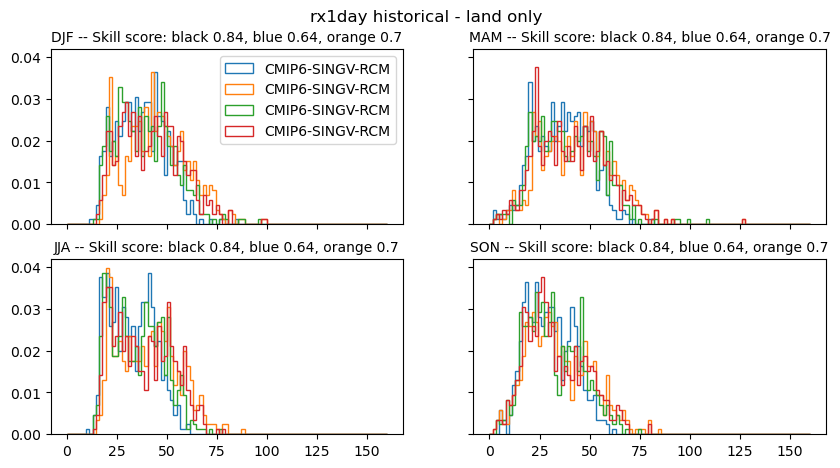

In [58]:
if varname_infile == 'RX5day' or varname_infile == 'RX1day' :
    binmax=160
    bins=100
else :
    binmax=50
    bins=50
    
fig, ax = plt.subplots(2,2,figsize = (10,5), sharex =True, sharey =True)
ax=ax.flatten()

for itr, seas in enumerate(seastit) :

    # (singv_hist[varname_infile]*mask_land).sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))['topo'].plot.hist(ax=ax[itr], bins = np.linspace(0,binmax,bins),color='k',label='SINGV-RCM', density=True,fill=0,histtype='step')
    (rx1dayETCCDI_seas_mean[varname_infile]*mask_land).sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))['topo'].plot.hist(ax=ax[itr], bins = np.linspace(0,binmax,bins),label='CMIP6-SINGV-RCM', density=True,histtype='step')
    # (rx1dayETCCDI_seas_mean[varname_infile]*mask_land).sel(season=seas,lat=slice(-10,10),lon=slice(90,150))['topo'].plot.hist(ax=ax[itr], bins = np.linspace(0,binmax,bins),label='CMIP6', density=True,histtype='step')
    # (PERSIANN_CCS_CDR_seas[varname_infile]*mask_land).sel(season=seas,lat=slice(-10,10),lon=slice(90,150))['topo'].plot.hist(ax=ax[itr], bins = np.linspace(0,binmax,bins),alpha=0.5,label='OBS', density=True)

    # (singv_late_ssp585[varname_infile]*mask_land).sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))['topo'].plot.hist(ax=ax[itr], bins = np.linspace(0,binmax,bins),color='k',label='SINGV-RCM', density=True,fill=0,histtype='step')
    (rx1dayETCCDI_seas_mean_ssp585_late[varname_infile]*mask_land).sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))['topo'].plot.hist(ax=ax[itr], bins = np.linspace(0,binmax,bins),label='CMIP6-SINGV-RCM', density=True,histtype='step')
    # (rx1dayETCCDI_seas_mean_ssp585_late[varname_infile]*mask_land).sel(season=seas,lat=slice(-10,10),lon=slice(90,150))['topo'].plot.hist(ax=ax[itr], bins = np.linspace(0,binmax,bins),label='CMIP6', density=True,histtype='step')

    (rx1dayETCCDI_seas_mean_ssp126_late[varname_infile]*mask_land).sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))['topo'].plot.hist(ax=ax[itr], bins = np.linspace(0,binmax,bins),label='CMIP6-SINGV-RCM', density=True,histtype='step')
    (rx1dayETCCDI_seas_mean_ssp245_late[varname_infile]*mask_land).sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))['topo'].plot.hist(ax=ax[itr], bins = np.linspace(0,binmax,bins),label='CMIP6-SINGV-RCM', density=True,histtype='step')

    # #-- Z skill score
    # obs_m = (PERSIANN_CCS_CDR_seas[varname_infile]*mask_land).sel(season=seas,lat=slice(-10,10),lon=slice(90,150))['topo'].mean()
    # obs_std = (PERSIANN_CCS_CDR_seas[varname_infile]*mask_land).sel(season=seas,lat=slice(-10,10),lon=slice(90,150))['topo'].std()
    # #--
    # CMIP6_singv_m = (rx1dayETCCDI_seas_mean[varname_infile]*mask_land).sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))['topo'].mean()
    # CMIP6_singv_std = (rx1dayETCCDI_seas_mean[varname_infile]*mask_land).sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))['topo'].std()
    # #--
    # CMIP6_m = (rx1dayETCCDI_seas_mean[varname_infile]*mask_land).sel(season=seas,lat=slice(-10,10),lon=slice(90,150))['topo'].mean()
    # CMIP6_std = (rx1dayETCCDI_seas_mean[varname_infile]*mask_land).sel(season=seas,lat=slice(-10,10),lon=slice(90,150))['topo'].std()
    # #--
    # singv_m = (singv_hist[varname_infile]*mask_land).sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))['topo'].mean()
    # singv_std = (singv_hist[varname_infile]*mask_land).sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))['topo'].std()
    # #-- 
    # z_singv = (singv_m - obs_m) / np.sqrt(singv_std*singv_std+obs_std*obs_std)
    # z_CMIP6_singv = (CMIP6_singv_m - obs_m) / np.sqrt(CMIP6_singv_std*CMIP6_singv_std+obs_std*obs_std)
    # z_CMIP6 = (CMIP6_m - obs_m) / np.sqrt(CMIP6_std*CMIP6_std+obs_std*obs_std)
    # #-- Perkins skill score
    # singv = (singv_hist[varname_infile]*mask_land).sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))['topo']
    # CMIP6_singv = (rx1dayETCCDI_seas_mean[varname_infile]*mask_land).sel(season=seas,models=singv_hist.models.values,lat=slice(-10,10),lon=slice(90,150))['topo']
    # CMIP6 = (rx1dayETCCDI_seas_mean[varname_infile]*mask_land).sel(season=seas,lat=slice(-10,10),lon=slice(90,150))['topo']
    # obs = (PERSIANN_CCS_CDR_seas[varname_infile]*mask_land).sel(season=seas,lat=slice(-10,10),lon=slice(90,150))['topo']
    # #-- calculates the area overlap of the two pdfs of std
    # kernel_obs = stats.gaussian_kde(obs.stack(z=['lat','lon']).dropna(dim='z').data)(np.linspace(0,binmax,bins))
    # kernel_singv = stats.gaussian_kde(singv.stack(z=['lat','lon','models']).dropna(dim='z').data)(np.linspace(0,binmax,bins))
    # kernel_CMIP6_singv = stats.gaussian_kde(CMIP6_singv.stack(z=['lat','lon','models']).dropna(dim='z').data)(np.linspace(0,binmax,bins))
    # kernel_CMIP6 = stats.gaussian_kde(CMIP6.stack(z=['lat','lon','models']).dropna(dim='z').data)(np.linspace(0,binmax,bins))
    
    # #-- Calculate the area of the overlap
    # skill_singv = binmax/bins * np.minimum(kernel_obs, kernel_singv).sum()  
    # skill_CMIP6_singv = binmax/bins * np.minimum(kernel_obs, kernel_CMIP6_singv).sum()  
    # skill_CMIP6 = binmax/bins * np.minimum(kernel_obs, kernel_CMIP6).sum()  
    
    #ax[itr].xscale('log')
    if itr == 0 : ax[itr].legend()
    ax[itr].set_xlabel('')
    ax[itr].set_title(seastit[itr]+' -- Skill score: black '+str(np.round(skill_singv,2))+', blue '+str(np.round(skill_CMIP6_singv,2))+', orange '+str(np.round(skill_CMIP6.data,2)),size=10)
    
fig.suptitle(varname+' historical - land only',y=0.96,x=0.5)
fig.savefig(path_out +'/'+ varname +'/evaluation/'+ varname+'-historical-hist-land.jpg',dpi=400)
